In [1]:
import xarray as xr
import matplotlib.pyplot as plt 
import seaborn as sns
import cartopy.crs as ccrs
import seaborn.objects as so
import numpy as np
from dask.distributed import LocalCluster, Client
import flox.xarray
import xesmf as xe
from tqdm.notebook import tqdm
import dask.bag as db
proj = ccrs.NorthPolarStereo(0,70)
import pandas as pd
plt.style.use('robin')

In [2]:
cluster = LocalCluster(n_workers=6, memory_limit='16GiB')
client = Client(cluster)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 6
Total threads: 66,Total memory: 96.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:41579,Workers: 0
Dashboard: http://127.0.0.1:8787/status,Total threads: 0
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:38249,Total threads: 11
Dashboard: http://127.0.0.1:36199/status,Memory: 16.00 GiB
Nanny: tcp://127.0.0.1:42797,


In [3]:
# run_id = '3w874ud3'
run_id = '0obl1joe'

ds_attrs = xr.open_dataset(f'/Data/gfi/users/rogui7909/data/NN_outputs/attributions/newproj/{run_id}_attributions.nc')
grid = ds_attrs.isel(time_of_event=0, timestep_past=0, var_name=0).features
lrp_normed = ds_attrs.attributions_lrp 
lrp_normed = lrp_normed.sum('var_name')/lrp_normed.sum('var_name').max(['x','y'])
ds_attrs['lrp_normed'] = lrp_normed
ig_normed = ds_attrs.attributions_ig 
ig_normed = ig_normed/ig_normed.sum('var_name').max(['x','y'])
# cycs = cycs.query("msl<100000")


# Load cyclone data and convert to x,y northpolarstereo

In [4]:
cycs = xr.open_dataset('/Data/gfi/spengler/kko033/cyclone_clustering/data/all_combined_NH_trcks.nc').to_dataframe()
xy = proj.transform_points(ccrs.PlateCarree(), cycs['lon'].values, cycs['lat'].values)
cycs['x'] = xy[:, 0]
cycs['y'] = xy[:, 1]
daily_cycs = cycs.groupby([cycs.date.dt.date.rename('day'), 'track_id'])[['lon','lat','x','y','msl']].agg(dict(lon='mean', lat='mean', x='mean', y='mean', msl='min')).reset_index()
daily_cycs['date'] = pd.to_datetime(daily_cycs.day)
daily_cycs.index = pd.to_datetime(daily_cycs.day)
daily_cycs['msl'] = daily_cycs['msl'] / 100  # Convert to hPa
x_min, x_max, y_min, y_max = ds_attrs.x.min().values, ds_attrs.x.max().values, ds_attrs.y.min().values, ds_attrs.y.max().values
daily_cycs = daily_cycs.query(f"(x>{x_min})&(x<{x_max})&(y>{y_min})&(y<{y_max})")
daily_cycs.track_id = daily_cycs.track_id.astype(str).astype(int)


# Example plot

/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/pyproj/transformer.py:816: UserWarning: Warning: converting a masked element to nan.
  return self._transformer._transform_point(


<GeoAxes: title={'center': '2002-01-28  |  6 days before the event'}, xlabel='x', ylabel='y'>

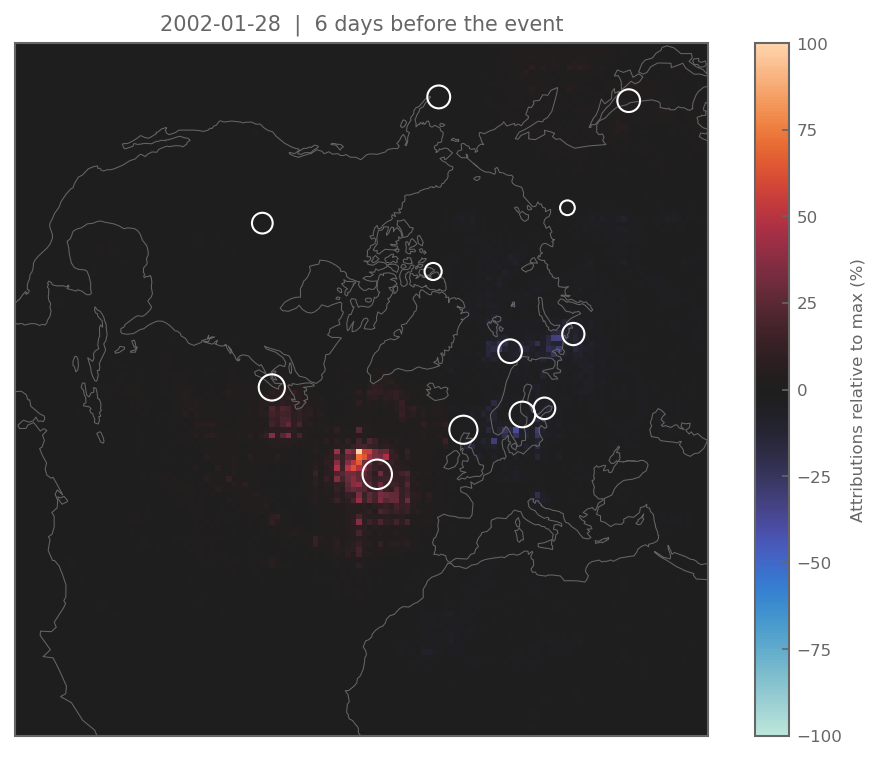

In [24]:
# time = ds_attrs.time_of_event.isel(time_of_event=20).values
time = ds_attrs.time_of_event.isel(time_of_event=30).values

# ds_ = lrp_normed.sel(time_of_event=time).sum('var_name')
# # ds_ = ds_/ds_.max(['x','y'])
# plot = ds_.plot(col='timestep_past', subplot_kws={'projection':proj}, transform=proj, col_wrap=4)



plot = (100*lrp_normed).sel(time_of_event=time, timestep_past=-6).plot( subplot_kws=dict(projection=proj), transform=proj,size=6, cmap='icefire', cbar_kwargs=dict(label='Attributions relative to max (%)'))
ax= plot.axes
k=0
ax.coastlines(color='.4', linewidth=.5)
time_ = time +(k-6)*pd.Timedelta('1D')
ax.set_title(pd.to_datetime(time).strftime("%Y-%m-%d")+'  |  6 days before the event')
cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
cyclones_.loc[:,'size'] = 1050 - cyclones_.msl
track_id_ = ds_attrs.distance_to_cyclones.sel(time_of_event=time).track_id.isel(timestep_past=k).dropna('n_cyclone').values.astype(int)
# important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k)[:track_id_.size].values
# important_cyclones_ = pd.Series(important_cyclones_, index = track_id_)
# cyclones_['important'] = important_cyclones_
sns.scatterplot(cyclones_, x='x', y='y', transform=proj, ax=ax, size='size', sizes= (50,200), legend=False, edgecolor='1', linewidth=1, zorder=100, color=None, facecolor='none',)

    # break

# Compute all distances to cyclone

In [6]:
grid_stack = grid.stack(space=['y','x'])

def get_distance_per_day(day):
    day_str = day.strftime('%Y-%m-%d')
    cyclones_day = daily_cycs.loc[day_str].to_xarray().rename(day='n_cyclone')
    cyclones_day = cyclones_day.assign_coords(n_cyclone=np.arange(cyclones_day.n_cyclone.size))
    distance = np.sqrt((grid_stack.x - cyclones_day.x)**2 + (grid_stack.y - cyclones_day.y)**2).unstack('space')
    distance = distance.assign_coords(track_id=cyclones_day.track_id, lon=cyclones_day.lon, lat=cyclones_day.lat)
    # per_quadrant_distance = distance.groupby(cyclones_day.poly_id).min()
    return distance

def get_distance_per_day_of_event(day):
    all_distances = []
    day0 = day 
    for k in range(7):
        distance_day = get_distance_per_day(day0 - np.timedelta64(k, 'D'))
        all_distances.append(distance_day.assign_coords(timestep_past=-k))
    return xr.concat(all_distances[::-1], dim='timestep_past').assign_coords(time_of_event=day)
    

list_times = pd.to_datetime([time for time in ds_attrs.time_of_event.values if time in daily_cycs.date.unique()])
bag = db.from_sequence(list_times, npartitions=100)
results = bag.map(get_distance_per_day_of_event)
all_distances = xr.concat(results, dim='time_of_event')/1000
ds_attrs['distance_to_cyclones'] = all_distances

/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/distributed/client.py:3363: UserWarning: Sending large graph of size 18.45 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/tmp/ipykernel_1350550/3097462341.py:18: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these coordinates (dimensions): 'n_cyclone' ('n_cyclone',) The recommendation is to set join explicitly for this case.
/tmp/ipykernel_1350550/3097462341.py:18: FutureWarning: In a future version of xarray the default value for join will change from join='outer' 

# Sort attributions by distance

In [25]:
dist_to_all_cycs = ds_attrs.distance_to_cyclones.min('n_cyclone')
ds_ = xr.Dataset(dict(dist_to_all_cycs=dist_to_all_cycs, lrp_normed = ds_attrs.lrp_normed, 
                      fake_dist=dist_to_all_cycs.isel(time_of_event=np.random.permutation(dist_to_all_cycs.sizes["time_of_event"])).assign_coords(time_of_event = dist_to_all_cycs.time_of_event)))

In [301]:
all_ds_lrp = []
for k in tqdm(range(7)):
    df_ = ds_.isel(timestep_past=k).to_dataframe().reset_index().sort_values('dist_to_all_cycs').reset_index().reset_index()
    df_['bins'] = df_.level_0//(128*235)
    df_lrp = df_.set_index('bins').reset_index().groupby('bins').lrp_normed.apply(lambda x:pd.Series(x.values)).unstack().T.apply(np.sort).apply(np.flip)
    df_dist = df_.set_index('bins').reset_index().groupby('bins').dist_to_all_cycs.min()
    ds_lrp = df_lrp.stack().to_xarray().rename('attribution').rename(level_0='pixel', bins='distance_to_cyclone')*100
    ds_lrp = ds_lrp.assign_coords(distance_to_cyclone=df_dist.values)
    ds_lrp = ds_lrp.assign_coords(pixel=np.linspace(0,100,ds_lrp.pixel.size)).clip(max=100, min=-100)
    all_ds_lrp.append(ds_lrp)

# (ds_lrp).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), cmap='RdBu_r', yincrease=True)

  0%|          | 0/7 [00:00<?, ?it/s]

In [26]:
df_ = ds_.to_dataframe().reset_index().sort_values('dist_to_all_cycs').reset_index().reset_index()
df_['bins'] = df_.level_0//(128*235*7)
df_lrp = df_.set_index('bins').reset_index().groupby('bins').lrp_normed.apply(lambda x:pd.Series(x.values)).unstack().T.apply(np.sort).apply(np.flip)
df_dist = df_.set_index('bins').reset_index().groupby('bins').dist_to_all_cycs.min()
ds_lrp = df_lrp.stack().to_xarray().rename('attribution').rename(level_0='pixel', bins='distance_to_cyclone')*100
ds_lrp = ds_lrp.assign_coords(distance_to_cyclone=df_dist.values)
ds_lrp_total = ds_lrp.assign_coords(pixel=ds_lrp.pixel[::-1])#.assign_coords(pixel=np.linspace(0,100,ds_lrp.pixel.size)).clip(max=100, min=-100)


In [27]:
df_ = ds_.to_dataframe().reset_index().sort_values('fake_dist').reset_index().reset_index()
df_['bins'] = df_.level_0//(128*235*7)
df_lrp = df_.set_index('bins').reset_index().groupby('bins').lrp_normed.apply(lambda x:pd.Series(x.values)).unstack().T.apply(np.sort).apply(np.flip)
df_dist = df_.set_index('bins').reset_index().groupby('bins').fake_dist.min()
ds_lrp = df_lrp.stack().to_xarray().rename('attribution').rename(level_0='pixel', bins='distance_to_cyclone')*100
ds_lrp = ds_lrp.assign_coords(distance_to_cyclone=df_dist.values)
ds_lrp_fakedist_total = ds_lrp.assign_coords(pixel=ds_lrp.pixel[::-1])#np.linspace(0,100,ds_lrp.pixel.size)).clip(max=100, min=-100)


In [257]:
all_ds_lrp_fake = []
for k in tqdm(range(7)):
    df_ = ds_.isel(timestep_past=k).to_dataframe().reset_index().sort_values('fake_dist').reset_index().reset_index()
    df_['bins'] = df_.level_0//(128*235)
    df_lrp = df_.set_index('bins').reset_index().groupby('bins').lrp_normed.apply(lambda x:pd.Series(x.values)).unstack().T.apply(np.sort).apply(np.flip)
    df_dist = df_.set_index('bins').reset_index().groupby('bins').fake_dist.min()
    ds_lrp = df_lrp.stack().to_xarray().rename('attribution').rename(level_0='pixel', bins='distance_to_cyclone')*100
    ds_lrp = ds_lrp.assign_coords(distance_to_cyclone=df_dist.values)
    ds_lrp = ds_lrp.assign_coords(pixel=np.linspace(0,100,ds_lrp.pixel.size)).clip(max=100, min=-100)
    all_ds_lrp_fake.append(ds_lrp)

# (ds_lrp).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), cmap='RdBu_r', yincrease=True)

  0%|          | 0/7 [00:00<?, ?it/s]

Text(0.5, 1.0, 'Randomized time for\ndistances to cyclones')

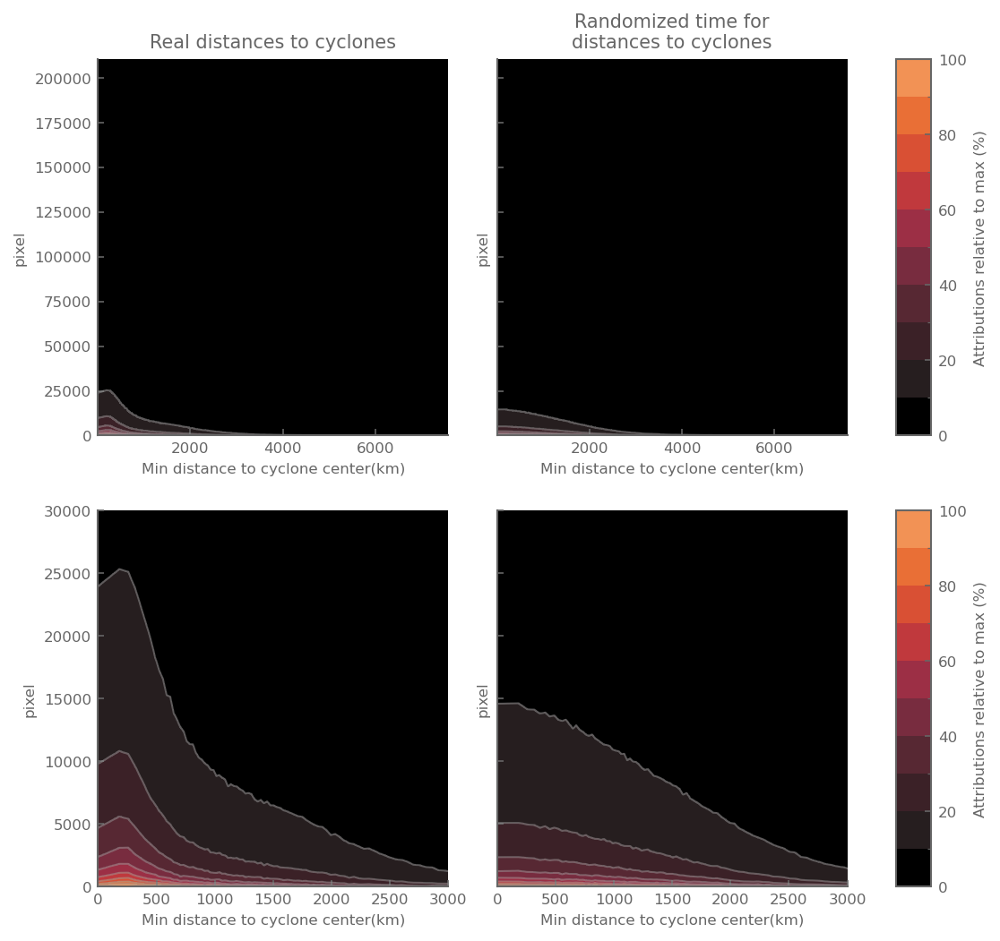

In [28]:
# ds_lrp_total.plot.contourf(levels=np.arange(0,100,10), cmap='Reds')
fig, axs = plt.subplots(2,3,figsize=(8,8), width_ratios=[10,10,1],)
cmap= sns.color_palette('icefire', n_colors=20)[9:]
cmap[0] = [0,0,0]
(ds_lrp_total.clip(0)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(0,101,10), colors=cmap, yincrease=True, ax=axs[0,0], cbar_ax=axs[0,2])
(ds_lrp_total.clip(0)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(0,101,10), colors=cmap, yincrease=True, ax=axs[1,0], cbar_ax=axs[0,2])
(ds_lrp_fakedist_total.clip(0)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(0,101,10), colors=cmap, yincrease=True, ax=axs[0,1], cbar_ax=axs[1,2])
(ds_lrp_fakedist_total.clip(0)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(0,101,10), colors=cmap, yincrease=True, ax=axs[1,1], cbar_ax=axs[1,2])

(ds_lrp_total.clip(0)).isel(distance_to_cyclone=slice(0,-1)).plot.contour(levels=np.arange(10,101,10), colors='.6', yincrease=True, ax=axs[0,0], alpha=.5)
(ds_lrp_total.clip(0)).isel(distance_to_cyclone=slice(0,-1)).plot.contour(levels=np.arange(10,101,10), colors='.6', yincrease=True, ax=axs[1,0], alpha=.5)
(ds_lrp_fakedist_total.clip(0)).isel(distance_to_cyclone=slice(0,-1)).plot.contour(levels=np.arange(10,101,10), colors='.6', yincrease=True, ax=axs[0,1], alpha=.5)
(ds_lrp_fakedist_total.clip(0)).isel(distance_to_cyclone=slice(0,-1)).plot.contour(levels=np.arange(10,101,10), colors='.6', yincrease=True, ax=axs[1,1], alpha=.5)

axs[1,0].set_ylim(0,30000)
axs[1,0].set_xlim(0,3000)
axs[1,1].set_ylim(0,30000)
axs[1,1].set_xlim(0,3000)

axs[0,1].tick_params(labelleft=False)
axs[1,1].tick_params(labelleft=False)
# axs[0,1].set_ylim(0,300000)
# axs[0,1].set_xlim(0,15000)
for k,ax in enumerate(axs.flat):
    if k%3==2:
        ax.set_ylabel('Attributions relative to max (%)')
        continue
    ax.set(xlabel='Min distance to cyclone center(km)')
axs[0,0].set_title('Real distances to cyclones')
axs[0,1].set_title('Randomized time for\ndistances to cyclones')

# axs[0,0].indicate_inset(inset_ax=axs[1,0], zorder=100, edgecolor='blue')
# axs[0,1].indicate_inset(inset_ax=axs[1,1], zorder=100)
# ax.set_ylim(0,20)
# ds_lrp_fakedist_total.plot.contour(levels=np.arange(10,100,10))

<Axes: xlabel='lrp_bins', ylabel='distance_bins'>

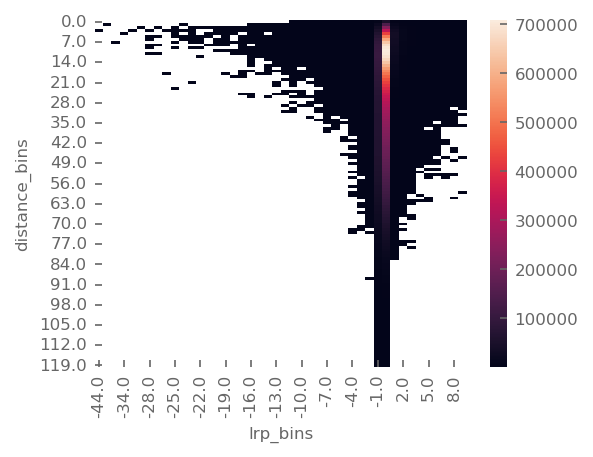

In [327]:
df_['distance_bins'] = df_.dist_to_all_cycs//100
df_['lrp_bins'] = df_.lrp_normed//.1
sns.heatmap(df_.groupby(['distance_bins','lrp_bins']).time_of_event.count().unstack())

In [29]:
df_ = ds_.to_dataframe().reset_index().sort_values('lrp_normed').reset_index().reset_index().query("lrp_normed>=0")
df_['lrp_bins'] = pd.cut(df_['lrp_normed']*100, np.arange(0,100.1,10))#.map(lambda x:x.right)
ds_dist_all = df_.groupby('lrp_bins').quantile(np.arange(0,1.01,.01)).dist_to_all_cycs.to_xarray().rename(level_1='pixel').T

df_ = ds_.to_dataframe().reset_index().sort_values('lrp_normed').reset_index().reset_index().query("lrp_normed>=0")
df_['lrp_bins'] = pd.cut(df_['lrp_normed']*100, np.arange(0,100.1,10))#.map(lambda x:x.right)
ds_fakedist_all = df_.groupby('lrp_bins').quantile(np.arange(0,1.01,.01)).fake_dist.to_xarray().rename(level_1='pixel').T

# ds_dist=ds_dist.assign_coords(pixel=100*ds_dist.pixel)
# ds_dist=ds_dist.assign_coords(lrp_bins=100*ds_dist.lrp_bins)

/tmp/ipykernel_1350550/1859696650.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ds_dist_all = df_.groupby('lrp_bins').quantile(np.arange(0,1.01,.01)).dist_to_all_cycs.to_xarray().rename(level_1='pixel').T
/tmp/ipykernel_1350550/1859696650.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ds_fakedist_all = df_.groupby('lrp_bins').quantile(np.arange(0,1.01,.01)).fake_dist.to_xarray().rename(level_1='pixel').T


(0.0, 4000.0)

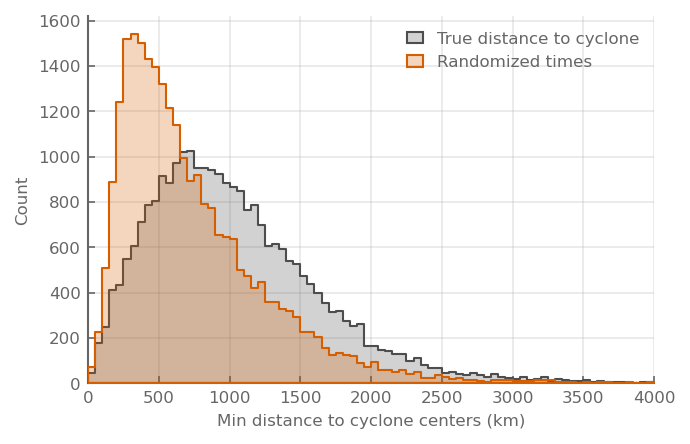

In [42]:
df__ = df_.query("lrp_normed>.5")[['dist_to_all_cycs','fake_dist']].stack().reset_index()
df__.columns = ['index','distance_type','distance']
sns.displot(df__, x='distance', hue='distance_type', element="step",  height=3, palette=['C3','.3'], bins=np.arange(0,4001,50), aspect=1.5, zorder=100, legend=False)
plt.grid(linestyle='-', zorder=0, alpha=.3)
plt.xlabel('Min distance to cyclone centers (km)')
plt.legend(['True distance to cyclone','Randomized times'])
plt.xlim(0,4000)

/tmp/ipykernel_1302667/231808283.py:42: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axs['A'].legend()


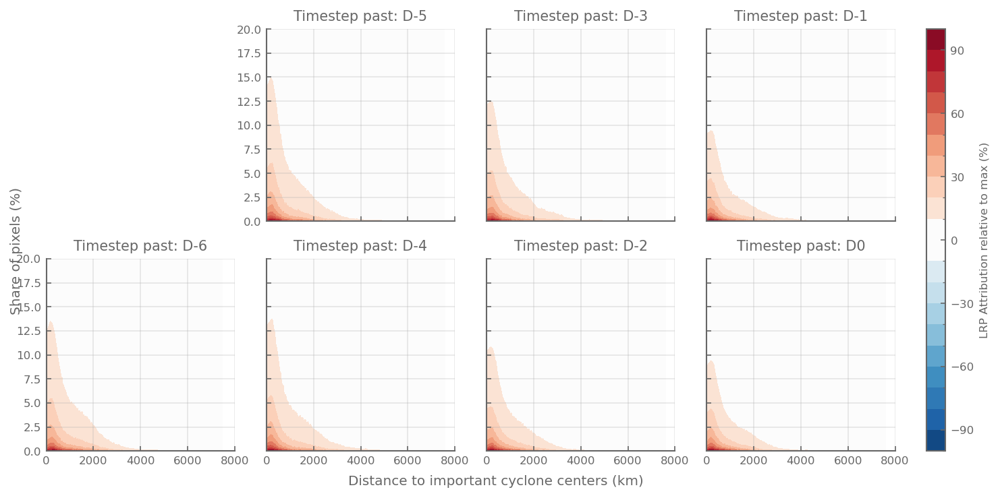

In [133]:
fig, axs = plt.subplot_mosaic("""
                               .BDFh
                               ACEGh
                               """, 
                               width_ratios = [10,10,10,10,1],
                               figsize=(10,5),
                            #    sharex=''
                               )


cmap = sns.color_palette('RdBu_r', 20)
cmap[9] = (0.99,0.99,0.99)
cmap[10] = (0.99,0.99,0.99)
# cmap = cmap[6:]

(all_ds_lrp[0].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['A'], cbar_ax=axs['h'])
(all_ds_lrp[1].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['B'], cbar_ax=axs['h'])
(all_ds_lrp[2].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['C'], cbar_ax=axs['h'])
(all_ds_lrp[3].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['D'], cbar_ax=axs['h'])
(all_ds_lrp[4].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['E'], cbar_ax=axs['h'])
(all_ds_lrp[5].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['F'], cbar_ax=axs['h'])
(all_ds_lrp[6].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['G'], cbar_ax=axs['h'])

for k,letter in enumerate(['A','B','C','D','E','F','G']):
    # all_ds_lrp[k].mean('pixel').plot(ax=axs[letter], color='.3', ls='--',label='Mean attribution')
    axs[letter].set_ylim(0,100)
    axs[letter].set_xlim(0,8000)
    axs[letter].set_title(f'Timestep past: D{-(6-k)}')
    axs[letter].set_xlabel('')
    axs[letter].set_ylim(0,100)
    axs[letter].set_ylim(0,20)
    axs[letter].grid(ls='-', alpha=0.3)
for k,letter in enumerate(['C','D','E','F','G']):
    axs[letter].set_ylabel('')
    axs[letter].tick_params(labelleft=False)

for k,letter in enumerate(['B','D','F']):
    axs[letter].set_xlabel('')
    axs[letter].tick_params(labelbottom=False)
axs['B'].set_ylabel('')
axs['A'].set_ylabel('')
axs['A'].legend()

axs['h'].set_ylabel('LRP Attribution relative to max (%)')
fig.supylabel('Share of pixels (%)')
fig.supxlabel('Distance to important cyclone centers (km)',y =.03)

plt.tight_layout()

/tmp/ipykernel_1302667/1791709289.py:42: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axs['A'].legend()


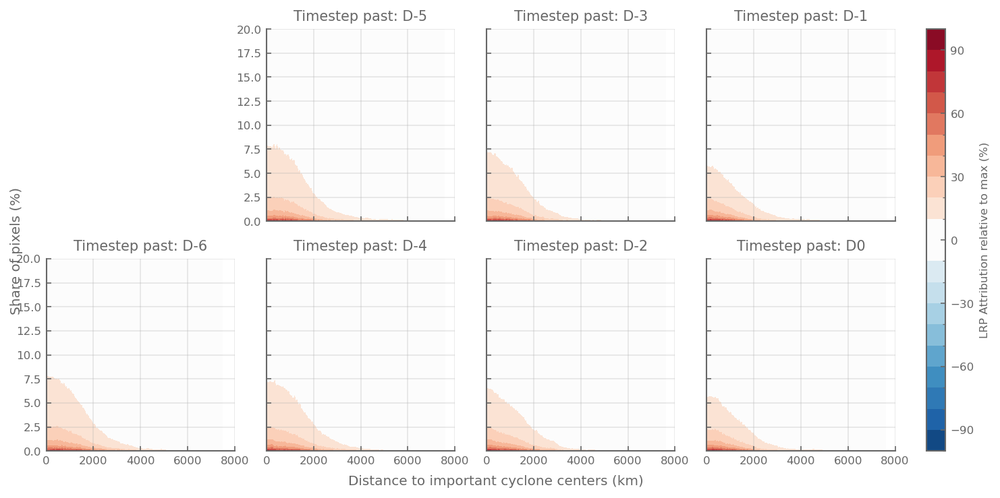

In [94]:
fig, axs = plt.subplot_mosaic("""
                               .BDFh
                               ACEGh
                               """, 
                               width_ratios = [10,10,10,10,1],
                               figsize=(10,5),
                            #    sharex=''
                               )


cmap = sns.color_palette('RdBu_r', 20)
cmap[9] = (0.99,0.99,0.99)
cmap[10] = (0.99,0.99,0.99)
# cmap = cmap[6:]

(all_ds_lrp_fake[0].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['A'], cbar_ax=axs['h'])
(all_ds_lrp_fake[1].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['B'], cbar_ax=axs['h'])
(all_ds_lrp_fake[2].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['C'], cbar_ax=axs['h'])
(all_ds_lrp_fake[3].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['D'], cbar_ax=axs['h'])
(all_ds_lrp_fake[4].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['E'], cbar_ax=axs['h'])
(all_ds_lrp_fake[5].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['F'], cbar_ax=axs['h'])
(all_ds_lrp_fake[6].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['G'], cbar_ax=axs['h'])

for k,letter in enumerate(['A','B','C','D','E','F','G']):
    # all_ds_lrp_fake[k].mean('pixel').plot(ax=axs[letter], color='.3', ls='--',label='Mean attribution')
    axs[letter].set_ylim(0,100)
    axs[letter].set_xlim(0,8000)
    axs[letter].set_title(f'Timestep past: D{-(6-k)}')
    axs[letter].set_xlabel('')
    axs[letter].set_ylim(0,100)
    axs[letter].set_ylim(0,20)
    axs[letter].grid(ls='-', alpha=0.3)
for k,letter in enumerate(['C','D','E','F','G']):
    axs[letter].set_ylabel('')
    axs[letter].tick_params(labelleft=False)

for k,letter in enumerate(['B','D','F']):
    axs[letter].set_xlabel('')
    axs[letter].tick_params(labelbottom=False)
axs['B'].set_ylabel('')
axs['A'].set_ylabel('')
axs['A'].legend()

axs['h'].set_ylabel('LRP Attribution relative to max (%)')
fig.supylabel('Share of pixels (%)')
fig.supxlabel('Distance to important cyclone centers (km)',y =.03)

plt.tight_layout()

In [ ]:
fig, axs = plt.subplot_mosaic("""
                               .BDFh
                               ACEGh
                               """, 
                               width_ratios = [10,10,10,10,1],
                               figsize=(10,5),
                            #    sharex=''
                               )


cmap = sns.color_palette('RdBu_r', 20)
cmap[9] = (0.99,0.99,0.99)
cmap[10] = (0.99,0.99,0.99)
# cmap = cmap[6:]

(all_ds_lrp[0].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['A'], cbar_ax=axs['h'])
(all_ds_lrp[1].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['B'], cbar_ax=axs['h'])
(all_ds_lrp[2].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['C'], cbar_ax=axs['h'])
(all_ds_lrp[3].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['D'], cbar_ax=axs['h'])
(all_ds_lrp[4].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['E'], cbar_ax=axs['h'])
(all_ds_lrp[5].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['F'], cbar_ax=axs['h'])
(all_ds_lrp[6].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['G'], cbar_ax=axs['h'])

for k,letter in enumerate(['A','B','C','D','E','F','G']):
    # all_ds_lrp[k].mean('pixel').plot(ax=axs[letter], color='.3', ls='--',label='Mean attribution')
    axs[letter].set_ylim(0,100)
    axs[letter].set_xlim(0,8000)
    axs[letter].set_title(f'Timestep past: D{-(6-k)}')
    axs[letter].set_xlabel('')
    axs[letter].set_ylim(0,100)
    axs[letter].set_ylim(0,20)
    axs[letter].grid(ls='-', alpha=0.3)
for k,letter in enumerate(['C','D','E','F','G']):
    axs[letter].set_ylabel('')
    axs[letter].tick_params(labelleft=False)

for k,letter in enumerate(['B','D','F']):
    axs[letter].set_xlabel('')
    axs[letter].tick_params(labelbottom=False)
axs['B'].set_ylabel('')
axs['A'].set_ylabel('')
axs['A'].legend()

axs['h'].set_ylabel('LRP Attribution relative to max (%)')
fig.supylabel('Share of pixels (%)')
fig.supxlabel('Distance to important cyclone centers (km)',y =.03)

plt.tight_layout()

# Distance

In [42]:
all_ds_dist = []
for k in range(7):
    df_ = ds_.isel(timestep_past=k).clip(-100).to_dataframe().reset_index().sort_values('lrp_normed').reset_index().reset_index().query("lrp_normed>=0")
    df_['lrp_bins'] = pd.cut(df_['lrp_normed']*100, np.arange(0,100.1,10))#.map(lambda x:x.right)
    ds_dist = df_.groupby('lrp_bins').quantile(np.arange(0,1.01,.01)).dist_to_all_cycs.to_xarray().rename(level_1='pixel').T
    ds_dist=ds_dist.assign_coords(pixel=100*ds_dist.pixel)
    # ds_dist=ds_dist.assign_coords(lrp_bins=100*ds_dist.lrp_bins)
    all_ds_dist.append(ds_dist)

/tmp/ipykernel_1302667/431644301.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ds_dist = df_.groupby('lrp_bins').quantile(np.arange(0,1.01,.01)).dist_to_all_cycs.to_xarray().rename(level_1='pixel').T
/tmp/ipykernel_1302667/431644301.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ds_dist = df_.groupby('lrp_bins').quantile(np.arange(0,1.01,.01)).dist_to_all_cycs.to_xarray().rename(level_1='pixel').T
/tmp/ipykernel_1302667/431644301.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior 

/tmp/ipykernel_1302667/2703693950.py:48: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axs['A'].legend()


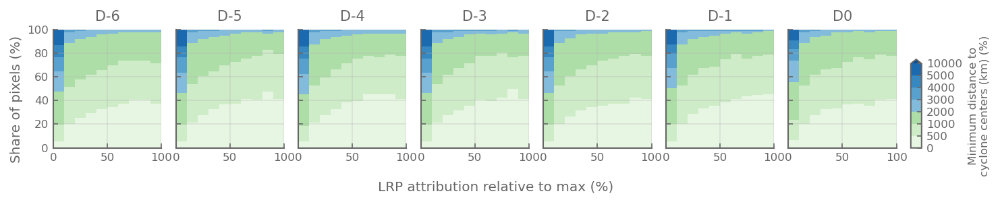

In [17]:
# Same but distance

# df_lrp_dist = df_.set_index('bins').reset_index().groupby('bins').dist_to_all_cycs.apply(lambda x:pd.Series(x.values)).unstack().T.apply(np.sort).apply(np.flip)
# df_lrp_ = df_.set_index('bins').reset_index().groupby('bins').lrp_normed.min()
# ds_lrp_dist = df_lrp_dist.stack().to_xarray().rename('distance_to_cyclone').rename(level_0='pixel', bins='lrp_attributions')*100
# ds_lrp_dist = ds_lrp_dist.assign_coords(lrp_attributions=df_lrp_.values)
# ds_lrp_dist = ds_lrp_dist.assign_coords(pixel=np.linspace(0,100,ds_lrp_dist.pixel.size))#.clip(max=100, min=-100)
# # all_ds_lrp.append(ds_lrp)
# ds_lrp_dist
fig, axs = plt.subplot_mosaic("""
                               ABCDEFGh
                               """, 
                               width_ratios = [10,10,10,10,10,10,10,1],
                               figsize=(10,2),
                            #    sharex=''
                               )


cmap = sns.color_palette(sns.color_palette('Greens', 8)[:3] + sns.color_palette('Blues', 8)[3:])
# cmap = cmap[6:]

(all_ds_dist[0]).plot.pcolormesh(levels=[0,500,1000,2000,3000,4000,5000,10000], colors=cmap, yincrease=True, ax=axs['A'], cbar_ax=axs['h'])
(all_ds_dist[1]).plot.pcolormesh(levels=[0,500,1000,2000,3000,4000,5000,10000], colors=cmap, yincrease=True, ax=axs['B'], cbar_ax=axs['h'])
(all_ds_dist[2]).plot.pcolormesh(levels=[0,500,1000,2000,3000,4000,5000,10000], colors=cmap, yincrease=True, ax=axs['C'], cbar_ax=axs['h'])
(all_ds_dist[3]).plot.pcolormesh(levels=[0,500,1000,2000,3000,4000,5000,10000], colors=cmap, yincrease=True, ax=axs['D'], cbar_ax=axs['h'])
(all_ds_dist[4]).plot.pcolormesh(levels=[0,500,1000,2000,3000,4000,5000,10000], colors=cmap, yincrease=True, ax=axs['E'], cbar_ax=axs['h'])
(all_ds_dist[5]).plot.pcolormesh(levels=[0,500,1000,2000,3000,4000,5000,10000], colors=cmap, yincrease=True, ax=axs['F'], cbar_ax=axs['h'])
(all_ds_dist[6]).plot.pcolormesh(levels=[0,500,1000,2000,3000,4000,5000,10000], colors=cmap, yincrease=True, ax=axs['G'], cbar_ax=axs['h'])

for k,letter in enumerate(['A','B','C','D','E','F','G']):
    # all_ds_lrp[k].mean('pixel').plot(ax=axs[letter], color='.3', ls='--',label='Mean attribution')
    axs[letter].set_ylim(0,100)
    axs[letter].set_xlim(-0,100)
    axs[letter].set_title(f'D{-(6-k)}')
    axs[letter].set_xlabel('')
    axs[letter].grid(ls='-', alpha=0.3)

    # axs[letter].set_ylim(0,1)
for k,letter in enumerate(['B','C','D','E','F','G']):
    axs[letter].set_ylabel('')
    axs[letter].tick_params(labelleft=False)

# for k,letter in enumerate(['B','D','F']):
#     axs[letter].set_xlabel('')
#     axs[letter].tick_params(labelbottom=False)
axs['B'].set_ylabel('')
axs['A'].set_ylabel('')
axs['A'].legend()

axs['h'].set_ylabel('Minimum distance to\ncyclone centers (km) (%)')
fig.supylabel('Share of pixels (%)')
fig.supxlabel('LRP attribution relative to max (%)',y =.03)

plt.tight_layout(w_pad=-0)

# Determine important cyclones

In [43]:
import flox.xarray

attributions_per_distance = flox.xarray.xarray_reduce(
    lrp_normed,
    ds_attrs.distance_to_cyclones,
    ds_attrs.n_cyclone,
    ds_attrs.timestep_past,
    ds_attrs.time_of_event,
    func="mean",
    expected_groups=(ds_attrs.distance_to_cyclones.quantile(np.arange(0,1.0001,.01)),
                     None,
                     None,
                     None,
                     ),
    isbin=[True, False, False, False],
    method="map-reduce",
    keep_attrs=True
)
attributions_per_distance = attributions_per_distance.assign_coords(track_id=ds_attrs.track_id)
attributions_per_distance['distance_to_cyclones_bins'] = [k.mid for k in attributions_per_distance.distance_to_cyclones_bins.values]
attributions_per_distance = attributions_per_distance.rename(distance_to_cyclones_bins='Distance_to_cyclone')
important_cyclones = attributions_per_distance.idxmax('Distance_to_cyclone')<=2000


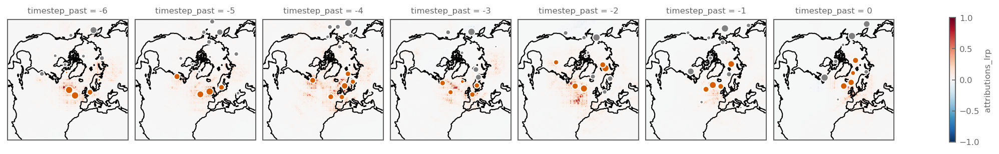

In [43]:
time = ds_attrs.time_of_event.isel(time_of_event=20).values

# ds_ = lrp_normed.sel(time_of_event=time).sum('var_name')
# # ds_ = ds_/ds_.max(['x','y'])
# plot = ds_.plot(col='timestep_past', subplot_kws={'projection':proj}, transform=proj, col_wrap=4)



plot = lrp_normed.sel(time_of_event=time).plot(col='timestep_past', subplot_kws=dict(projection=proj), transform=proj,size=2)
for k, ax in enumerate(plot.axs.flat):
    ax.coastlines()
    time_ = time +(k-6)*pd.Timedelta('1D')
    cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
    cyclones_.loc[:,'size'] = 1050 - cyclones_.msl
    track_id_ = ds_attrs.distance_to_cyclones.sel(time_of_event=time).track_id.isel(timestep_past=k).dropna('n_cyclone').values.astype(int)
    important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k)[:track_id_.size].values
    important_cyclones_ = pd.Series(important_cyclones_, index = track_id_)
    cyclones_['important'] = important_cyclones_
    sns.scatterplot(cyclones_, x='x', y='y', transform=proj, ax=ax, size='size', sizes= (5,50), legend=False, edgecolor='1', linewidth=1, zorder=100, hue='important', palette=['.5','C3'])
    # break

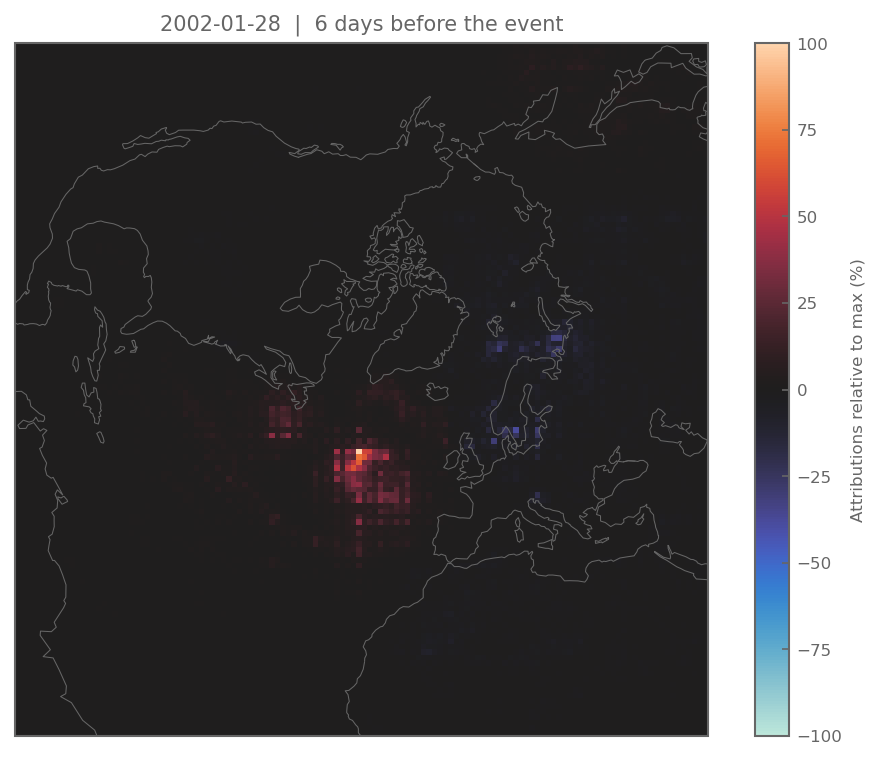

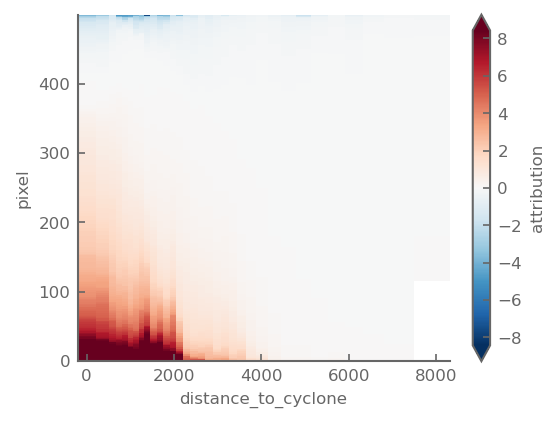

In [ ]:
# df_ = ds_.sel(time_of_event=time).isel(timestep_past=k).clip(-100).to_dataframe().reset_index().sort_values('lrp_normed').reset_index().reset_index().query("lrp_normed>=0")
df_ = ds_.sel(time_of_event=time).isel(timestep_past=k).to_dataframe().reset_index().sort_values('dist_to_all_cycs').reset_index().reset_index()
df_['bins'] = df_.level_0//(500)
df_lrp = df_.set_index('bins').reset_index().groupby('bins').lrp_normed.apply(lambda x:pd.Series(x.values)).unstack().T.apply(np.sort).apply(np.flip)
df_dist = df_.set_index('bins').reset_index().groupby('bins').dist_to_all_cycs.min()
ds_lrp = df_lrp.stack().to_xarray().rename('attribution').rename(level_0='pixel', bins='distance_to_cyclone')*100
ds_lrp = ds_lrp.assign_coords(distance_to_cyclone=df_dist.values)
ds_lrp = ds_lrp.assign_coords(pixel=ds_lrp.pixel[::-1])#np.linspace(0,100,ds_lrp.pixel.size)).clip(max=100, min=-100)

# ds_lrp.plot()
ds_lrp.plot(robust=True)

/tmp/ipykernel_1302667/1043815310.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  important_cyclones_['timestep_past'] = (k-6)
/tmp/ipykernel_1302667/1043815310.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  important_cyclones_['timestep_past'] = (k-6)
/tmp/ipykernel_1302667/1043815310.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

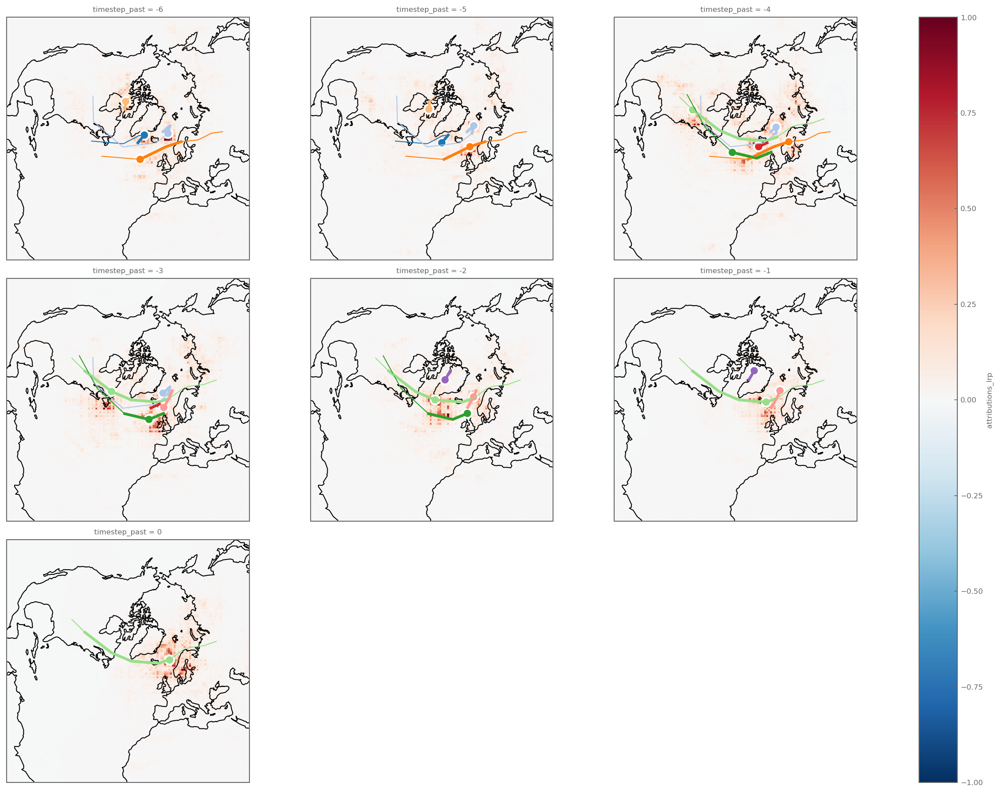

In [22]:
time = ds_attrs.time_of_event.isel(time_of_event=8).values


all_important = []
for k in range(7):
    time_ = time +(k-6)*pd.Timedelta('1D')
    cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
    track_id_ = ds_attrs.distance_to_cyclones.sel(time_of_event=time).track_id.isel(timestep_past=k).dropna('n_cyclone').values.astype(int).astype(str)
    important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k)[:track_id_.size].values
    important_cyclones_ = pd.Series(important_cyclones_, index = track_id_).copy()
    important_cyclones_ = cyclones_[important_cyclones_]
    important_cyclones_['timestep_past'] = (k-6) 
    all_important.append(important_cyclones_)
important_cyclones_tracks = pd.concat(all_important).reset_index()
important_cyclones_tracks['track_id']=important_cyclones_tracks['track_id'].astype(str)

palette = sns.color_palette('tab20')

colors = {id:palette[k] for k,id in enumerate(important_cyclones_tracks.track_id.unique())}
colors

plot = lrp_normed.sel(time_of_event=time).plot(col='timestep_past', subplot_kws=dict(projection=proj), transform=proj,size=4, col_wrap=3, aspect=1.5)
for k, ax in enumerate(plot.axs.flat[:-1]):
    ax.coastlines()
    timestep_past = (k-6)
    important_cyclones_tracks_day = important_cyclones_tracks.loc[important_cyclones_tracks.timestep_past==timestep_past]
    sns.lineplot(important_cyclones_tracks.set_index('track_id').loc[important_cyclones_tracks_day.track_id].reset_index()
                    ,x='x', y='y', hue='track_id',palette=colors, linewidth=3, zorder=100, transform=proj,ax=ax, legend=False, sort=False)
    sns.scatterplot(important_cyclones_tracks_day,x='x', y='y', hue='track_id',palette=colors, s=100,edgecolor='1',zorder=10, linewidth=2, transform=proj,ax=ax, legend=False)
    sns.lineplot(daily_cycs.set_index('track_id').loc[important_cyclones_tracks_day.track_id]
                    ,x='x', y='y', hue='track_id',palette=colors, linewidth=1, zorder=100, transform=proj,ax=ax, legend=False, sort=False)
    
    # time_ = time +(k-6)*pd.Timedelta('1D')
    # cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
    # cyclones_.loc[:,'size'] = 1050 - cyclones_.msl
    # track_id_ = ds_attrs.distance_to_cyclones.sel(time_of_event=time).track_id.isel(timestep_past=k).dropna('n_cyclone').values.astype(int)
    # important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k)[:track_id_.size].values
    # important_cyclones_ = pd.Series(important_cyclones_, index = track_id_)
    # cyclones_['important'] = important_cyclones_
    
    # sns.scatterplot(cyclones_.loc[important_cyclones_], x='x', y='y', transform=proj, ax=ax, size='size', sizes= (5,50), legend=False, edgecolor='1', linewidth=1, zorder=100, color='C3')
    # # sns.lineplot(important_cyclones_tracks.loc[important_cyclones_tracks.track_id.isin(cyclones_[important_cyclones_].index)],x='x', y='y', transform=proj, ax=ax, hue='track_id', sort=False, legend=False)
    ax.set_extent((ds_attrs.x.min(),ds_attrs.x.max(),ds_attrs.y.min(),ds_attrs.y.max(),), crs=proj)


/tmp/ipykernel_1302667/1988216843.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  important_cyclones_['timestep_past'] = (k-6)
/tmp/ipykernel_1302667/1988216843.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  important_cyclones_['timestep_past'] = (k-6)
/tmp/ipykernel_1302667/1988216843.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

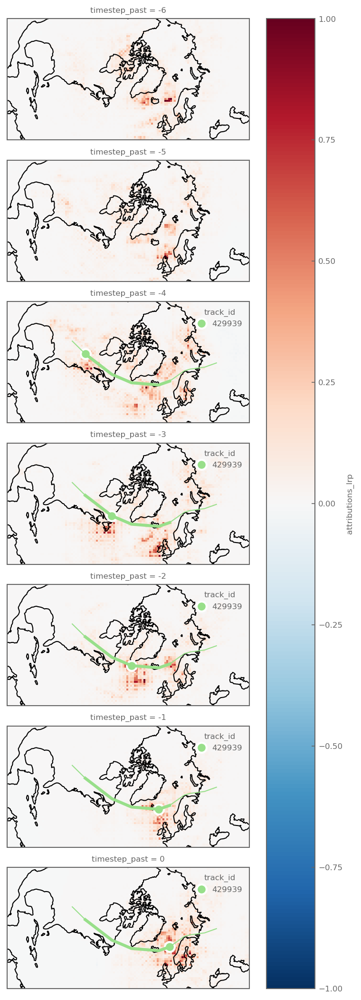

In [23]:
time = ds_attrs.time_of_event.isel(time_of_event=8).values


all_important = []
for k in range(7):
    time_ = time +(k-6)*pd.Timedelta('1D')
    cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
    track_id_ = ds_attrs.distance_to_cyclones.sel(time_of_event=time).track_id.isel(timestep_past=k).dropna('n_cyclone').values.astype(int).astype(str)
    important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k)[:track_id_.size].values
    important_cyclones_ = pd.Series(important_cyclones_, index = track_id_).copy()
    important_cyclones_ = cyclones_[important_cyclones_]
    important_cyclones_['timestep_past'] = (k-6) 
    all_important.append(important_cyclones_)
important_cyclones_tracks = pd.concat(all_important).reset_index()
important_cyclones_tracks['track_id']=important_cyclones_tracks['track_id'].astype(str)

palette = sns.color_palette('tab20')

colors = {id:palette[k] for k,id in enumerate(important_cyclones_tracks.track_id.unique())}
colors

plot = lrp_normed.sel(time_of_event=time).plot(col='timestep_past', subplot_kws=dict(projection=proj), transform=proj,size=2, col_wrap=1, aspect=2)
for k, ax in enumerate(plot.axs.flat):
    ax.coastlines()
    timestep_past = (k-6)
    important_cyclones_tracks_day = important_cyclones_tracks.loc[important_cyclones_tracks.timestep_past==timestep_past]
    important_cyclones_tracks_day = important_cyclones_tracks_day.query("track_id=='429939'")
    sns.lineplot(important_cyclones_tracks.set_index('track_id').loc[important_cyclones_tracks_day.track_id].reset_index()
                    ,x='x', y='y', hue='track_id',palette=colors, linewidth=3, zorder=100, transform=proj,ax=ax, legend=False, sort=False)
    sns.scatterplot(important_cyclones_tracks_day,x='x', y='y', hue='track_id',palette=colors, s=100,edgecolor='1',zorder=10, linewidth=2, transform=proj,ax=ax, legend=True)
    sns.lineplot(daily_cycs.set_index('track_id').loc[important_cyclones_tracks_day.track_id]
                    ,x='x', y='y', hue='track_id',palette=colors, linewidth=1, zorder=100, transform=proj,ax=ax, legend=False, sort=False)
    
    # time_ = time +(k-6)*pd.Timedelta('1D')
    # cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
    # cyclones_.loc[:,'size'] = 1050 - cyclones_.msl
    # track_id_ = ds_attrs.distance_to_cyclones.sel(time_of_event=time).track_id.isel(timestep_past=k).dropna('n_cyclone').values.astype(int)
    # important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k)[:track_id_.size].values
    # important_cyclones_ = pd.Series(important_cyclones_, index = track_id_)
    # cyclones_['important'] = important_cyclones_
    
    # sns.scatterplot(cyclones_.loc[important_cyclones_], x='x', y='y', transform=proj, ax=ax, size='size', sizes= (5,50), legend=False, edgecolor='1', linewidth=1, zorder=100, color='C3')
    # # sns.lineplot(important_cyclones_tracks.loc[important_cyclones_tracks.track_id.isin(cyclones_[important_cyclones_].index)],x='x', y='y', transform=proj, ax=ax, hue='track_id', sort=False, legend=False)
    ax.set_extent((ds_attrs.x.min(),ds_attrs.x.max(),ds_attrs.y.min()/2,ds_attrs.y.max()/2,), crs=proj)


/tmp/ipykernel_981918/614707987.py:7: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(important_cyclones_tracks.set_index('track_id').loc[important_cyclones_tracks_day.track_id].reset_index()
/tmp/ipykernel_981918/614707987.py:9: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(important_cyclones_tracks_day,x='x', y='y', hue='track_id',palette=colors, s=100,edgecolor='1',zorder=10, linewidth=2, transform=proj,ax=ax, legend=True)
/tmp/ipykernel_981918/614707987.py:10: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(daily_cycs.set_index('track_id').loc[important_cyclones_tracks_day.track_id]
/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:509: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  return super().draw(renderer=renderer, **kwargs)


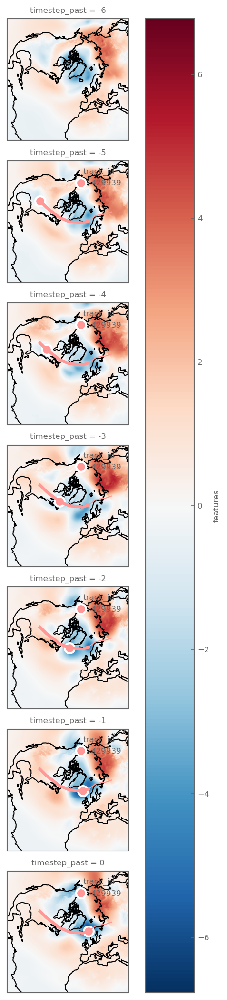

In [391]:

plot = ds_attrs.features.sel(var_name='msl').sel(time_of_event=time).plot(col='timestep_past', subplot_kws=dict(projection=proj), transform=proj,size=2, col_wrap=1, aspect=2)
for k, ax in enumerate(plot.axs.flat):
    ax.coastlines()
    timestep_past = (k-6)
    important_cyclones_tracks_day = important_cyclones_tracks.loc[important_cyclones_tracks.timestep_past==timestep_past]
    important_cyclones_tracks_day = important_cyclones_tracks_day.query("track_id=='429939'")
    sns.lineplot(important_cyclones_tracks.set_index('track_id').loc[important_cyclones_tracks_day.track_id].reset_index()
                    ,x='x', y='y', hue='track_id',palette=colors, linewidth=3, zorder=100, transform=proj,ax=ax, legend=False, sort=False)
    sns.scatterplot(important_cyclones_tracks_day,x='x', y='y', hue='track_id',palette=colors, s=100,edgecolor='1',zorder=10, linewidth=2, transform=proj,ax=ax, legend=True)
    sns.lineplot(daily_cycs.set_index('track_id').loc[important_cyclones_tracks_day.track_id]
                    ,x='x', y='y', hue='track_id',palette=colors, linewidth=1, zorder=100, transform=proj,ax=ax, legend=False, sort=False)
    

In [388]:
ds_attrs.time_of_event.isel(time_of_event=8).values

np.datetime64('2000-01-08T00:00:00.000000000')

In [386]:
important_cyclones_tracks_day.loc[important_cyclones_tracks_day.track_id=='429939']

,track_id,day,lon,lat,x,y,msl,date,timestep_past


In [340]:
important_cyclones_tracks_day

,track_id,day,lon,lat,x,y,msl,date,timestep_past


In [349]:
timestep_past = -3
important_cyclones_tracks_day = important_cyclones_tracks.loc[important_cyclones_tracks.timestep_past==timestep_past]
daily_cycs.set_index('track_id').loc[important_cyclones_tracks_day.track_id]

,day,lon,lat,x,y,msl,date
track_id,,,,,,,
528449,2004-09-14,-47.422902,42.274342,-4.035724e+06,-3.692345e+06,1003.165710,2004-09-14
528449,2004-09-15,-30.950123,51.992221,-2.226656e+06,-3.627488e+06,974.778688,2004-09-15
528449,2004-09-16,-25.171379,61.210334,-1.352893e+06,-2.881187e+06,954.875248,2004-09-16
528449,2004-09-17,-21.763761,62.976009,-1.105955e+06,-2.767889e+06,957.125597,2004-09-17
528449,2004-09-18,-12.954412,63.662301,-6.489422e+05,-2.816240e+06,971.118112,2004-09-18
528449,2004-09-19,-5.309605,66.238578,-2.432253e+05,-2.598530e+06,971.196936,2004-09-19
528449,2004-09-20,-7.856958,67.632704,-3.355489e+05,-2.429703e+06,972.753811,2004-09-20
528449,2004-09-21,-12.305342,65.734576,-5.700914e+05,-2.605259e+06,977.485591,2004-09-21
528450,2004-09-14,26.293395,69.502208,9.716217e+05,-2.018415e+06,977.616698,2004-09-14


In [352]:
daily_cycs.set_index('track_id').loc[important_cyclones_tracks_day.track_id]

,day,lon,lat,x,y,msl,date
track_id,,,,,,,
528449,2004-09-14,-47.422902,42.274342,-4.035724e+06,-3.692345e+06,1003.165710,2004-09-14
528449,2004-09-15,-30.950123,51.992221,-2.226656e+06,-3.627488e+06,974.778688,2004-09-15
528449,2004-09-16,-25.171379,61.210334,-1.352893e+06,-2.881187e+06,954.875248,2004-09-16
528449,2004-09-17,-21.763761,62.976009,-1.105955e+06,-2.767889e+06,957.125597,2004-09-17
528449,2004-09-18,-12.954412,63.662301,-6.489422e+05,-2.816240e+06,971.118112,2004-09-18
528449,2004-09-19,-5.309605,66.238578,-2.432253e+05,-2.598530e+06,971.196936,2004-09-19
528449,2004-09-20,-7.856958,67.632704,-3.355489e+05,-2.429703e+06,972.753811,2004-09-20
528449,2004-09-21,-12.305342,65.734576,-5.700914e+05,-2.605259e+06,977.485591,2004-09-21
528450,2004-09-14,26.293395,69.502208,9.716217e+05,-2.018415e+06,977.616698,2004-09-14


<Axes: xlabel='x', ylabel='y'>

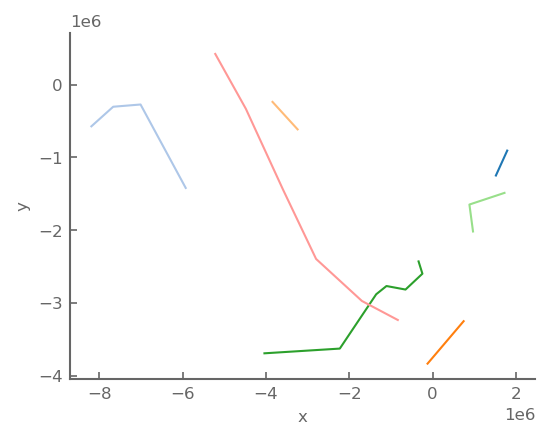

In [267]:
important_cyclones_tracks.groupby('track_id').timestep_past.count()

track_id
527770    2
528215    4
528233    1
528238    2
528430    2
528441    1
528449    7
528450    3
528505    6
528520    1
528664    1
528737    1
Name: timestep_past, dtype: int64

In [261]:
important_cyclones_tracks

,track_id,day,lon,lat,x,y,msl,date,timestep_past
0,527770,2004-09-14,50.509863,71.850655,1.521179e+06,-1.249474e+06,967.414720,2004-09-14,-6
1,528215,2004-09-14,-86.000386,22.820426,-8.190611e+06,-5.737235e+05,980.037910,2004-09-14,-6
2,528238,2004-09-14,-1.682028,55.531065,-1.195917e+05,-3.834053e+06,981.001981,2004-09-14,-6
3,528430,2004-09-14,-85.984182,55.417947,-3.841781e+06,-2.380803e+05,985.190535,2004-09-14,-6
4,528449,2004-09-14,-47.422902,42.274342,-4.035724e+06,-3.692345e+06,1003.165710,2004-09-14,-6
5,528450,2004-09-14,26.293395,69.502208,9.716217e+05,-2.018415e+06,977.616698,2004-09-14,-6
6,527770,2004-09-15,63.165959,71.600938,1.793036e+06,-9.071870e+05,984.283372,2004-09-15,-5
7,528215,2004-09-15,-87.734525,26.370934,-7.667163e+06,-3.046116e+05,974.047998,2004-09-15,-5
8,528233,2004-09-15,-35.816073,58.225317,-2.065711e+06,-2.860167e+06,986.477121,2004-09-15,-5
9,528238,2004-09-15,13.084918,59.813756,7.465146e+05,-3.251002e+06,991.221813,2004-09-15,-5


/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/seaborn/_core/properties.py:130: UserWarning: The color list has more values (20) than needed (12), which may not be intended.
  warnings.warn(message, UserWarning)
/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/seaborn/_core/properties.py:130: UserWarning: The color list has more values (20) than needed (12), which may not be intended.
  warnings.warn(message, UserWarning)


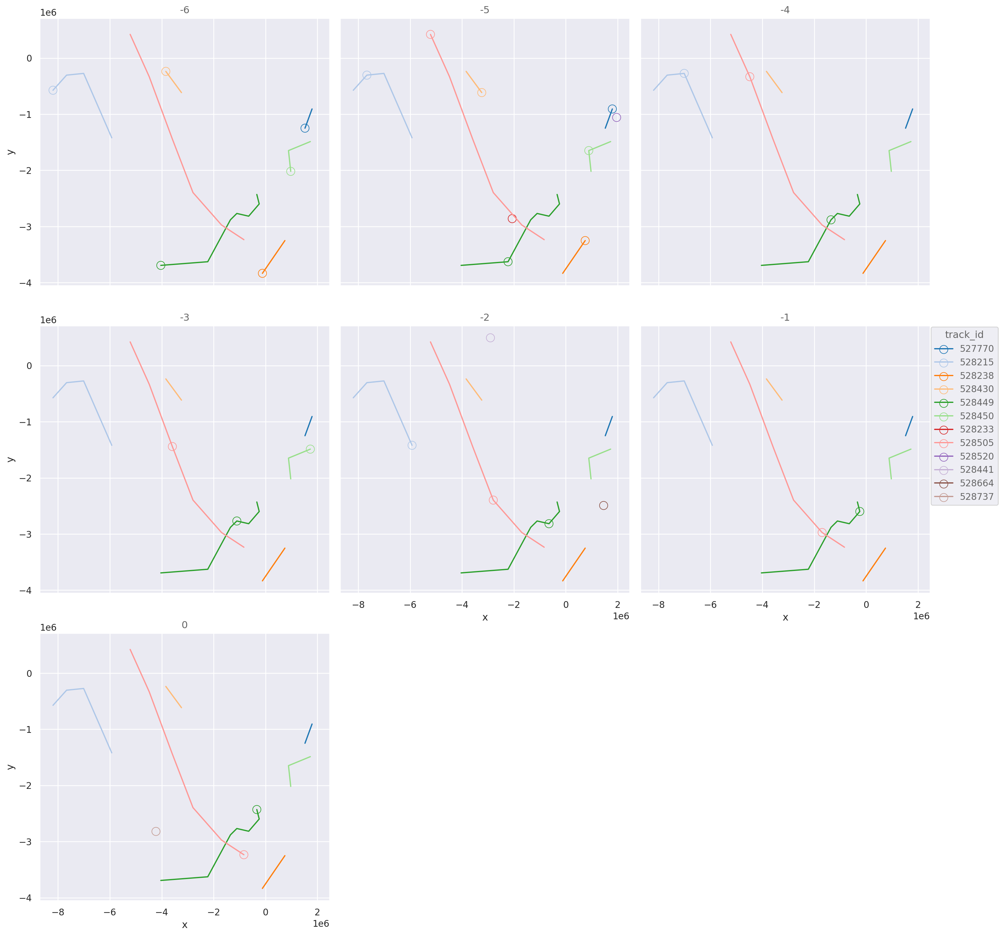

In [259]:
(so.Plot(important_cyclones_tracks, x='x', y='y', color='track_id')
 .add(so.Path(), col=None)
 .add(so.Dot(pointsize=10, fill=False,edgewidth=20), )
 .scale(color=sns.color_palette('tab20'))
 .facet(col='timestep_past',wrap=3)
 .layout(size=(16,16))
 )

In [ ]:
important_cyclones_tracks.track_id.unique()

# sns.scatterplot(cyclones_.loc[important_cyclones_], x='x', y='y', transform=proj, ax=ax, size='size', sizes= (5,50), legend=False, edgecolor='1', linewidth=1, zorder=100, color='C3')
sns.relplot(important_cyclones_tracks

,track_id,day,lon,lat,x,y,msl,date,timestep_past
0,527770,2004-09-14,50.509863,71.850655,1.521179e+06,-1.249474e+06,967.414720,2004-09-14,-6
1,528215,2004-09-14,-86.000386,22.820426,-8.190611e+06,-5.737235e+05,980.037910,2004-09-14,-6
2,528238,2004-09-14,-1.682028,55.531065,-1.195917e+05,-3.834053e+06,981.001981,2004-09-14,-6
3,528430,2004-09-14,-85.984182,55.417947,-3.841781e+06,-2.380803e+05,985.190535,2004-09-14,-6
4,528449,2004-09-14,-47.422902,42.274342,-4.035724e+06,-3.692345e+06,1003.165710,2004-09-14,-6
5,528450,2004-09-14,26.293395,69.502208,9.716217e+05,-2.018415e+06,977.616698,2004-09-14,-6
6,527770,2004-09-15,63.165959,71.600938,1.793036e+06,-9.071870e+05,984.283372,2004-09-15,-5
7,528215,2004-09-15,-87.734525,26.370934,-7.667163e+06,-3.046116e+05,974.047998,2004-09-15,-5
8,528233,2004-09-15,-35.816073,58.225317,-2.065711e+06,-2.860167e+06,986.477121,2004-09-15,-5
9,528238,2004-09-15,13.084918,59.813756,7.465146e+05,-3.251002e+06,991.221813,2004-09-15,-5


In [216]:
important_cyclones_tracks.loc[important_cyclones_tracks.track_id.isin(cyclones_[important_cyclones_].track_id]

SyntaxError: closing parenthesis ']' does not match opening parenthesis '(' (2302013134.py, line 1)

In [188]:


all_important = []
for k in range(7):
    time_ = time +(k-6)*pd.Timedelta('1D')
    cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
    track_id_ = ds_attrs.distance_to_cyclones.sel(time_of_event=time).track_id.isel(timestep_past=k).dropna('n_cyclone').values.astype(int)
    important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k)[:track_id_.size].values
    important_cyclones_ = pd.Series(important_cyclones_, index = track_id_)
    important_cyclones_ = cyclones_[important_cyclones_]
    all_important.append(important_cyclones_)
important_cyclones_tracks = pd.concat(all_important).reset_index()

In [192]:
cyclones_.loc[important_cyclones_]

,day,lon,lat,x,y,msl,date,size,important
track_id,,,,,,,,,
451946,2001-02-05,3.559690,53.540712,2.504338e+05,-4.071573e+06,983.816910,2001-02-05,66.183090,True
452102,2001-02-05,-31.893736,50.315901,-2.358580e+06,-3.796065e+06,960.665005,2001-02-05,89.334995,True
452120,2001-02-05,28.765077,63.610554,1.410587e+06,-2.534775e+06,1014.521133,2001-02-05,35.478867,True
452248,2001-02-05,-19.719443,47.937760,-1.616047e+06,-4.478647e+06,959.592715,2001-02-05,90.407285,True


In [179]:
important_cyclones_

,track_id,day,lon,lat,x,y,msl,date
0,451946,2001-02-05,3.559690,53.540712,2.504338e+05,-4.071573e+06,983.816910,2001-02-05
1,452102,2001-02-05,-31.893736,50.315901,-2.358580e+06,-3.796065e+06,960.665005,2001-02-05
2,452120,2001-02-05,28.765077,63.610554,1.410587e+06,-2.534775e+06,1014.521133,2001-02-05
3,452248,2001-02-05,-19.719443,47.937760,-1.616047e+06,-4.478647e+06,959.592715,2001-02-05
4,452102,2001-02-06,-23.792639,48.069577,-1.910755e+06,-4.341334e+06,967.400302,2001-02-06
5,452248,2001-02-06,-10.553124,53.685610,-7.529049e+05,-3.990401e+06,957.691925,2001-02-06
6,452260,2001-02-06,-66.214754,43.822405,-4.832153e+06,-2.115170e+06,980.437008,2001-02-06
7,452329,2001-02-06,11.959536,58.112004,7.299516e+05,-3.464380e+06,986.834684,2001-02-06
8,452102,2001-02-07,-18.635067,46.815953,-1.566979e+06,-4.646773e+06,984.452336,2001-02-07
9,452248,2001-02-07,3.251120,60.252859,1.637840e+05,-3.281349e+06,974.143903,2001-02-07


<Axes: xlabel='lon', ylabel='lat'>

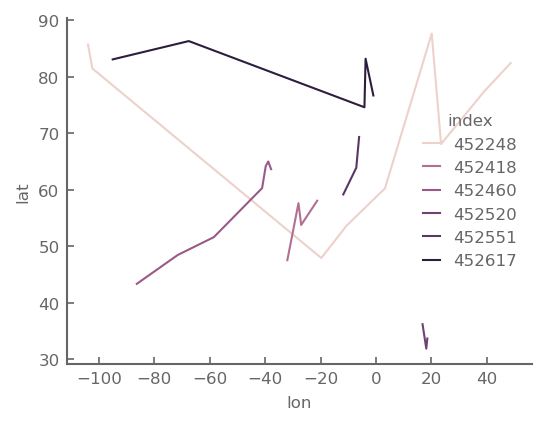

In [162]:
tracks_ = daily_cycs.set_index('track_id').loc[important_cyclones_.loc[important_cyclones_].index].reset_index()
sns.lineplot(tracks_, x='lon', y='lat', hue='index')

In [158]:
tracks_

,index,day,lon,lat,x,y,msl,date
0,452248,2001-02-05,-19.719443,47.937760,-1.616047e+06,-4.478647e+06,959.592715,2001-02-05
1,452248,2001-02-06,-10.553124,53.685610,-7.529049e+05,-3.990401e+06,957.691925,2001-02-06
2,452248,2001-02-07,3.251120,60.252859,1.637840e+05,-3.281349e+06,974.143903,2001-02-07
3,452248,2001-02-08,23.488889,68.111058,9.254593e+05,-2.202650e+06,981.263074,2001-02-08
4,452248,2001-02-09,39.026521,77.403544,8.505963e+05,-1.071557e+06,972.134832,2001-02-09
5,452248,2001-02-10,48.618594,82.442704,6.073774e+05,-5.479327e+05,973.432070,2001-02-10
6,452248,2001-02-11,20.115948,87.632937,1.904877e+05,-9.627549e+04,982.078124,2001-02-11
7,452248,2001-02-12,-103.861039,85.702683,-4.517944e+05,1.128475e+05,990.767253,2001-02-12
8,452248,2001-02-13,-102.298246,81.464889,-9.055458e+05,1.872202e+05,994.473922,2001-02-13
9,452418,2001-02-08,-31.963583,47.554861,-2.549949e+06,-4.078576e+06,992.774837,2001-02-08


In [ ]:
df_ = ds_.to_dataframe().reset_index().sort_values('dist_to_all_cycs').reset_index().reset_index()
df_['distance_bins'] = df_.level_0//(32)
df_lrp = df_.set_index('distance_bins').reset_index().groupby('distance_bins').attributions.apply(lambda x:pd.Series(x.values)).unstack().T.apply(np.sort).apply(np.flip)
df_dist = df_.set_index('distance_bins').reset_index().groupby('distance_bins').dist_to_all_cycs.min()
ds_lrp = df_lrp.stack().to_xarray().rename('attribution').rename(level_0='pixel', distance_bins='distance_to_cyclone')*100
ds_lrp.plot(vmax=100,)


KeyboardInterrupt: 

2025-10-13 16:54:31,845 - distributed.nanny - ERROR - Worker process died unexpectedly
Process Dask Worker process (from Nanny):
2025-10-13 16:54:31,845 - distributed.nanny - ERROR - Worker process died unexpectedly
Process Dask Worker process (from Nanny):
Process Dask Worker process (from Nanny):
Process Dask Worker process (from Nanny):
2025-10-13 16:54:31,846 - distributed.nanny - ERROR - Worker process died unexpectedly
2025-10-13 16:54:31,847 - distributed.nanny - ERROR - Worker process died unexpectedly
Process Dask Worker process (from Nanny):
2025-10-13 16:54:31,849 - distributed.nanny - ERROR - Worker process died unexpectedly
Process Dask Worker process (from Nanny):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/asyncio/runners.py", line 118, in run
    return self._loop.run_until_complete(task)
           ^^^^^^

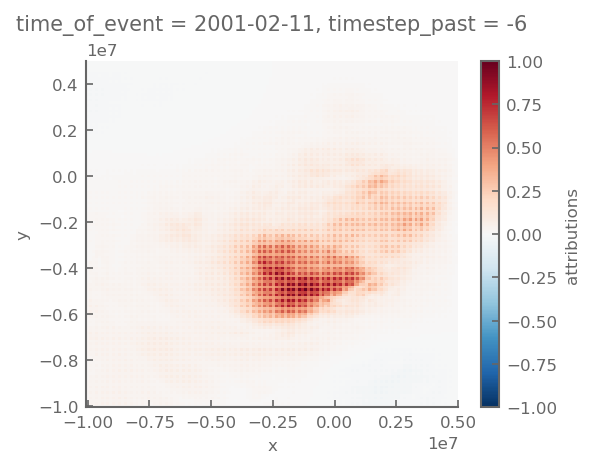

In [155]:
ds_.isel(timestep_past=0, time_of_event=20).attributions.plot()

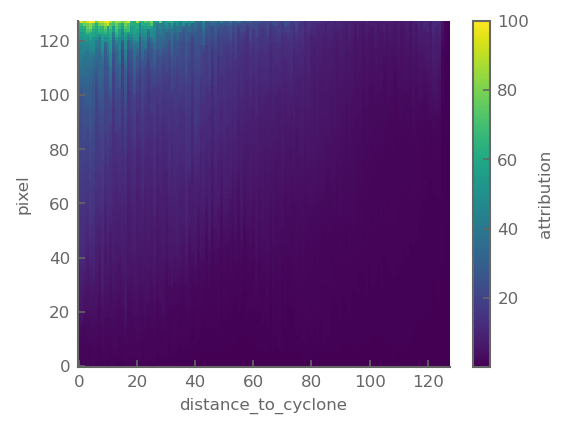

In [ ]:
df_.level_0//16384

0             0.000000
1             0.000061
2             0.000122
3             0.000183
4             0.000244
               ...    
15400955    939.999695
15400956    939.999756
15400957    939.999817
15400958    939.999878
15400959    939.999939
Name: level_0, Length: 15400960, dtype: float64

In [ ]:
(so.Plot(df_)
 
 
 )

In [103]:
df_

,level_0,index,y,time_of_event,x,var_name,timestep_past,lat,lon,dist_to_all_cycs,attributions,distance_bins
0,0,14731593,4.352941e+06,2006-01-11,-3.529412e+05,y850,-6,51.181309,-175.364532,1.287201,-0.006943,0
1,1,14731592,4.352941e+06,2006-01-11,-3.529412e+05,x850,-6,51.181309,-175.364532,1.287201,-0.015473,0
2,2,14731595,4.352941e+06,2006-01-11,-3.529412e+05,msl,-6,51.181309,-175.364532,1.287201,-0.029026,0
3,3,14731594,4.352941e+06,2006-01-11,-3.529412e+05,z500,-6,51.181309,-175.364532,1.287201,-0.013828,0
4,4,15227638,4.823529e+06,2007-07-17,-2.823529e+06,z500,-6,41.422729,-149.656754,2.204928,0.002134,0
...,...,...,...,...,...,...,...,...,...,...,...,...
15400955,15400955,45575,-1.000000e+07,2005-07-19,-9.882353e+06,msl,-6,-7.546217,-44.660976,11292.705298,0.014236,30801
15400956,15400956,45568,-1.000000e+07,2005-07-19,-1.000000e+07,x850,-6,-7.882402,-45.000000,11366.211176,0.007617,30801
15400957,15400957,45569,-1.000000e+07,2005-07-19,-1.000000e+07,y850,-6,-7.882402,-45.000000,11366.211176,0.031160,30801
15400958,15400958,45570,-1.000000e+07,2005-07-19,-1.000000e+07,z500,-6,-7.882402,-45.000000,11366.211176,0.004798,30801


In [62]:
df__ = df_.query("timestep_past==-1").reset_index().reset_index()
df__['bins'] = df__.level_0//(128*235)


In [ ]:
df_lrp = df__.set_index('bins').reset_index().groupby('bins').attributions.apply(lambda x:pd.Series(x.values)).unstack().T.apply(np.sort).apply(np.flip)
df_dist = df_.set_index('bins').reset_index().groupby('bins').dist_to_all_cycs.min()
ds_lrp = df_lrp.stack().to_xarray().rename('attribution').rename(level_0='pixel', bins='distance_to_cyclone')*100
df_vars = df__.set_index('bins').reset_index().groupby('bins').var_name.apply(lambda x:pd.Series(x.values)).unstack().T.apply(np.sort).apply(np.flip)

KeyError: "None of ['bins'] are in the columns"

In [89]:
df__

,level_0,index,y,time_of_event,x,timestep_past,var_name,lat,lon,dist_to_all_cycs,attributions,bins
0,0,43515744,-4.000000e+06,2008-06-20,0.000000e+00,-1,x850,54.236259,0.000000,622.133484,-1.906457,0
1,1,46884707,-3.529412e+06,2008-06-20,0.000000e+00,-1,msl,58.226250,0.000000,158.257937,-1.759238,0
2,2,45200227,-3.764706e+06,2008-06-20,0.000000e+00,-1,msl,56.221058,0.000000,388.181016,-1.668888,0
3,3,38462304,-4.705882e+06,2008-06-20,0.000000e+00,-1,x850,48.412392,0.000000,1326.840851,-1.590188,0
4,4,48569187,-3.294118e+06,2008-06-20,0.000000e+00,-1,msl,60.250931,0.000000,100.664252,-1.491005,0
...,...,...,...,...,...,...,...,...,...,...,...,...
15400955,15400955,58735648,-1.882353e+06,2009-01-08,-5.647059e+06,-1,x850,38.649433,-71.565048,978.814492,1.000000,511
15400956,15400956,52038272,-2.823529e+06,2009-09-27,-9.411765e+05,-1,x850,63.015263,-18.434948,722.546930,1.000000,511
15400957,15400957,57213739,-2.117647e+06,2011-11-30,-2.352941e+05,-1,msl,70.513542,-6.340192,175.747649,1.000000,511
15400958,15400958,3088616,-9.647059e+06,2008-06-20,1.647059e+06,-1,x850,13.207154,9.688787,1202.798079,1.000000,511


<Axes: xlabel='bins'>

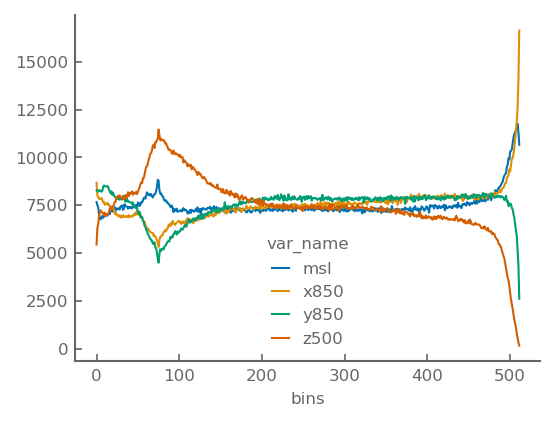

In [87]:
df_vars.plot()

<Axes: xlabel='bins'>

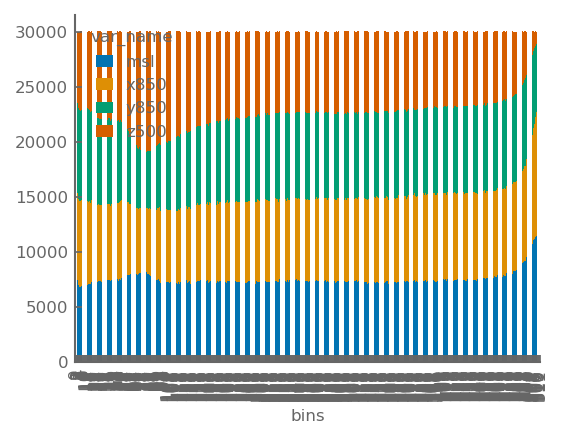

In [ ]:
df_vars.plot.bar(stacked=True)

In [70]:
df_dist = df_.set_index('bins').reset_index().groupby('bins').dist_to_all_cycs.min()
ds_lrp = df_lrp.stack().to_xarray().rename('attribution').rename(level_0='pixel', bins='distance_to_cyclone')*100

KeyError: "None of ['bins'] are in the columns"

In [ ]:
df_ = ds_.isel(timestep_past=k).to_dataframe().reset_index().sort_values('dist_to_all_cycs').reset_index().reset_index()
df_['bins'] = df_.level_0//(128*235)
df_lrp = df_.set_index('bins').reset_index().groupby('bins').lrp_normed.apply(lambda x:pd.Series(x.values)).unstack().T.apply(np.sort).apply(np.flip)
df_dist = df_.set_index('bins').reset_index().groupby('bins').dist_to_all_cycs.min()
ds_lrp = df_lrp.stack().to_xarray().rename('attribution').rename(level_0='pixel', bins='distance_to_cyclone')*100
ds_lrp = ds_lrp.assign_coords(distance_to_cyclone=df_dist.values)
ds_lrp = ds_lrp.assign_coords(pixel=np.linspace(0,100,ds_lrp.pixel.size)).clip(max=100, min=-100)
    

<xarray.Dataset> Size: 647MB
Dimensions:           (y: 128, time_of_event: 235, x: 128, timestep_past: 7,
                       var_name: 4)
Coordinates:
  * y                 (y) float64 1kB -1e+07 -9.882e+06 ... 4.824e+06 4.941e+06
  * time_of_event     (time_of_event) datetime64[ns] 2kB 1999-11-24 ... 2012-...
  * x                 (x) float64 1kB -1e+07 -9.882e+06 ... 4.824e+06 4.941e+06
  * timestep_past     (timestep_past) int64 56B -6 -5 -4 -3 -2 -1 0
    lat               (y, x) float32 66kB -7.882 -7.546 -7.21 ... 31.67 31.09
    lon               (y, x) float32 66kB -45.0 -44.66 -44.32 ... 135.7 135.0
  * var_name          (var_name) <U4 64B 'x850' 'y850' 'z500' 'msl'
Data variables:
    dist_to_all_cycs  (time_of_event, timestep_past, y, x) float64 216MB 6.36...
    attributions      (time_of_event, timestep_past, var_name, y, x) float32 431MB ...

# Group attributions by distance to all cyclones to determine important cyclones

In [6]:
import flox.xarray

attributions_per_distance = flox.xarray.xarray_reduce(
    lrp_normed,
    ds_attrs.distance_to_cyclones,
    ds_attrs.n_cyclone,
    ds_attrs.timestep_past,
    ds_attrs.time_of_event,
    func="mean",
    expected_groups=(ds_attrs.distance_to_cyclones.quantile(np.arange(0,1.0001,.01)),
                     None,
                     None,
                     None,
                     ),
    isbin=[True, False, False, False],
    method="map-reduce",
    keep_attrs=True
)
attributions_per_distance = attributions_per_distance.assign_coords(track_id=ds_attrs.track_id)
attributions_per_distance['distance_to_cyclones_bins'] = [k.mid for k in attributions_per_distance.distance_to_cyclones_bins.values]
attributions_per_distance = attributions_per_distance.rename(distance_to_cyclones_bins='Distance_to_cyclone')
important_cyclones = attributions_per_distance.sum('var_name').idxmax('Distance_to_cyclone')<=2000

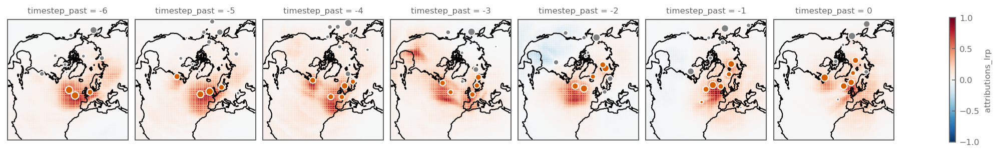

In [7]:
time = ds_attrs.time_of_event.isel(time_of_event=20).values

# ds_ = lrp_normed.sel(time_of_event=time).sum('var_name')
# # ds_ = ds_/ds_.max(['x','y'])
# plot = ds_.plot(col='timestep_past', subplot_kws={'projection':proj}, transform=proj, col_wrap=4)



plot = lrp_normed.sel(time_of_event=time).sum('var_name').plot(col='timestep_past', subplot_kws=dict(projection=proj), transform=proj,size=2)
for k, ax in enumerate(plot.axs.flat):
    ax.coastlines()
    time_ = time +(k-6)*pd.Timedelta('1D')
    cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
    cyclones_.loc[:,'size'] = 1050 - cyclones_.msl
    track_id_ = ds_attrs.distance_to_cyclones.sel(time_of_event=time).track_id.isel(timestep_past=k).dropna('n_cyclone').values.astype(int)
    important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k)[:track_id_.size].values
    important_cyclones_ = pd.Series(important_cyclones_, index = track_id_)
    cyclones_['important'] = important_cyclones_
    sns.scatterplot(cyclones_, x='x', y='y', transform=proj, ax=ax, size='size', sizes= (5,50), legend=False, edgecolor='1', linewidth=1, zorder=100, hue='important', palette=['.5','C3'])
    # break

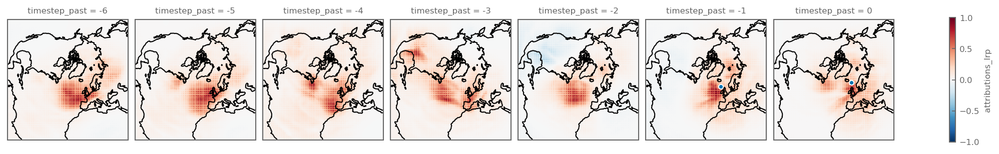

In [8]:
time = ds_attrs.time_of_event.isel(time_of_event=20).values

# ds_ = lrp_normed.sel(time_of_event=time).sum('var_name')
# # ds_ = ds_/ds_.max(['x','y'])
# plot = ds_.plot(col='timestep_past', subplot_kws={'projection':proj}, transform=proj, col_wrap=4)



plot = lrp_normed.sel(time_of_event=time).sum('var_name').plot(col='timestep_past', subplot_kws=dict(projection=proj), transform=proj,size=2)
for k, ax in enumerate(plot.axs.flat):
    ax.coastlines()
    time_ = time +(k-6)*pd.Timedelta('1D')
    cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
    cyclones_.loc[:,'size'] = 1050 - cyclones_.msl
    track_id_ = ds_attrs.distance_to_cyclones.sel(time_of_event=time).track_id.isel(timestep_past=k).dropna('n_cyclone').values.astype(int)
    important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k)[:track_id_.size].values
    important_cyclones_ = pd.Series(important_cyclones_, index = track_id_)
    cyclones_['important'] = important_cyclones_
    if 452551 in cyclones_.index:
        cyclones_ = cyclones_.loc[[452551]]
        sns.scatterplot(cyclones_, x='x', y='y', transform=proj, ax=ax, size='size', sizes= (20,50), legend=False, edgecolor='1', linewidth=1, zorder=100, hue='important')

<GeoAxes: title={'center': 'time_of_event = 2001-02-11, timestep_past = -1'}, xlabel='x', ylabel='y'>

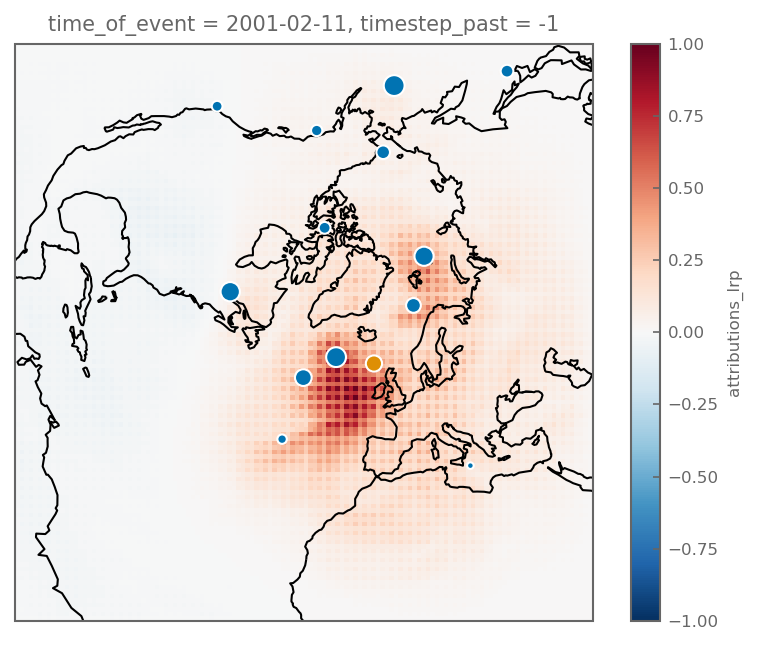

In [9]:
time = pd.to_datetime('2001-02-11')
k = 5
plot = lrp_normed.sel(time_of_event=time).sum('var_name').isel(timestep_past=k).plot(subplot_kws=dict(projection=proj), transform=proj, size=5)
ax=plot.axes
ax.coastlines()
cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
cyclones_.loc[:,'size'] = 1050 - cyclones_.msl
track_id_ = ds_attrs.distance_to_cyclones.sel(time_of_event=time).track_id.isel(timestep_past=k).dropna('n_cyclone').values.astype(int)
important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k)[:track_id_.size].values
important_cyclones_ = pd.Series(important_cyclones_, index = track_id_)
cyclones_['important'] = important_cyclones_
cyclones_.index =cyclones_.index.astype(str) 
sns.scatterplot(cyclones_, x='x', y='y', transform=proj, ax=ax, size='size', sizes= (10,100), legend=False, edgecolor='1', linewidth=1, zorder=100, hue=cyclones_.index=="452551")#, hue='track_id', palette='tab20')
    # break

<GeoAxes: title={'center': 'time_of_event = 2001-02-11, timestep_past = -5'}, xlabel='x', ylabel='y'>

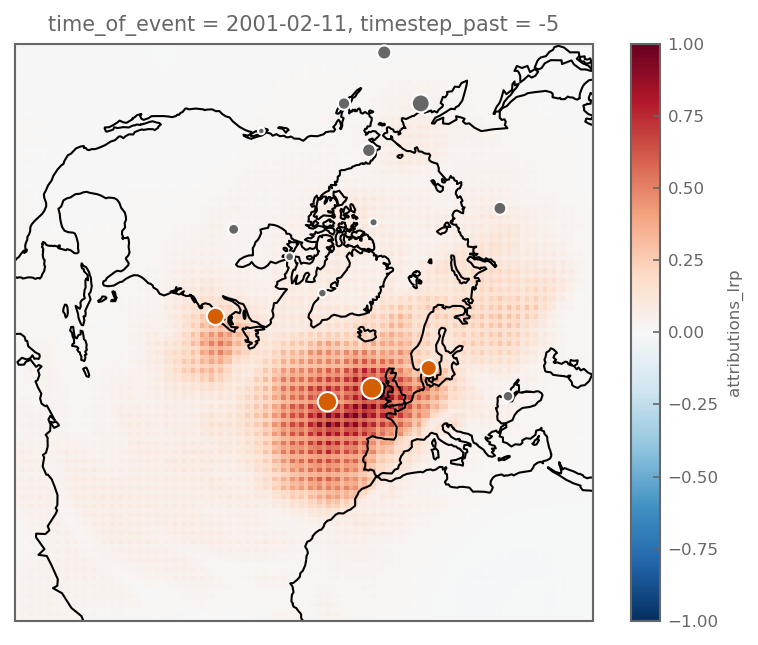

In [10]:
k=1
plot = lrp_normed.sel(time_of_event=time).sum('var_name').isel(timestep_past=k).plot(subplot_kws=dict(projection=proj), transform=proj, size=5)
ax=plot.axes
ax.coastlines()
cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
cyclones_.loc[:,'size'] = 1050 - cyclones_.msl
track_id_ = ds_attrs.distance_to_cyclones.sel(time_of_event=time).track_id.isel(timestep_past=k).dropna('n_cyclone').values.astype(int)
important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k)[:track_id_.size].values
important_cyclones_ = pd.Series(important_cyclones_, index = track_id_)
cyclones_['important'] = important_cyclones_
cyclones_.index =cyclones_.index.astype(str) 
sns.scatterplot(cyclones_, x='x', y='y', transform=proj, ax=ax, size='size', sizes= (10,100), legend=False, edgecolor='1', linewidth=1, zorder=100, hue='important', palette=['.4','C3'])#, hue='track_id', palette='tab20')
    # break

In [240]:
daily_cycs.query("track_id==452551")

,day,track_id,lon,lat,x,y,msl,date
day,,,,,,,,
2001-02-10,2001-02-10,452551,-11.779002,59.191454,-698791.920883,-3.344629e+06,986.379397,2001-02-10
2001-02-11,2001-02-11,452551,-7.091439,63.912117,-359623.014633,-2.850807e+06,978.317263,2001-02-11
2001-02-12,2001-02-12,452551,-6.074996,69.351131,-236653.076892,-2.248063e+06,983.398747,2001-02-12


<Axes: xlabel='x', ylabel='y'>

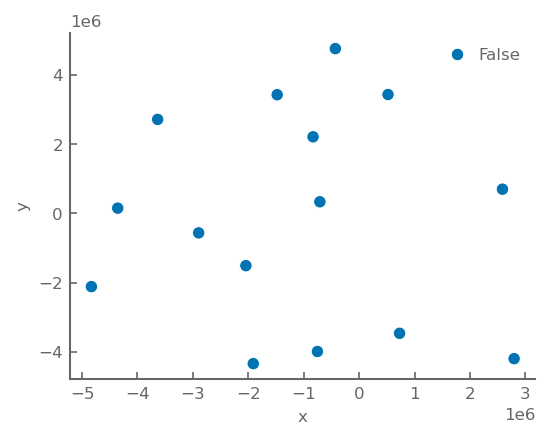

In [219]:
sns.scatterplot(cyclones_, x='x',y='y', hue=cyclones_.index==452551)

In [225]:
time = pd.to_datetime('2001-02-11')
df_ = pd.read_csv('/Data/gfi/users/rogui7909/data/attribute_precip_features/western_norway/features_attributed_to_rain_per_day_WN.csv', index_col='time', parse_dates=True)
df_.loc[time]

0              A_14_15H
1              A_15_06H
2              A_15_12H
3              A_17_09H
4              C_452551
5                F_9901
6                   NaN
7                   NaN
8                   NaN
9                   NaN
10                  NaN
11                  NaN
12                  NaN
13                  NaN
14                  NaN
15                  NaN
rain_type         A_C_F
daily_rain    21.574398
Name: 2001-02-11 00:00:00, dtype: object

<GeoAxes: title={'center': 'time_of_event = 2005-09-14, timestep_past = -4'}, xlabel='x', ylabel='y'>

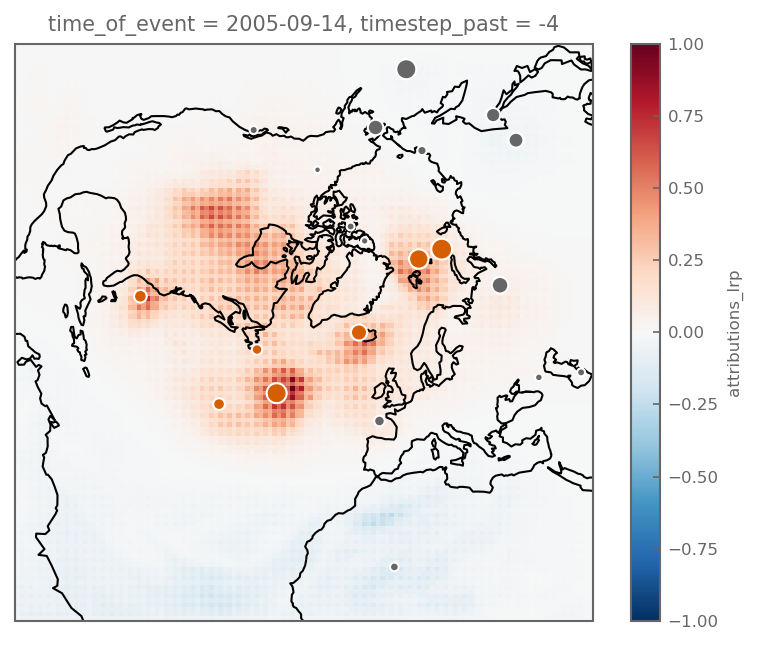

In [220]:
time = ds_attrs.time_of_event.sel(time_of_event='2005-09-14').values
k=2
plot = lrp_normed.sel(time_of_event=time).sum('var_name').isel(timestep_past=k).plot(subplot_kws=dict(projection=proj), transform=proj, size=5, vmin=-1)
ax=plot.axes
ax.coastlines()
cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
cyclones_.loc[:,'size'] = 1050 - cyclones_.msl
track_id_ = ds_attrs.distance_to_cyclones.sel(time_of_event=time).track_id.isel(timestep_past=k).dropna('n_cyclone').values.astype(int)
important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k)[:track_id_.size].values
important_cyclones_ = pd.Series(important_cyclones_, index = track_id_)
cyclones_['important'] = important_cyclones_
cyclones_.index =cyclones_.index.astype(str) 
sns.scatterplot(cyclones_, x='x', y='y', transform=proj, ax=ax, size='size', sizes= (10,100), legend=False, edgecolor='1', linewidth=1, zorder=100, hue='important', palette=['.4','C3'])#, hue='track_id', palette='tab20')
    # break

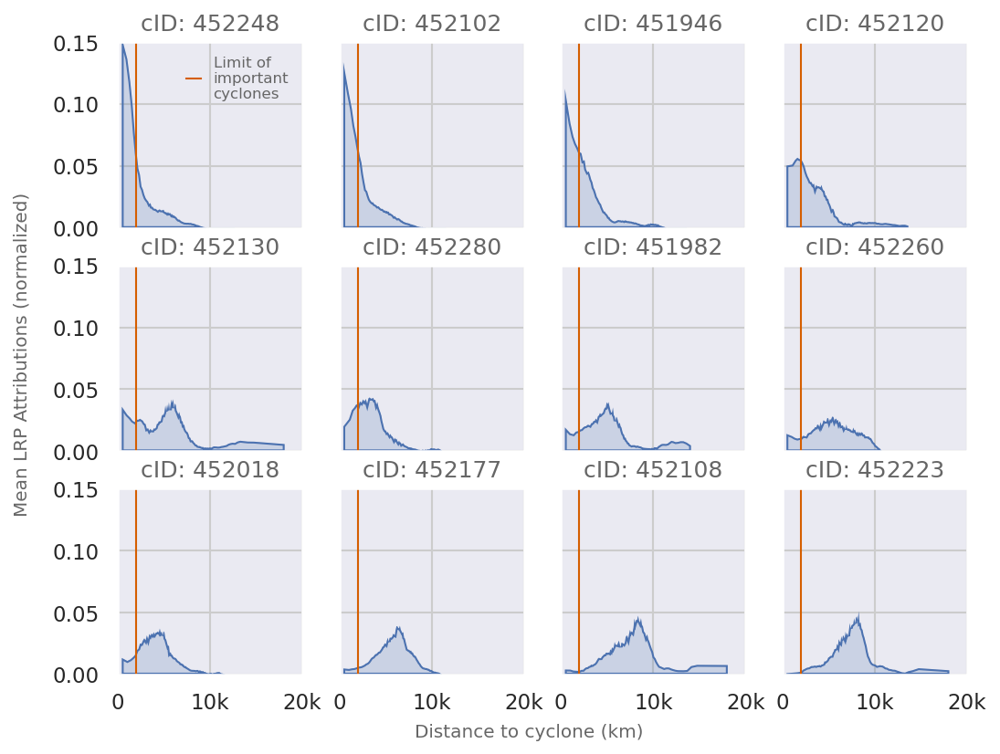

<Figure size 600x450 with 0 Axes>

In [11]:
ds_ = attributions_per_distance.sel(time_of_event=time).isel(timestep_past=0).mean('var_name', keep_attrs=True).dropna('n_cyclone', how='all')#
df_ =  ds_.sortby(ds_.isel(Distance_to_cyclone=0), ascending=False).to_dataframe().reset_index()
ds_.sortby(ds_.isel(Distance_to_cyclone=0), ascending=False).track_id
df_['track_id'] = df_.track_id.astype(int).astype(str)

fig = plt.Figure(figsize=(8,6))
plot = (so.Plot(df_, x='Distance_to_cyclone',y='attributions_lrp')
 .add(so.Area())
 .facet(col='track_id', wrap=4)
 .limit(x=(0,20000), y=(0,.15))
 .theme({'axes.grid':True, 'grid.color':'.8'})
 .label(col="cID:")
).on(fig).plot()
# ds_.assign_coords(n_cyclone=ds_.track_id.astype(str)).plot(col='n_cyclone', col_wrap=4)
for ax in fig.axes:
    ax.yaxis.set_major_locator(plt.MultipleLocator(0.05))
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_xticks([0,10000,20000])
    ax.set_xticklabels(['0','10k','20k'])
    ax.axvline(2000, color='C3', label='Limit of\nimportant\ncyclones')
fig.axes[0].legend()
fig.supxlabel('Distance to cyclone (km)', y=.03)
fig.supylabel('Mean LRP Attributions (normalized)', x=.03)
plt.tight_layout(w_pad=1)
fig

# Compute distance to important cyclones only

In [7]:
# dist_to_main_cycs = ds_attrs.distance_to_cyclones.where(important_cyclones).min('n_cyclone')
dist_to_all_cycs = ds_attrs.distance_to_cyclones.min('n_cyclone')

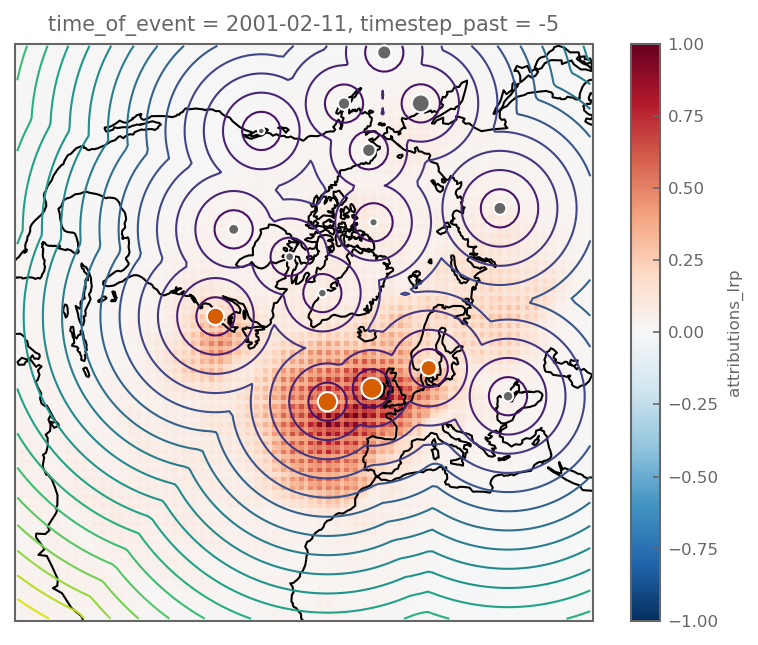

In [15]:
time = ds_attrs.time_of_event.isel(time_of_event=20).values
k=1
plot = lrp_normed.sel(time_of_event=time).sum('var_name').isel(timestep_past=k).plot(subplot_kws=dict(projection=proj), transform=proj, size=5)
ax=plot.axes
ax.coastlines()
cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')].copy().set_index('track_id')
cyclones_.loc[:,'size'] = 1050 - cyclones_.msl
track_id_ = ds_attrs.distance_to_cyclones.sel(time_of_event=time).track_id.isel(timestep_past=k).dropna('n_cyclone').values.astype(int)
important_cyclones_ = important_cyclones.sel(time_of_event=time).isel(timestep_past=k)[:track_id_.size].values
important_cyclones_ = pd.Series(important_cyclones_, index = track_id_)
cyclones_['important'] = important_cyclones_
cyclones_.index =cyclones_.index.astype(str) 
sns.scatterplot(cyclones_, x='x', y='y', transform=proj, ax=ax, size='size', sizes= (10,100), legend=False, edgecolor='1', linewidth=1, zorder=100, hue='important', palette=['.4','C3'])#, hue='track_id', palette='tab20')

# dist_to_main_cycs.sel(time_of_event=time).isel(timestep_past=k).plot.contour(ax=ax, transform=proj, levels=20)
ds_attrs.distance_to_cyclones.sel(time_of_event=time).isel(timestep_past=k).min('n_cyclone').plot.contour(ax=ax, transform=proj, levels=20)
    # break

# Compute mean attributions from min distance to main cyclones
we need to compute in equal bins

In [16]:
all_res = []
for time_of_event in tqdm(range(dist_to_all_cycs.time_of_event.size)):
    res_one_time = []
    for timestep_past in range(7):
        dist_local = dist_to_all_cycs.isel(time_of_event=time_of_event,timestep_past=timestep_past)
        if dist_local.max().isnull():
            continue
        attr_local = lrp_normed.isel(time_of_event=time_of_event, timestep_past=timestep_past)
        bins = dist_local.quantile(np.arange(0,1.0001,.02))
        attr_per_distance_local = attr_local.groupby_bins(dist_local, bins).mean()
        dist_bins = xr.DataArray(np.array([k.mid for k in attr_per_distance_local.distance_to_cyclones_bins.values]), dims='distance_to_cyclones_bins', coords=dict(distance_to_cyclones_bins=attr_per_distance_local.distance_to_cyclones_bins))
        attr_per_distance_local = attr_per_distance_local.assign_coords(distance_to_cyclones_bins=np.arange(attr_per_distance_local.distance_to_cyclones_bins.size))#, dist_bins = attr_per_distance_local.distance_to_cyclones_bins)
        attr_per_distance_local = attr_per_distance_local.assign_coords(dist_bins=dist_bins)
        res_one_time.append(attr_per_distance_local)
    ds_one_time = xr.concat(res_one_time, dim='timestep_past')
    all_res.append(ds_one_time )
attributions_per_distance_main = xr.concat(all_res, dim='time_of_event')
# attributions_per_distance = flox.xarray.xarray_reduce(
#     attr_local,
#     dist_local,
#     func="mean",
#     expected_groups=(dist_local.quantile(np.arange(0,1.0001,.01)),
#                      None,
#                      None,
#                      None,
#                      ),
#     isbin=[True, False, False, False],
#     method="map-reduce",
#     keep_attrs=True
# )

  0%|          | 0/235 [00:00<?, ?it/s]

/tmp/ipykernel_948049/437593734.py:15: FutureWarning: In a future version of xarray the default value for coords will change from coords='different' to coords='minimal'. This is likely to lead to different results when multiple datasets have matching variables with overlapping values. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set coords explicitly.
  ds_one_time = xr.concat(res_one_time, dim='timestep_past')
/tmp/ipykernel_948049/437593734.py:15: FutureWarning: In a future version of xarray the default value for coords will change from coords='different' to coords='minimal'. This is likely to lead to different results when multiple datasets have matching variables with overlapping values. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set coords explicitly.
  ds_one_time = xr.concat(res_one_time, dim='timestep_past')
/tmp/ipykernel_948049/4375

# Mean attribution per distance

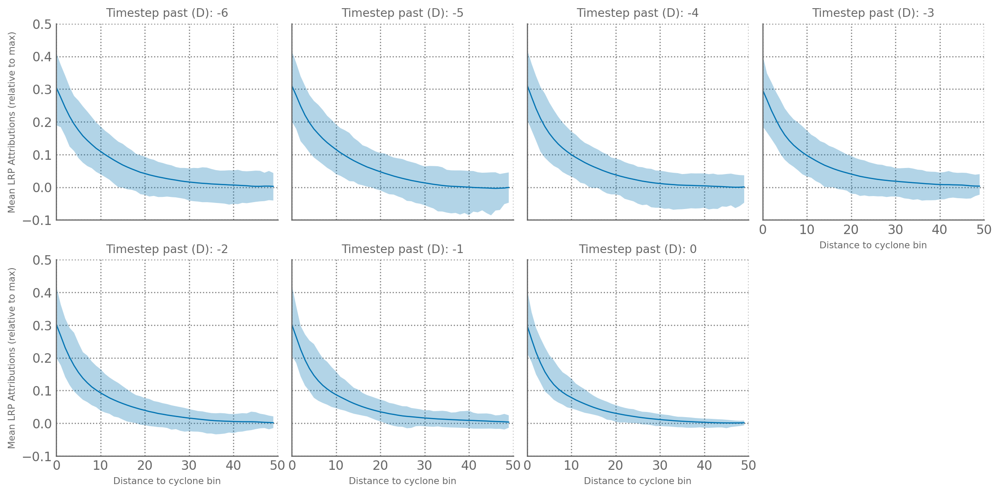

In [314]:
df_ = attributions_per_distance_main.sum('var_name').to_dataframe().reset_index()

(so.Plot(df_, x='distance_to_cyclones_bins', y='attributions_lrp')
 .add(so.Band(alpha=.3),so.Est(errorbar=('pi',90)) )
 .facet(col='timestep_past', wrap=4)
 .add(so.Line(), so.Agg())
 .layout(size=(12,6))
 .theme(plt.style.library["robin"])
 .theme({'axes.grid':True, 'grid.color':'.5'})
 .label(col='Timestep past (D):', y='Mean LRP Attributions (relative to max)', x='Distance to cyclone bin')
 .limit(x=(0,50), y=(-.1,.5))
 )

# all attributions per distance no aggregation

In [8]:
ds_ = xr.Dataset(dict(#dist_to_main_cycs=dist_to_main_cycs, 
                      dist_to_all_cycs=dist_to_all_cycs, lrp_normed=lrp_normed.sum('var_name'), ig_normed =ig_normed.sum('var_name')))

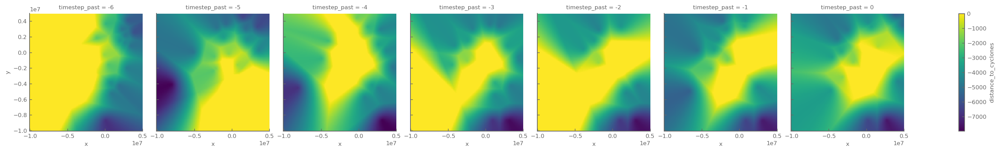

In [23]:
(dist_to_all_cycs - dist_to_main_cycs).isel(time_of_event=0).plot(col='timestep_past')

In [9]:
all_ds_lrp = []
for k in tqdm(range(7)):
    df_ = ds_.isel(timestep_past=k).to_dataframe().reset_index().sort_values('dist_to_all_cycs').reset_index().reset_index()
    df_['bins'] = df_.level_0//(128*235)
    df_lrp = df_.set_index('bins').reset_index().groupby('bins').lrp_normed.apply(lambda x:pd.Series(x.values)).unstack().T.apply(np.sort).apply(np.flip)
    df_dist = df_.set_index('bins').reset_index().groupby('bins').dist_to_all_cycs.min()
    ds_lrp = df_lrp.stack().to_xarray().rename('attribution').rename(level_0='pixel', bins='distance_to_cyclone')*100
    ds_lrp = ds_lrp.assign_coords(distance_to_cyclone=df_dist.values)
    ds_lrp = ds_lrp.assign_coords(pixel=np.linspace(0,100,ds_lrp.pixel.size)).clip(max=100, min=-100)
    all_ds_lrp.append(ds_lrp)

# (ds_lrp).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), cmap='RdBu_r', yincrease=True)

  0%|          | 0/7 [00:00<?, ?it/s]

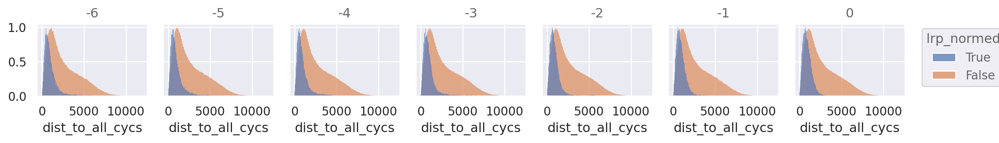

In [20]:
df_ = ds_.to_dataframe().reset_index().sort_values('dist_to_all_cycs')
(so.Plot(df_, x='dist_to_all_cycs', color=df_.lrp_normed>.5)
 .add(so.Bars(), so.Hist(), so.Norm())
 .facet(col='timestep_past')
 .layout(size=(12,2))
 )

<Axes: xlabel='dist_to_all_cycs', ylabel='lrp_normed'>

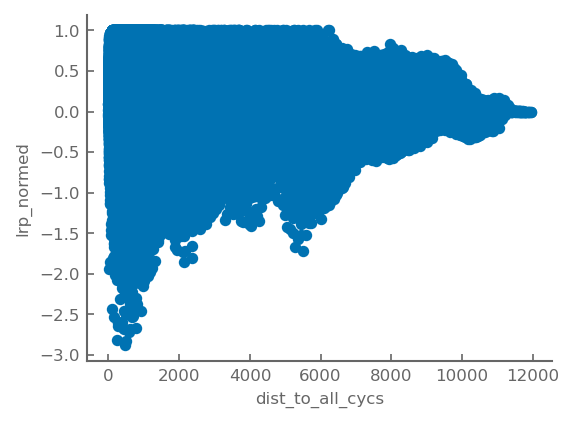

In [19]:
df_.plot.scatter(x='dist_to_all_cycs', y='lrp_normed')

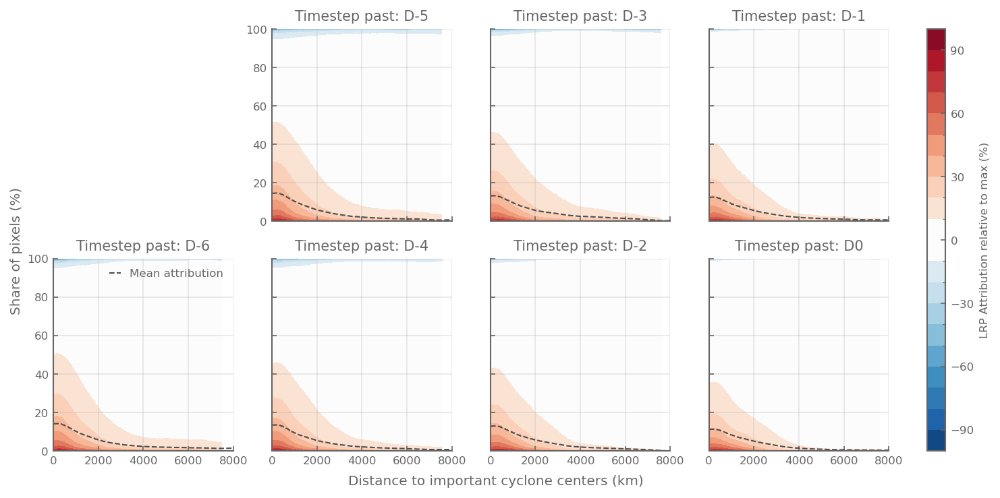

In [15]:
fig, axs = plt.subplot_mosaic("""
                               .BDFh
                               ACEGh
                               """, 
                               width_ratios = [10,10,10,10,1],
                               figsize=(10,5),
                            #    sharex=''
                               )


cmap = sns.color_palette('RdBu_r', 20)
cmap[9] = (0.99,0.99,0.99)
cmap[10] = (0.99,0.99,0.99)
# cmap = cmap[6:]

(all_ds_lrp[0].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['A'], cbar_ax=axs['h'])
(all_ds_lrp[1].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['B'], cbar_ax=axs['h'])
(all_ds_lrp[2].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['C'], cbar_ax=axs['h'])
(all_ds_lrp[3].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['D'], cbar_ax=axs['h'])
(all_ds_lrp[4].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['E'], cbar_ax=axs['h'])
(all_ds_lrp[5].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['F'], cbar_ax=axs['h'])
(all_ds_lrp[6].clip(-100)).isel(distance_to_cyclone=slice(0,-1)).plot.contourf(levels=np.arange(-100,101,10), colors=cmap, yincrease=True, ax=axs['G'], cbar_ax=axs['h'])

for k,letter in enumerate(['A','B','C','D','E','F','G']):
    all_ds_lrp[k].mean('pixel').plot(ax=axs[letter], color='.3', ls='--',label='Mean attribution')
    axs[letter].set_ylim(0,100)
    axs[letter].set_xlim(0,8000)
    axs[letter].set_title(f'Timestep past: D{-(6-k)}')
    axs[letter].set_xlabel('')
    axs[letter].set_ylim(0,100)
    axs[letter].grid(ls='-', alpha=0.3)
for k,letter in enumerate(['C','D','E','F','G']):
    axs[letter].set_ylabel('')
    axs[letter].tick_params(labelleft=False)

for k,letter in enumerate(['B','D','F']):
    axs[letter].set_xlabel('')
    axs[letter].tick_params(labelbottom=False)
axs['B'].set_ylabel('')
axs['A'].set_ylabel('')
axs['A'].legend()

axs['h'].set_ylabel('LRP Attribution relative to max (%)')
fig.supylabel('Share of pixels (%)')
fig.supxlabel('Distance to important cyclone centers (km)',y =.03)

plt.tight_layout()

In [136]:
from scipy.stats import mannwhitneyu, kstest


In [ ]:
# df_.query("lrp_normed==1").dist_to_all_cycs
df_.dist_to_all_cycs

0           698.899175
1           472.999276
2           787.013011
3           595.531476
4          2047.682985
              ...     
3850235    1111.444474
3850236     379.161803
3850237    3026.568931
3850238     319.560781
3850239     642.908556
Name: dist_to_all_cycs, Length: 3850240, dtype: float64

In [140]:
tests_pvalues = [kstest(df_.dist_to_all_cycs, df_.query(f"(lrp_normed>={k} )&(lrp_normed<={k+.1} ) ").dist_to_all_cycs).pvalue for k in tqdm(np.arange(-1,1.1,.1))]

  0%|          | 0/21 [00:00<?, ?it/s]

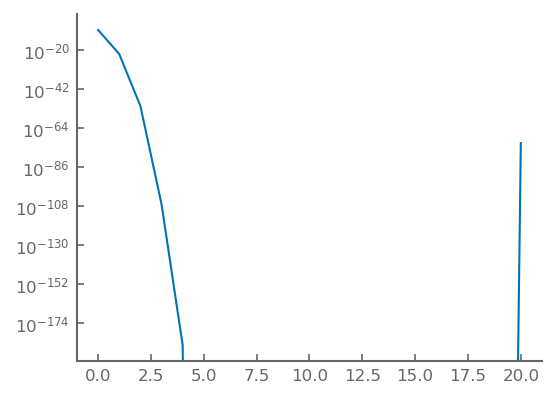

In [144]:
plt.plot(tests_pvalues)
plt.yscale('log')

In [ ]:
df_ = ds_.isel(timestep_past=k).to_dataframe().reset_index().sort_values('lrp_normed').reset_index().reset_index()
df_['lrp_bins'] = pd.cut(df_['lrp_normed']*100, np.arange(-100,100.1,10))
df_['distance_bins'] = pd.cut(df_['dist_to_all_cycs'], [0,1000,2000,3000,4000,5000,10000])
# (so.Plot(df_, x='lrp_bins', color='dist_to_all_cycs')
#  .add(so.Area(), so.Count(), so.Stack())
#  )
# # df_

Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7f1c17a1d670>>
Traceback (most recent call last):
  File "/home/rogui7909/.local/lib/python3.12/site-packages/ipykernel/ipkernel.py", line 781, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(

KeyboardInterrupt: 


In [87]:
df_c = df_.groupby(['lrp_bins','distance_bins']).index.count()#.reset_index()
# df_c.distance_bins = [k.right for k in df_c.distance_bins]

/tmp/ipykernel_948049/2768157159.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_c = df_.groupby(['lrp_bins','distance_bins']).index.count()#.reset_index()


In [119]:
df_c.unstack()

distance_bins,"(0, 500]","(500, 1000]","(1000, 2000]","(2000, 3000]","(3000, 4000]","(4000, 5000]","(5000, 10000]"
lrp_bins,,,,,,,
"(-100.0, -90.0]",29,37,54,23,21,11,2
"(-90.0, -80.0]",58,91,121,42,33,21,7
"(-80.0, -70.0]",82,184,246,62,46,45,11
"(-70.0, -60.0]",178,340,469,138,69,61,26
"(-60.0, -50.0]",319,675,889,321,133,85,71
"(-50.0, -40.0]",581,1304,1824,640,269,184,175
"(-40.0, -30.0]",1174,2417,3421,1324,619,347,504
"(-30.0, -20.0]",2595,5545,7978,3073,1428,960,1544
"(-20.0, -10.0]",5381,13396,23685,9424,5150,3780,6590


<Axes: ylabel='Frequency'>

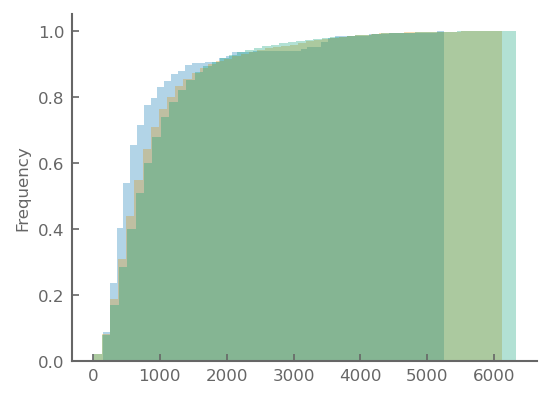

In [100]:
# df_.loc[df_.lrp_normed<0.5].dist_to_all_cycs.plot.hist(bins=50)
# df_.dist_to_all_cycs.plot.hist(bins=50, density=True, cumulative=True)
df_.loc[df_.lrp_normed==1].dist_to_all_cycs.plot.hist(bins=50, density=True, alpha=.3, cumulative=True)
df_.loc[df_.lrp_normed>.75].dist_to_all_cycs.plot.hist(bins=50, density=True, alpha=.3, cumulative=True)
df_.loc[df_.lrp_normed>.5].dist_to_all_cycs.plot.hist(bins=50, density=True, alpha=.3, cumulative=True)

<Axes: xlabel='lrp_bins', ylabel='distance_bins'>

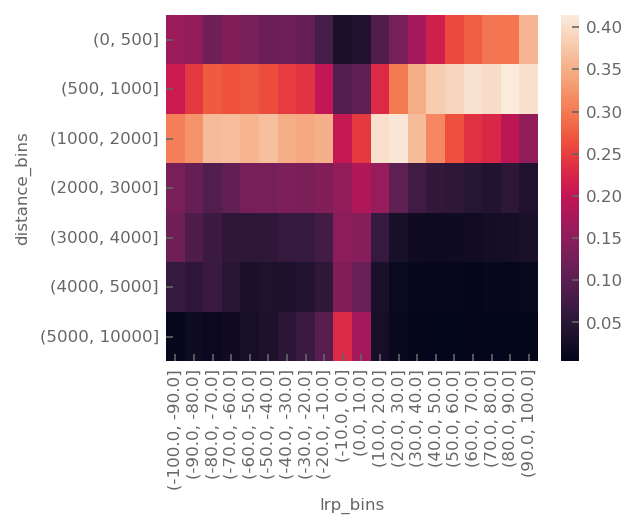

In [116]:
sns.heatmap((df_c.unstack().T/df_c.unstack().T.sum()))

/tmp/ipykernel_948049/4077058998.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_.groupby('lrp_bins').dist_to_all_cycs.quantile(np.arange(0,1.1,.1)).unstack().plot()


<Axes: xlabel='lrp_bins'>

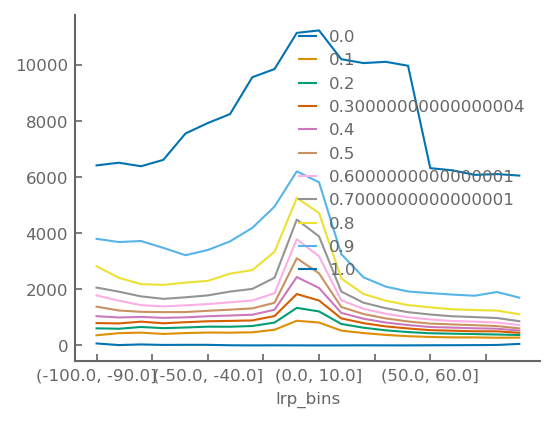

In [108]:
df_.groupby('lrp_bins').dist_to_all_cycs.quantile(np.arange(0,1.1,.1)).unstack().plot()

Ill-defined clip_path detected. Returning None.


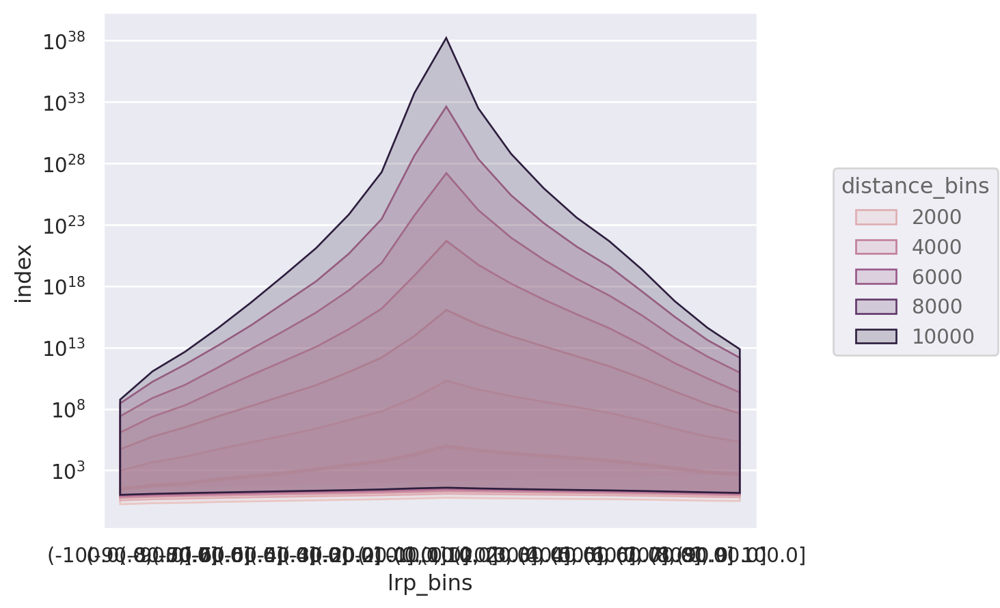

In [ ]:
(so.Plot(df_c, color='distance_bins', y='index', x='lrp_bins')
 .add()
 .scale(y='log'))

# Classify important cyclones

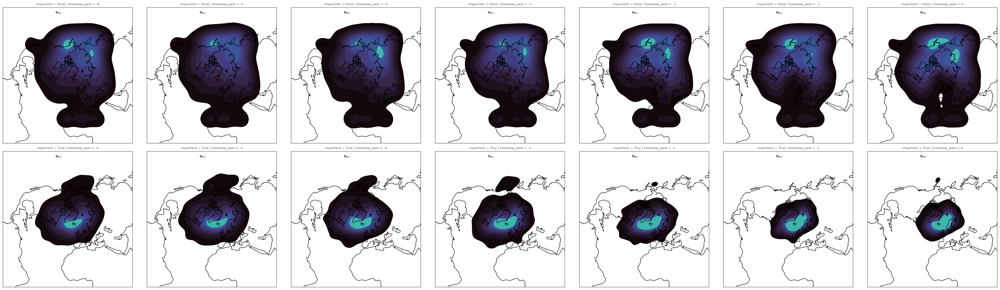

In [44]:
df_important = important_cyclones.rename('important').to_dataframe().dropna().reset_index()
df_important['date'] = df_important.time_of_event + df_important.timestep_past*pd.Timedelta('1D')
df_important = df_important.set_index(['date','track_id'])
df_important[['lon','lat','x','y','msl']]=daily_cycs.groupby(['date','track_id']).first().loc[df_important.index][['lon','lat','x','y','msl']]
plot = sns.displot(df_important, x='x',y='y', kind='kde', fill=True, col='timestep_past',row='important', cmap='mako',transform=proj, facet_kws=dict(subplot_kws=dict(projection=proj)))
for ax in plot.axes.flat:
    ax.coastlines()

In [45]:
import numpy as np
import xarray as xr
import geopandas as gpd
from shapely.geometry import shape
from shapely.ops import unary_union
from rasterio.features import shapes
from rasterio.transform import Affine

def _pick_coord(da, candidates):
    for c in candidates:
        if c in da.coords:
            return c
    raise ValueError(f"Could not find any of {candidates} in DataArray coords.")

def _affine_from_1d_coords(x, y):
    """
    Build an affine transform that maps array indices to the coordinate space
    when x,y are 1D coordinates giving cell centers on a regular grid.
    """
    # mean spacing (assumes ~regular spacing)
    dx = float(np.mean(np.diff(x)))
    dy = float(np.mean(np.diff(y)))

    # if latitude is descending (common), dy will be negative; we want a transform
    # whose scale has positive dx and *negative* dy so row index increases downward
    # and y decreases.
    # Top-left corner of the [0,0] pixel (half a pixel up/left from the first centers)
    x0 = x[0] - dx / 2.0
    y0 = y[0] + dy / 2.0  # note dy could be negative

    # Build transform: translate to top-left corner, then scale
    # Scale uses dx and dy as-is; if dy is negative (lat descending), the sign encodes that.
    return Affine.translation(x0, y0) * Affine.scale(dx, dy)

def mask_to_gdf(mask_da, assume_crs="EPSG:4326", dissolve=True, simplify=None):
    """
    Convert a boolean xarray.DataArray mask on a regular grid to a GeoDataFrame of polygons.
    
    Parameters
    ----------
    mask_da : xr.DataArray (boolean)
        Dimensions must include either (lat, lon) or (y, x) with 1D coords.
    assume_crs : str or None
        CRS to use if none is found on the DataArray (default EPSG:4326).
    dissolve : bool
        If True, merges touching/overlapping polygons into multipart regions.
    simplify : float or None
        If set, applies shapely .simplify(tolerance) in the mask’s CRS units.
    """
    if mask_da.dtype != bool:
        raise ValueError("mask_da must be boolean (True for inside).")

    # Identify coord names
    y_name = _pick_coord(mask_da, ["lat", "latitude", "y"])
    x_name = _pick_coord(mask_da, ["lon", "longitude", "x"])
    y = mask_da[y_name].values
    x = mask_da[x_name].values
    if y.ndim != 1 or x.ndim != 1:
        raise ValueError("This method requires 1D regular coords for x and y.")

    # Build affine
    transform = _affine_from_1d_coords(x, y)

    # Rasterio wants 0/1 integers and an optional mask
    img = mask_da.astype(np.uint8).values
    shps = shapes(img, mask=img == 1, transform=transform)

    geoms = [shape(geom) for geom, val in shps if val == 1]

    if not geoms:
        return gpd.GeoDataFrame(geometry=[], crs=assume_crs)

    gdf = gpd.GeoDataFrame(geometry=geoms, crs=getattr(getattr(mask_da, "rio", None), "crs", None) or assume_crs)

    # Clean geometry (fix slivers) and optionally dissolve/simplify
    gdf["geometry"] = gdf.buffer(0)

    if dissolve:
        merged = unary_union(gdf.geometry)
        gdf = gpd.GeoDataFrame(geometry=[merged], crs=gdf.crs).explode(index_parts=False).reset_index(drop=True)

    if simplify:
        gdf["geometry"] = gdf.geometry.simplify(simplify, preserve_topology=True)

    # Drop empty/invalid geometries
    gdf = gdf[~gdf.geometry.is_empty & gdf.geometry.is_valid].reset_index(drop=True)
    return gdf

regions_mask = xr.open_dataset('/home/rogui7909/code/predict_rain_norway/RECCAP2_region_masks_all.nc')
# change 0-380 to -180 180
regions_mask = regions_mask.assign_coords(lon=(((regions_mask.lon + 180) % 360) - 180)).sortby('lon')
regions_mask = regions_mask.where(regions_mask>0)


<GeoAxes: >

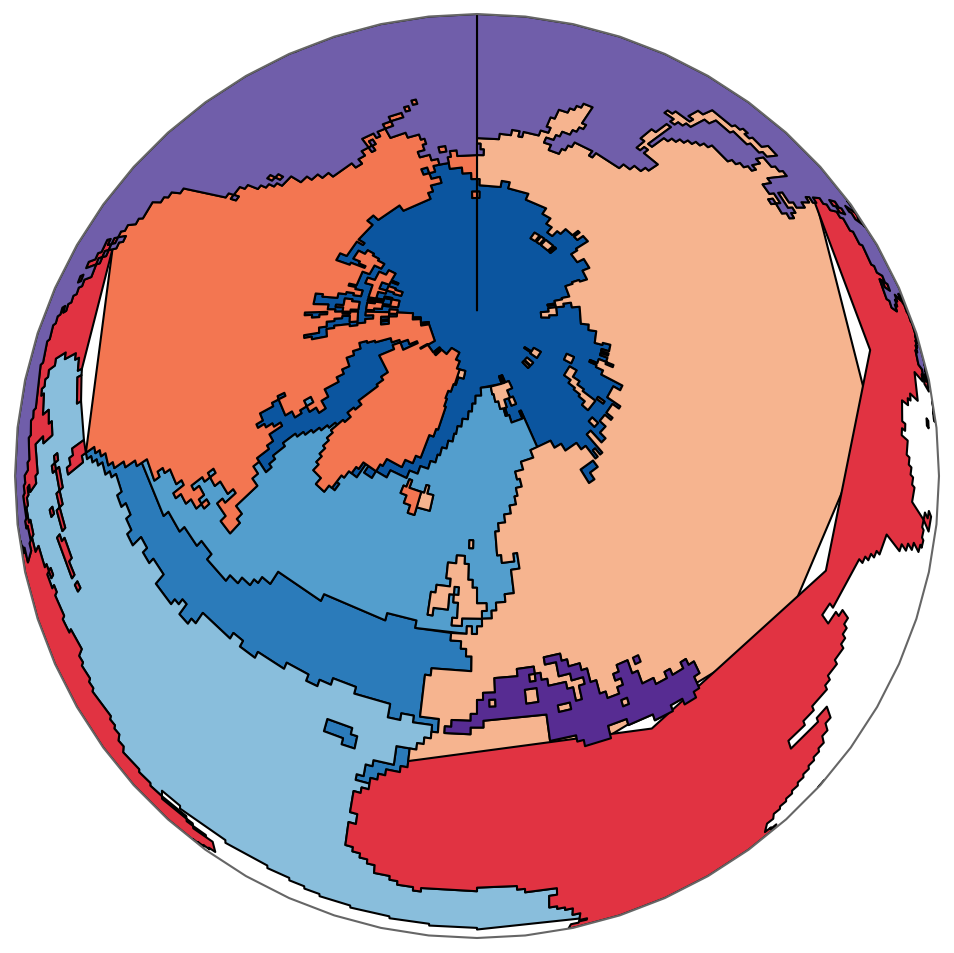

In [11]:
from shapely.ops import unary_union


gdf_atl_N = mask_to_gdf((regions_mask.atlantic==1), dissolve=False)
gdf_atl_trop = mask_to_gdf((regions_mask.atlantic==3)|(regions_mask.atlantic==4), dissolve=False)
gdf_atl_midlat = mask_to_gdf(regions_mask.atlantic==2, dissolve=False)
gdf_pac = mask_to_gdf((regions_mask.open_ocean==2), dissolve=False)
gdf_med = mask_to_gdf((regions_mask.atlantic==6), dissolve=False)
gdf_arctic = mask_to_gdf((regions_mask.open_ocean.isel(lat=slice(1,-2))==4), dissolve=False)
gdf_land_NA = mask_to_gdf((regions_mask.seamask.isnull())&(regions_mask.lon<-18)&(regions_mask.lat>30), dissolve=False)
gdf_land_eurasia = mask_to_gdf((regions_mask.seamask.isnull())&(regions_mask.lon>-18)&(regions_mask.lat>30), dissolve=False)
gdf_land_trop = mask_to_gdf((regions_mask.seamask.isnull())&(regions_mask.lat<30), dissolve=False)

colors = sns.color_palette('Blues_r')[:4] + sns.color_palette('rocket_r')[:3]+sns.color_palette('Purples_r')[:3]

polygons_masks = gpd.GeoDataFrame(geometry=[unary_union(gdf_atl_N.geometry),
                                 unary_union(gdf_atl_midlat.geometry),
                                 unary_union(gdf_atl_trop.geometry),
                                 unary_union(gdf_pac.geometry),
                                 unary_union(gdf_arctic.geometry),
                                 unary_union(gdf_med.geometry),
                                 unary_union(gdf_land_NA.geometry),
                                 unary_union(gdf_land_eurasia.geometry),
                                 unary_union(gdf_land_trop),
                                 
                                 
                                 ], crs=gdf_atl_N.crs,
                                 index = ['Atlantic North','Atlantic Midlat','Atlantic Tropics','Pacific','Arctic Ocean', 'Mediterranean Sea', 
                                        'Continents North America', 'Continents Eurasia', 'Continents Tropics'])
polygons_masks.index = polygons_masks.index.rename('poly_id')
polygons_masks = polygons_masks.loc[['Arctic Ocean', 'Atlantic Midlat','Atlantic North',  'Atlantic Tropics', 
                   'Continents Eurasia', 'Continents North America',
                   'Continents Tropics', 'Mediterranean Sea', 'Pacific',
                   ]]
fig, ax = plt.subplots(figsize=(8,8), subplot_kw=dict(projection=ccrs.Orthographic(0,70)))

polygons_masks.plot(edgecolor="k", color=colors, transform=ccrs.PlateCarree(), ax=ax, legend=True)
# gdf_atl_trop.plot(edgecolor="k", facecolor="C1", transform=ccrs.PlateCarree(), ax=ax)
# gdf_atl_midlat.plot(edgecolor="k", facecolor="C2", transform=ccrs.PlateCarree(), ax=ax)
# gdf_pac.plot(edgecolor="k", facecolor="C0", transform=ccrs.PlateCarree(), ax=ax)
# gdf_arctic.plot(edgecolor="k", facecolor="C5", transform=ccrs.PlateCarree(), ax=ax)

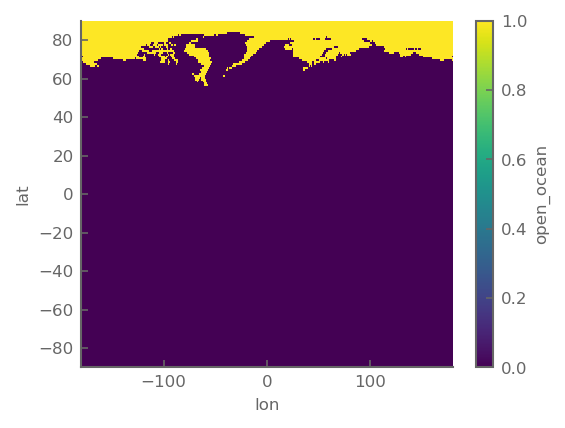

In [114]:
(regions_mask.open_ocean==4).plot()

/tmp/ipykernel_1350550/212410377.py:73: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


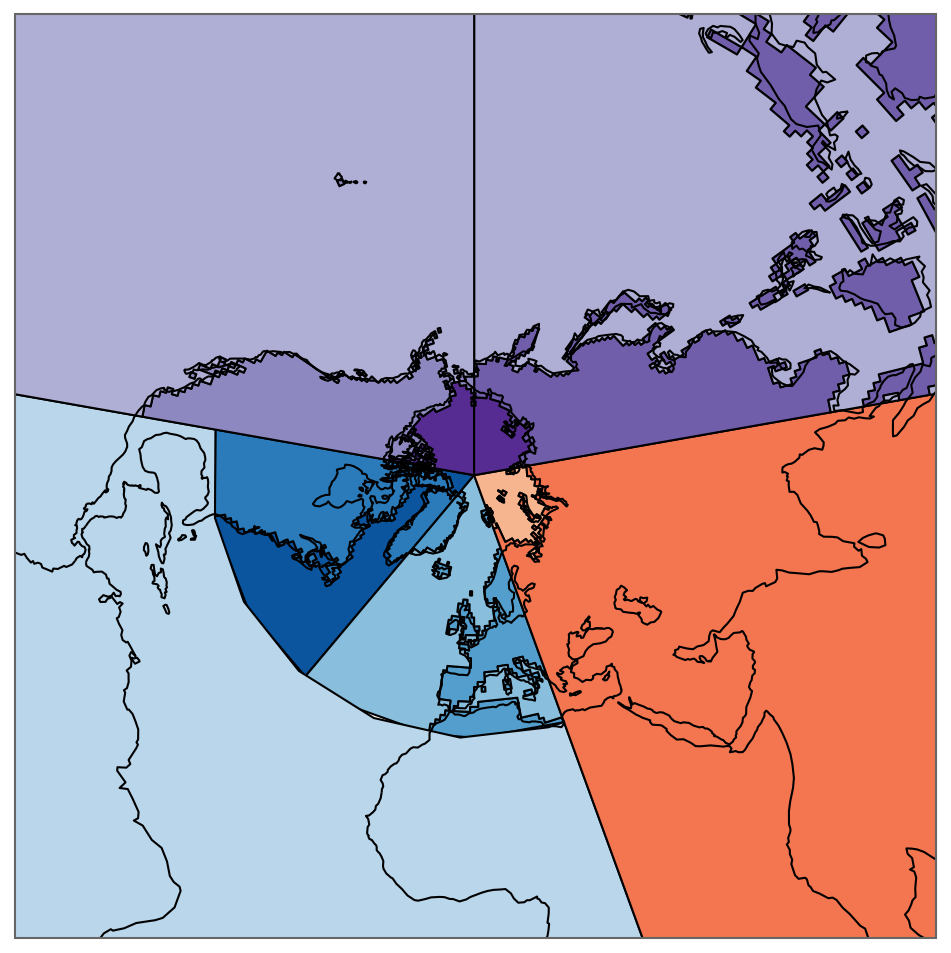

In [191]:
from shapely.ops import unary_union

# gdf_atl = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon<-100), dissolve=False)
gdf_pac_arctic = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where(((regions_mask.lon<-100)|(regions_mask.lon>100))&(regions_mask.open_ocean==4))==1, dissolve=False)
gdf_pac_NA = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon<-100)&(regions_mask.open_ocean.isnull()))==1, dissolve=False)
gdf_pac_asia = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>100)&(regions_mask.open_ocean.isnull()))==1, dissolve=False)
gdf_pac_oce = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where(((regions_mask.lon<-100)|(regions_mask.lon>100))&(regions_mask.open_ocean!=4)&(regions_mask.open_ocean.notnull()))==1, dissolve=False)

gdf_NatlWcont = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>-40)&(regions_mask.lon<20)&(regions_mask.lat>30)&(regions_mask.open_ocean.isnull()))==1, dissolve=False)
gdf_NatlWoce = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>-40)&(regions_mask.lon<20)&(regions_mask.lat>30)&(regions_mask.open_ocean.notnull()))==1, dissolve=False)
gdf_NatlEcont = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>-100)&(regions_mask.lon<-40)&(regions_mask.lat>30)&(regions_mask.open_ocean.notnull()))==1, dissolve=False)
gdf_NatlEoce = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>-100)&(regions_mask.lon<-40)&(regions_mask.lat>30)&(regions_mask.open_ocean.isnull()))==1, dissolve=False)
gdf_tropatl = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>-100)&(regions_mask.lon<20)&(regions_mask.lat<30))==1, dissolve=False)
gdf_eurasia_cont = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>20)&(regions_mask.lon<100)&(regions_mask.open_ocean!=4))==1, dissolve=False)
gdf_eurasia_oce = mask_to_gdf(xr.ones_like(regions_mask.open_ocean).where((regions_mask.lon>20)&(regions_mask.lon<100)&(regions_mask.open_ocean==4))==1, dissolve=False)
# gdf_atl_N = mask_to_gdf((regions_mask.atlantic==1), dissolve=False)
# gdf_atl_trop = mask_to_gdf((regions_mask.atlantic==3)|(regions_mask.atlantic==4), dissolve=False)
# gdf_atl_midlat = mask_to_gdf(regions_mask.atlantic==2, dissolve=False)
# gdf_pac = mask_to_gdf((regions_mask.open_ocean==2), dissolve=False)
# gdf_med = mask_to_gdf((regions_mask.atlantic==6), dissolve=False)
# gdf_arctic = mask_to_gdf((regions_mask.open_ocean.isel(lat=slice(1,-2))==4), dissolve=False)
# gdf_land_NA = mask_to_gdf((regions_mask.seamask.isnull())&(regions_mask.lon<-18)&(regions_mask.lat>30), dissolve=False)
# gdf_land_eurasia = mask_to_gdf((regions_mask.seamask.isnull())&(regions_mask.lon>-18)&(regions_mask.lat>30), dissolve=False)
# gdf_land_trop = mask_to_gdf((regions_mask.seamask.isnull())&(regions_mask.lat<30), dissolve=False)

colors = sns.color_palette('Blues_r')[:5] + sns.color_palette('rocket_r')[:2]+sns.color_palette('Purples_r')[:4]

polygons_masks = gpd.GeoDataFrame(geometry=[
                                            unary_union(gdf_pac_arctic.geometry),
                                            unary_union(gdf_pac_NA.geometry),
                                            unary_union(gdf_pac_asia.geometry),
                                            unary_union(gdf_pac_oce.geometry),
                                            unary_union(gdf_NatlWcont.geometry),
                                            unary_union(gdf_NatlWoce.geometry),
                                            unary_union(gdf_NatlEcont.geometry),
                                            unary_union(gdf_NatlEoce.geometry),
                                            unary_union(gdf_tropatl.geometry),
                                            unary_union(gdf_eurasia_cont.geometry),
                                            unary_union(gdf_eurasia_oce.geometry),
                                #  unary_union(gdf_atl_midlat.geometry),
                                #  unary_union(gdf_atl_trop.geometry),
                                #  unary_union(gdf_pac.geometry),
                                #  unary_union(gdf_arctic.geometry),
                                #  unary_union(gdf_med.geometry),
                                #  unary_union(gdf_land_NA.geometry),
                                #  unary_union(gdf_land_eurasia.geometry),
                                #  unary_union(gdf_land_trop),
                                 
                                 
                                 ], crs=gdf_pac.crs,
                                 index = ['Pacific Arctic',
                                          'Pacific North America',
                                           'Pacific Asia',
                                          'Pacific ocean',
                                          'Atlantic North W continents','Atlantic North W oceans','Atlantic North E continents','Atlantic North E oceans', 
                                          'Atlantic Tropical', 
                                          'Eurasia continents', 'Eurasia Arctic'
                                        
                                        ])
polygons_masks.index = polygons_masks.index.rename('poly_id')
polygons_masks = polygons_masks.sort_index()
# polygons_masks = polygons_masks.loc[['Pacific','North Atlantic W','North Atlantic E', 'Tropical Atlantic', 'Continental Eurasia'
#                 #                      'Atlantic Midlat','Atlantic North',  'Atlantic Tropics', 
#                 #    'Continents Eurasia', 'Continents North America',
#                 #    'Continents Tropics', 'Mediterranean Sea', 'Pacific',
#                    ]]
fig, ax = plt.subplots(figsize=(8,8), subplot_kw=dict(projection=ccrs.NorthPolarStereo(0, 70)))

polygons_masks.plot(edgecolor="k", color=colors, transform=ccrs.PlateCarree(), ax=ax, legend=True)
ax.set_extent((0,360,0,90), crs=ccrs.PlateCarree())
ax.coastlines()
polygons_masks['domain'] = polygons_masks.reset_index().poly_id.str.split(' ', expand=True).iloc[:,0].values
ax.legend()

In [163]:
polygons_masks

,geometry,domain
poly_id,,
Pacific Arctic,"MULTIPOLYGON (((-162 68, -162 67, -164 67, -16...",Pacific
Pacific North America,"MULTIPOLYGON (((-151 -76, -151 -77, -150 -77, ...",Pacific
Pacific Asia,"MULTIPOLYGON (((122 -8, 120 -8, 120 -9, 119 -9...",Pacific
Pacific ocean,"MULTIPOLYGON (((-174 65, -172 65, -172 66, -17...",Pacific
Atlantic North W continents,"MULTIPOLYGON (((15 38, 13 38, 13 39, 15 39, 15...",Atlantic
Atlantic North W oceans,"MULTIPOLYGON (((11 44, 11 43, 12 43, 12 42, 15...",Atlantic
Atlantic North E continents,"MULTIPOLYGON (((-71 63, -72 63, -72 64, -71 64...",Atlantic
Atlantic North E oceans,"MULTIPOLYGON (((-60 48, -60 47, -61 47, -61 48...",Atlantic
Atlantic Tropical,"POLYGON ((-100 -89, -100 31, 20 31, 20 -89, -1...",Atlantic


In [147]:
polygons_masks

,geometry
poly_id,
Pacific Arctic,"MULTIPOLYGON (((-162 68, -162 67, -164 67, -16..."
Pacific North America,"MULTIPOLYGON (((-151 -76, -151 -77, -150 -77, ..."
Pacific Asia,"MULTIPOLYGON (((122 -8, 120 -8, 120 -9, 119 -9..."
Pacific ocean,"MULTIPOLYGON (((-174 65, -172 65, -172 66, -17..."
NorthAtlantic W continents,"MULTIPOLYGON (((15 38, 13 38, 13 39, 15 39, 15..."
NorthAtlantic W oceans,"MULTIPOLYGON (((11 44, 11 43, 12 43, 12 42, 15..."
NorthAtlantic E continents,"MULTIPOLYGON (((-71 63, -72 63, -72 64, -71 64..."
NorthAtlantic E oceans,"MULTIPOLYGON (((-60 48, -60 47, -61 47, -61 48..."
Tropical Atlantic,"POLYGON ((-100 -89, -100 31, 20 31, 20 -89, -1..."


In [194]:
cyclones_gdf = gpd.GeoDataFrame(
    df_important.reset_index(),
    geometry=gpd.points_from_xy(df_important["lon"], df_important["lat"]),
    crs="EPSG:4326"  # adjust if your cyclones are in another CRS
)

if polygons_masks.crs is None:
    polygons_masks = polygons_masks.set_crs("EPSG:4326")  # if appropriate
cyclones_gdf = cyclones_gdf.to_crs(polygons_masks.crs)

joined = gpd.sjoin(cyclones_gdf, polygons_masks.reset_index()[["poly_id", "geometry"]],
                   how="left", predicate="within") 
unmatched = joined[joined["poly_id"].isna()].drop(columns=["index_right"])

if not unmatched.empty:
    # Optional: project to a metric CRS for meaningful distances (meters)
    # Example for Norway: EPSG:5972 (ETRS89 / TM35FIN(N,E)) or choose a local UTM zone
    metric_crs = "EPSG:3857"
    polygons_m = polygons_masks.to_crs(metric_crs).reset_index()
    unmatched_m = unmatched.to_crs(metric_crs)

    nearest = gpd.sjoin_nearest(
        unmatched_m,
        polygons_m[["poly_id", "geometry"]],
        how="left",
        distance_col="dist_m"  # distance in CRS units
    ).to_crs(polygons_masks.crs)

    # Optionally filter by a maximum distance (e.g., 50 km)
    max_dist_m = 50_000
    nearest.loc[nearest["dist_m"] > max_dist_m, "poly_id"] = None

    # merge back
    joined.loc[unmatched.index, ["poly_id"]] = nearest.set_index(unmatched.index)["poly_id"]
# joined['day'] = pd.to_datetime(joined.day)
joined['domain'] = joined.poly_id.str.split(' ', expand=True).iloc[:,0].values


In [172]:
sns.color_palette(colors)

[(0.044059976931949255, 0.3338869665513264, 0.6244521337946944),
 (0.16696655132641294, 0.48069204152249134, 0.7291503267973857),
 (0.3262898885044214, 0.6186236063052672, 0.802798923490965),
 (0.5356862745098039, 0.746082276047674, 0.8642522106881968),
 (0.96516917, 0.70776351, 0.5606593),
 (0.95381595, 0.46373781, 0.31769923),
 (0.8833417, 0.19830556, 0.26014181),
 (0.3405767012687428, 0.1742560553633218, 0.5709342560553633),
 (0.440722798923491, 0.36772010765090346, 0.6653902345251825),
 (0.5513264129181085, 0.537916186082276, 0.7524490580545944)]

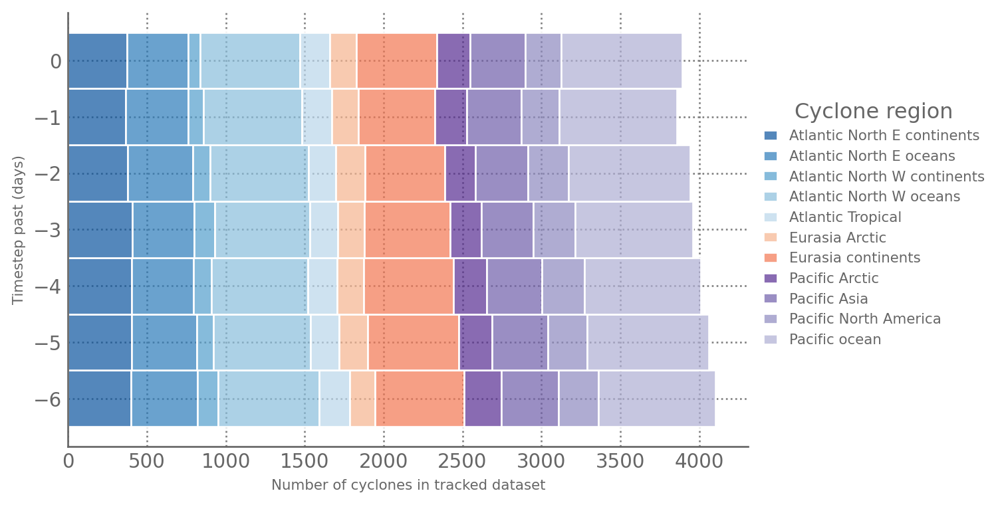

In [173]:

colors = sns.color_palette('Blues_r')[:5] + sns.color_palette('rocket_r')[:2]+sns.color_palette('Purples_r')[:4]

(so.Plot(joined.sort_values('poly_id'), color='poly_id',y='timestep_past')
 .add(so.Bars(), so.Count(), so.Stack(), orientation='y')
 .scale(color=so.Nominal(colors,
            ),
        )
#  .facet(col='timestep_past')

.layout(size=(6,4))
.label(y='Timestep past (days)', x='Number of cyclones in tracked dataset', color='Cyclone region')
 .theme(plt.style.library["robin"])
 .theme({'axes.grid':True, 'grid.color':'.5'})
)

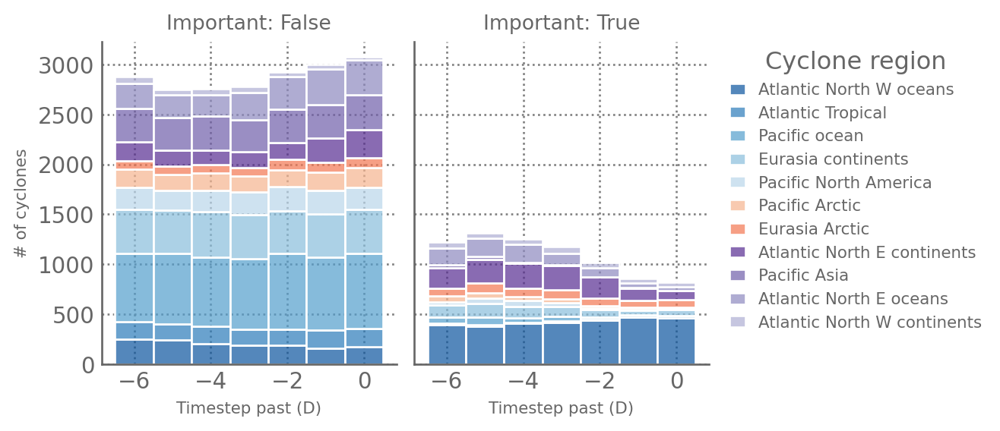

In [174]:
(so.Plot(joined, x='timestep_past', color='poly_id')
        .add(so.Bars(), so.Count(),so.Stack(), orientation='y')
        .facet(col='important')
         .scale(color=so.Nominal(colors,
            ),
        )
        .layout(size=(5,3))
        .theme(plt.style.library["robin"])
        .theme({'axes.grid':True, 'grid.color':'.5'})
        .label(col='Important:', y='# of cyclones', x='Timestep past (D)', color='Cyclone region')
 
 )

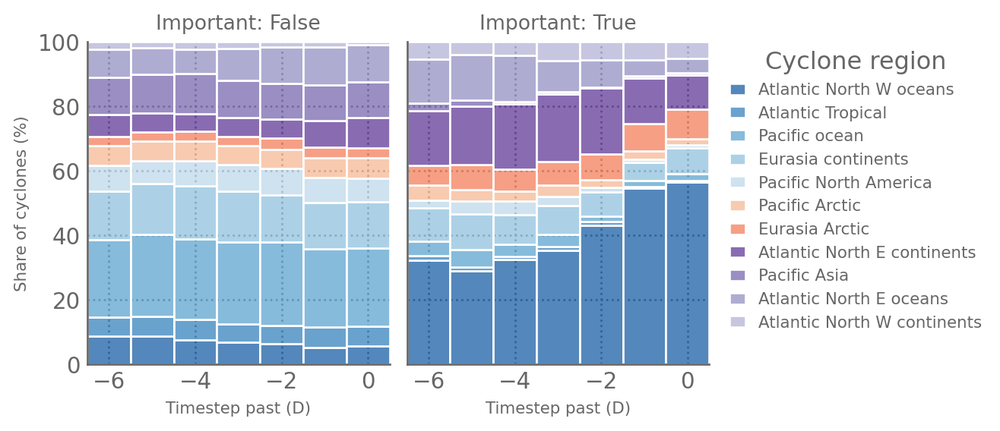

In [175]:
(so.Plot(joined, x='timestep_past', color='poly_id')
        .add(so.Bars(), so.Count(),so.Norm(func="sum", by=["x"],percent=True),so.Stack(), orientation='y')
        .facet(col='important')
         .scale(color=so.Nominal(colors,
            ),
        )
        .layout(size=(5,3))
        .theme(plt.style.library["robin"])
        .theme({'axes.grid':True, 'grid.color':'.5'})
        .label(col='Important:', y='Share of cyclones (%)', x='Timestep past (D)', color='Cyclone region')
        .limit(x=(-6.5,.5), y=(0,100))
 )
 

In [177]:
joined

,date,track_id,n_cyclone,timestep_past,time_of_event,important,lon,lat,x,y,msl,geometry,index_right,poly_id
0,1999-11-18,427319.0,0,-6,1999-11-24,True,-28.459756,86.841952,-1.405339e+05,-2.605745e+05,1005.193883,POINT (-28.45976 86.84195),5,Atlantic North W oceans
1,1999-11-22,427421.0,0,-6,1999-11-28,False,-55.604392,20.072782,-7.132754e+06,-4.880392e+06,1001.793932,POINT (-55.60439 20.07278),8,Atlantic Tropical
2,1999-11-24,427617.0,0,-6,1999-11-30,False,168.584731,59.975457,6.581794e+05,3.260219e+06,987.219269,POINT (168.58473 59.97546),3,Pacific ocean
3,1999-11-30,427800.0,0,-6,1999-12-06,False,145.676761,56.601811,2.096500e+06,3.071462e+06,996.788876,POINT (145.67676 56.60181),3,Pacific ocean
4,1999-12-11,428240.0,0,-6,1999-12-17,False,24.917632,61.068947,1.345281e+06,-2.900713e+06,986.638101,POINT (24.91763 61.06895),9,Eurasia continents
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27829,2008-10-18,613943.0,24,-2,2008-10-20,False,-107.469967,48.013836,-4.534622e+06,1.425179e+06,1006.971809,POINT (-107.46997 48.01384),1,Pacific North America
27830,2011-10-09,676571.0,24,-1,2011-10-10,False,-99.024354,42.958196,-5.324585e+06,8.456516e+05,1014.045207,POINT (-99.02435 42.9582),7,Atlantic North E oceans
27831,2011-10-09,676571.0,24,0,2011-10-09,False,-99.024354,42.958196,-5.324585e+06,8.456516e+05,1014.045207,POINT (-99.02435 42.9582),7,Atlantic North E oceans
27832,2003-06-13,502002.0,25,-6,2003-06-19,False,78.970374,66.957003,2.481985e+06,-4.842088e+05,1003.164440,POINT (78.97037 66.957),9,Eurasia continents


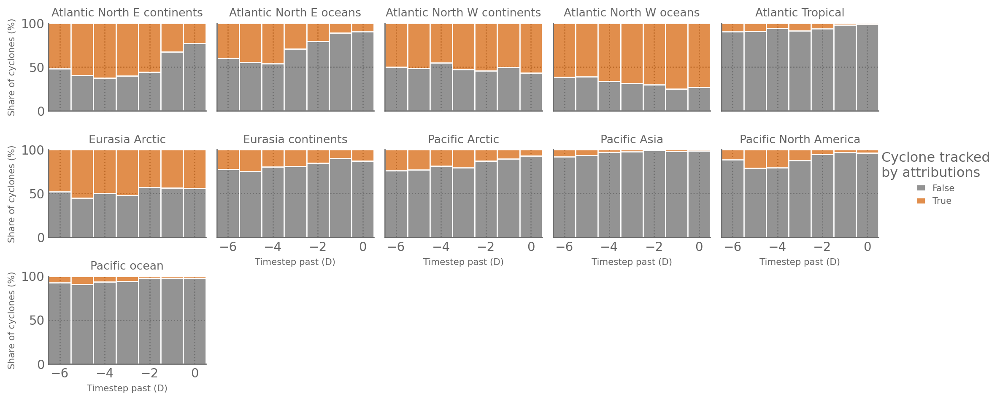

In [179]:
(so.Plot(joined.sort_values('poly_id'), x='timestep_past', color='important', y='timestep_past')
 .add(so.Bars(), so.Count(), so.Norm(func="sum", by=["x"],percent=True),so.Stack(), orientation='x')
 .facet(col='poly_id', wrap=5)
 .scale(color=so.Nominal(['.4','C3'], order=[False, True]))
.layout(size=(11,5))
.limit(x=(-6.5,0.5), y=(0,100))
# .share(y=False)
.label(y='Share of cyclones (%)', x='Timestep past (D)', color= 'Cyclone tracked\nby attributions')
 .theme(plt.style.library["robin"])
 .theme({'axes.grid':True, 'grid.color':'.5'})
#  .add(so.Text(color="w", halign="right"))

)

In [197]:
df_

,timestep_past,poly_id,important,detection_probability
1,-6,Atlantic North E continents,True,0.517588
3,-6,Atlantic North E oceans,True,0.397619
5,-6,Atlantic North W continents,True,0.500000
7,-6,Atlantic North W oceans,True,0.614062
9,-6,Atlantic Tropical,True,0.097938
...,...,...,...,...
145,0,Eurasia continents,True,0.128205
147,0,Pacific Arctic,True,0.070093
149,0,Pacific Asia,True,0.011527
151,0,Pacific North America,True,0.035088


In [196]:
joined

,date,track_id,n_cyclone,timestep_past,time_of_event,important,lon,lat,x,y,msl,geometry,index_right,poly_id,domain
0,1999-11-18,427319.0,0,-6,1999-11-24,True,-28.459756,86.841952,-1.405339e+05,-2.605745e+05,1005.193883,POINT (-28.45976 86.84195),3,Atlantic North W oceans,Atlantic
1,1999-11-22,427421.0,0,-6,1999-11-28,False,-55.604392,20.072782,-7.132754e+06,-4.880392e+06,1001.793932,POINT (-55.60439 20.07278),4,Atlantic Tropical,Atlantic
2,1999-11-24,427617.0,0,-6,1999-11-30,False,168.584731,59.975457,6.581794e+05,3.260219e+06,987.219269,POINT (168.58473 59.97546),10,Pacific ocean,Pacific
3,1999-11-30,427800.0,0,-6,1999-12-06,False,145.676761,56.601811,2.096500e+06,3.071462e+06,996.788876,POINT (145.67676 56.60181),10,Pacific ocean,Pacific
4,1999-12-11,428240.0,0,-6,1999-12-17,False,24.917632,61.068947,1.345281e+06,-2.900713e+06,986.638101,POINT (24.91763 61.06895),6,Eurasia continents,Eurasia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27829,2008-10-18,613943.0,24,-2,2008-10-20,False,-107.469967,48.013836,-4.534622e+06,1.425179e+06,1006.971809,POINT (-107.46997 48.01384),9,Pacific North America,Pacific
27830,2011-10-09,676571.0,24,-1,2011-10-10,False,-99.024354,42.958196,-5.324585e+06,8.456516e+05,1014.045207,POINT (-99.02435 42.9582),1,Atlantic North E oceans,Atlantic
27831,2011-10-09,676571.0,24,0,2011-10-09,False,-99.024354,42.958196,-5.324585e+06,8.456516e+05,1014.045207,POINT (-99.02435 42.9582),1,Atlantic North E oceans,Atlantic
27832,2003-06-13,502002.0,25,-6,2003-06-19,False,78.970374,66.957003,2.481985e+06,-4.842088e+05,1003.164440,POINT (78.97037 66.957),6,Eurasia continents,Eurasia


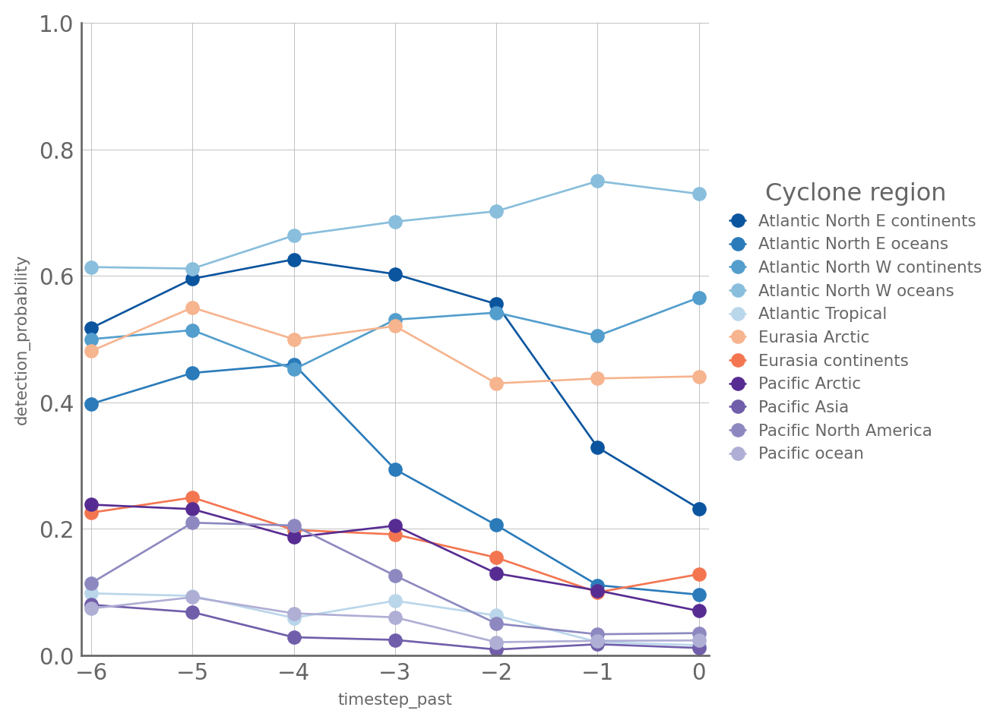

In [206]:
df_ = (joined.groupby(['timestep_past','poly_id','important']).count()/joined.groupby(['timestep_past','poly_id',]).count())
df_ = df_.x.rename('detection_probability').reset_index().query("important")
(so.Plot(df_,x='timestep_past', y='detection_probability', color='poly_id', )
    .add(so.Line(marker='o'))
     .theme(plt.style.library["robin"])
    .theme({'axes.grid':True, 'grid.color':'.7', 'grid.linestyle':'-', 'grid.linewidth':.3})
    .limit(y=(0,1), x=(-6.1,0.1))
    .label(color='Cyclone region')
    .scale(color=so.Nominal(colors,),
        )
    .layout(size=(5,5))
)

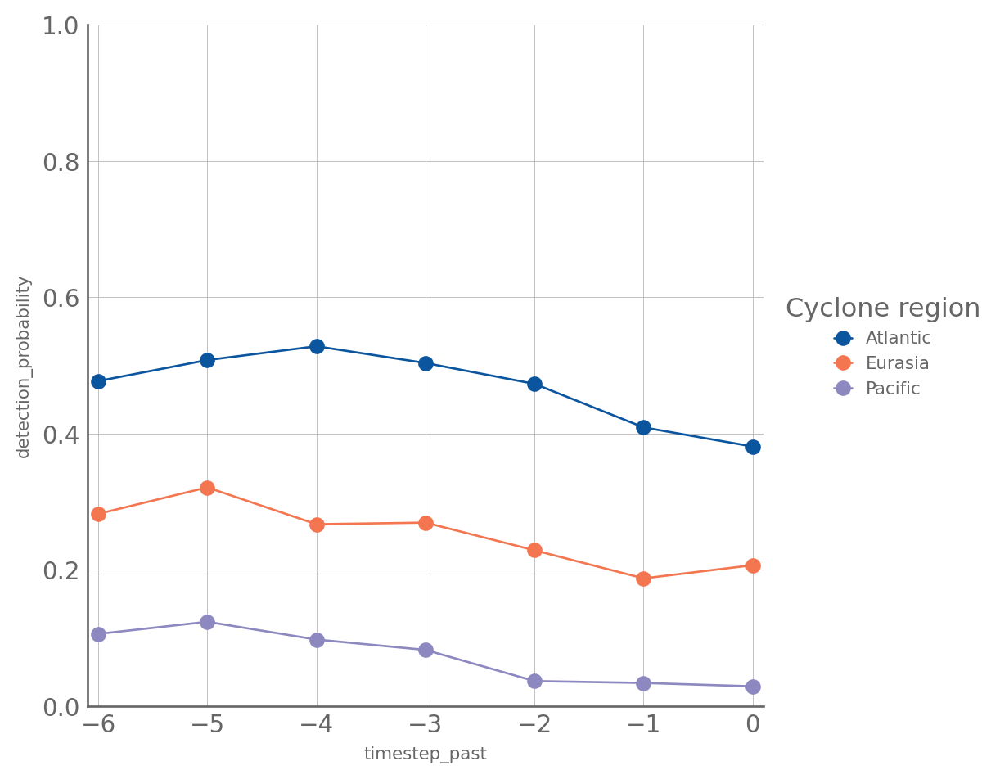

In [205]:
df_ = (joined.groupby(['timestep_past','domain','important']).count()/joined.groupby(['timestep_past','domain',]).count())
df_ = df_.x.rename('detection_probability').reset_index().query("important")
(so.Plot(df_,x='timestep_past', y='detection_probability', color='domain', )
    .add(so.Line(marker='o'))
     .theme(plt.style.library["robin"])
    .theme({'axes.grid':True, 'grid.color':'.7', 'grid.linestyle':'-', 'grid.linewidth':.3})
    .limit(y=(0,1), x=(-6.1,0.1))
    .label(color='Cyclone region')
    .scale(color=so.Nominal([colors[0],colors[6],colors[9]],),
        )
    .layout(size=(5,5))
)

/tmp/ipykernel_1350550/2574480974.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_ = joined.groupby(['timestep_past','poly_id','important', pd.cut(joined.msl, np.arange(940,1030,10))]).count()
/tmp/ipykernel_1350550/2574480974.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_ = df_/joined.groupby(['timestep_past','poly_id', pd.cut(joined.msl, np.arange(940,1030,10))]).count()


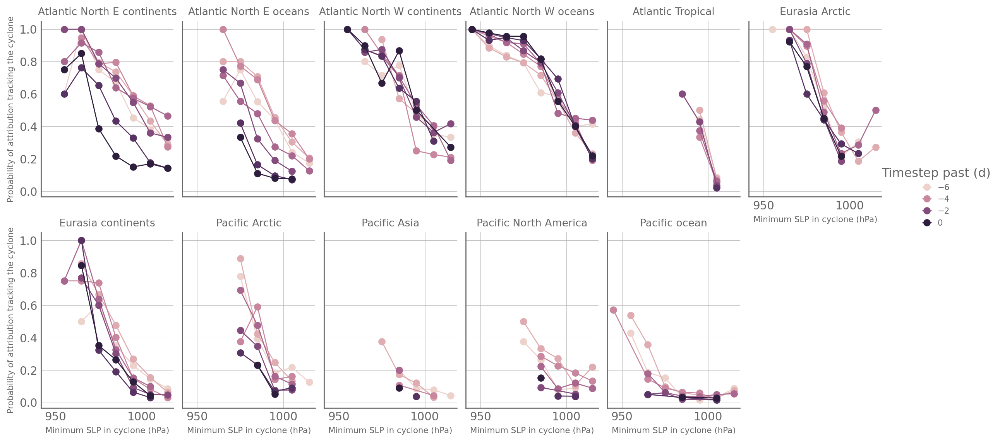

In [208]:
df_ = joined.groupby(['timestep_past','poly_id','important', pd.cut(joined.msl, np.arange(940,1030,10))]).count()
df_ = df_.where(df_>2)
df_ = df_/joined.groupby(['timestep_past','poly_id', pd.cut(joined.msl, np.arange(940,1030,10))]).count()
df_ = df_.x.rename('detection_probability').reset_index().query("important")
df_['msl'] = [k.mid for k in df_.msl]
(so.Plot(df_,x='msl', y='detection_probability', color='timestep_past', )
    .add(so.Line(marker='o'))
    .facet(col='poly_id', wrap=6)
     .theme(plt.style.library["robin"])
    .theme({'axes.grid':True, 'grid.color':'.7', 'grid.linestyle':'-', 'grid.linewidth':.3})
    # .limit(y=(0,1), x=(-6.1,0.1))
    .label(color='Timestep past (d)', x='Minimum SLP in cyclone (hPa)', y='Probability of attribution tracking the cyclone')
    .layout(size=(12,6))
)

/tmp/ipykernel_1350550/2479976283.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_ = joined.groupby(['poly_id','important', pd.cut(joined.msl, np.arange(940,1030,10))]).count()
/tmp/ipykernel_1350550/2479976283.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_ = df_/joined.groupby(['poly_id', pd.cut(joined.msl, np.arange(940,1030,10))]).count()


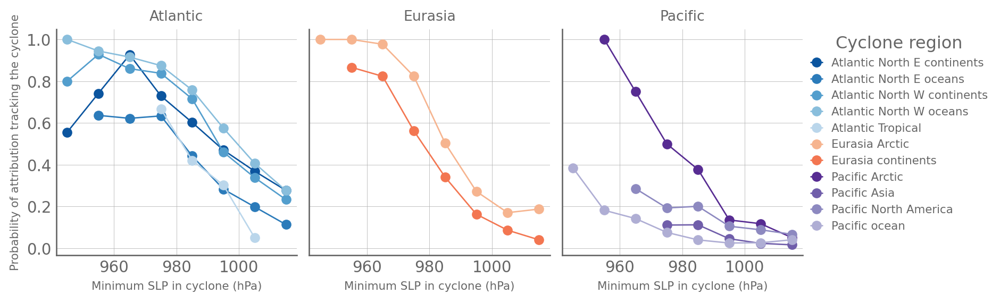

In [215]:
df_ = joined.groupby(['poly_id','important', pd.cut(joined.msl, np.arange(940,1030,10))]).count()
df_ = df_.where(df_>2)

df_ = df_/joined.groupby(['poly_id', pd.cut(joined.msl, np.arange(940,1030,10))]).count()
df_ = df_.x.rename('detection_probability').reset_index().query("important")
df_['msl'] = [k.mid for k in df_.msl]
df_['domain'] = df_.poly_id.str.split(' ', expand=True).iloc[:,0]
(so.Plot(df_,x='msl', y='detection_probability', color= 'poly_id')
    .add(so.Line(marker='o'))
    .facet(col='domain', wrap=6)
     .theme(plt.style.library["robin"])
    .theme({'axes.grid':True, 'grid.color':'.7', 'grid.linestyle':'-', 'grid.linewidth':.3})
    # .limit(y=(0,1), x=(-6.1,0.1))
    .label(color='Cyclone region', x='Minimum SLP in cyclone (hPa)', y='Probability of attribution tracking the cyclone')
    .scale(color=so.Nominal(colors,),
        )
    .layout(size=(8,3))
)

/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/seaborn/_core/properties.py:130: UserWarning: The color list has more values (11) than needed (2), which may not be intended.
  warnings.warn(message, UserWarning)


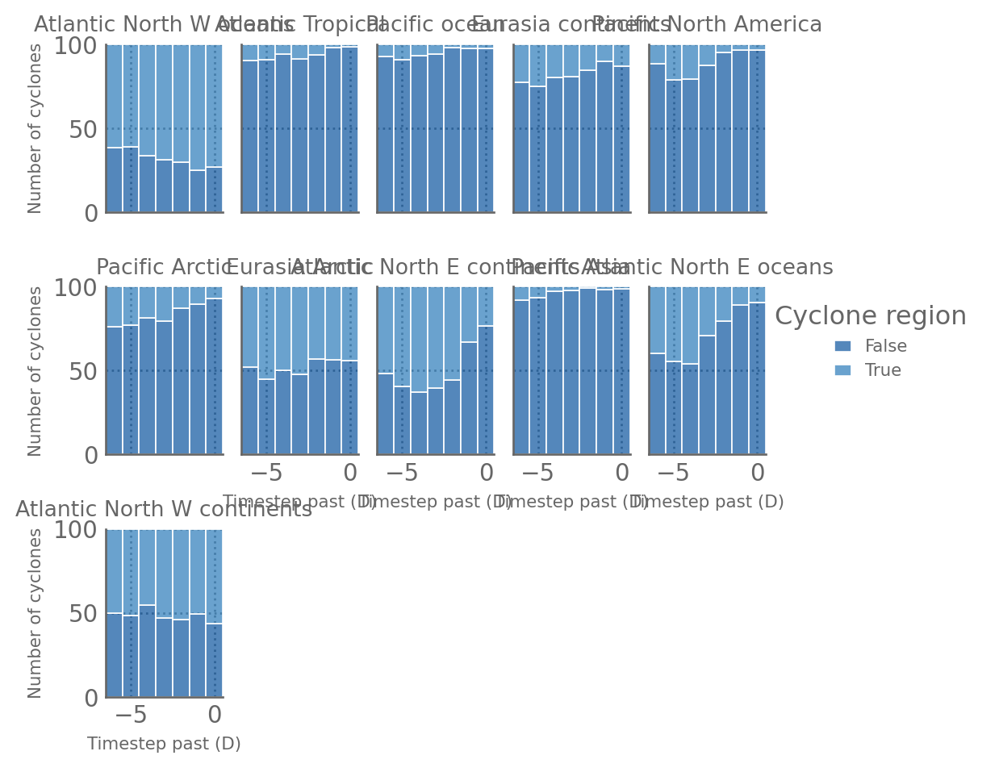

In [ ]:
(so.Plot(joined, x='timestep_past', color='important', y='timestep_past')
 .add(so.Bars(), so.Count(), so.Norm(func="sum", by=["x"],percent=True),so.Stack(), orientation='x')
 .facet(col='poly_id', wrap=5)
 .scale(color=['C3','.4'])
.layout(size=(11,5))
.limit(x=(-6.5,0.5), y=(0,100))
# .share(y=False)
.label(y='Number of cyclones', x='Timestep past (D)', color= 'Cyclone tracked\nby attributions')
 .theme(plt.style.library["robin"])
 .theme({'axes.grid':True, 'grid.color':'.5'})

 
#  .add(so.Text(color="w", halign="right"))

)

In [31]:
count_per_basin_msl = joined.groupby(['important','poly_id',pd.cut(joined.msl, np.arange(920, 1051,10)), 'timestep_past']).count().date

/tmp/ipykernel_815533/3302021094.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  count_per_basin_msl = joined.groupby(['important','poly_id',pd.cut(joined.msl, np.arange(920, 1051,10)), 'timestep_past']).count().date


In [45]:
joined


,date,track_id,n_cyclone,timestep_past,time_of_event,important,lon,lat,x,y,msl,geometry,index_right,poly_id
0,1999-11-18,427319.0,0,-6,1999-11-24,False,-28.459756,86.841952,-1.405339e+05,-2.605745e+05,1005.193883,POINT (-28.45976 86.84195),0.0,Arctic Ocean
1,1999-11-22,427421.0,0,-6,1999-11-28,False,-55.604392,20.072782,-7.132754e+06,-4.880392e+06,1001.793932,POINT (-55.60439 20.07278),3.0,Atlantic Tropics
2,1999-11-24,427617.0,0,-6,1999-11-30,True,168.584731,59.975457,6.581794e+05,3.260219e+06,987.219269,POINT (168.58473 59.97546),8.0,Pacific
3,1999-11-30,427800.0,0,-6,1999-12-06,False,145.676761,56.601811,2.096500e+06,3.071462e+06,996.788876,POINT (145.67676 56.60181),8.0,Pacific
4,1999-12-11,428240.0,0,-6,1999-12-17,False,24.917632,61.068947,1.345281e+06,-2.900713e+06,986.638101,POINT (24.91763 61.06895),4.0,Continents Eurasia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27829,2008-10-18,613943.0,24,-2,2008-10-20,False,-107.469967,48.013836,-4.534622e+06,1.425179e+06,1006.971809,POINT (-107.46997 48.01384),5.0,Continents North America
27830,2011-10-09,676571.0,24,-1,2011-10-10,False,-99.024354,42.958196,-5.324585e+06,8.456516e+05,1014.045207,POINT (-99.02435 42.9582),5.0,Continents North America
27831,2011-10-09,676571.0,24,0,2011-10-09,False,-99.024354,42.958196,-5.324585e+06,8.456516e+05,1014.045207,POINT (-99.02435 42.9582),5.0,Continents North America
27832,2003-06-13,502002.0,25,-6,2003-06-19,True,78.970374,66.957003,2.481985e+06,-4.842088e+05,1003.164440,POINT (78.97037 66.957),4.0,Continents Eurasia


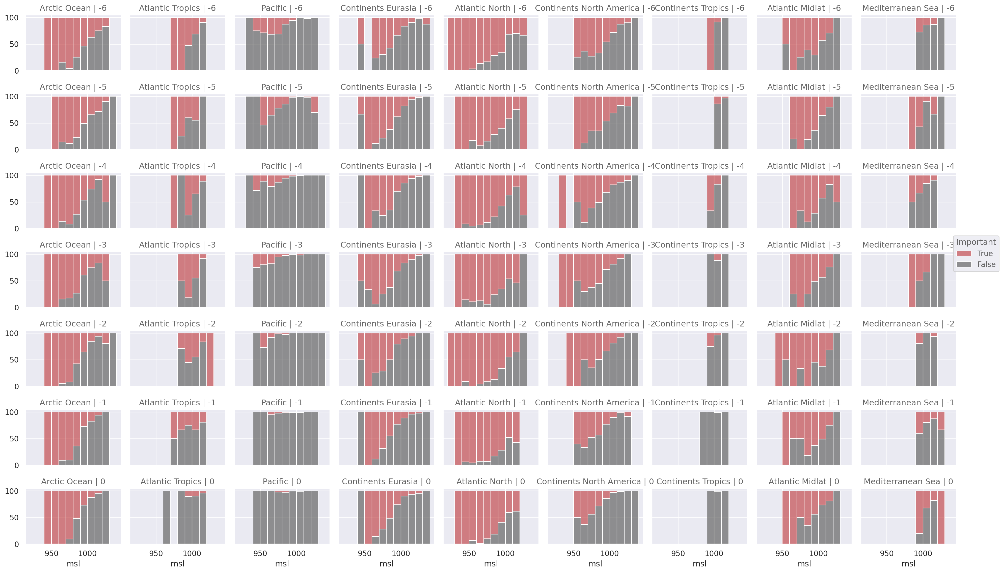

In [114]:
(so.Plot(joined, x='msl', color='important',)
 .add(so.Bars(), so.Hist(stat='percent', bins=np.arange(920,1050,10)),  so.Norm(func="sum", by=["x"],percent=True), so.Stack())
 .scale(color=['C3','.4'])
 .facet(col='poly_id',row='timestep_past')
 .layout(size=(20,12))
)


AttributeError: Rectangle.set() got an unexpected keyword argument 'multiple'

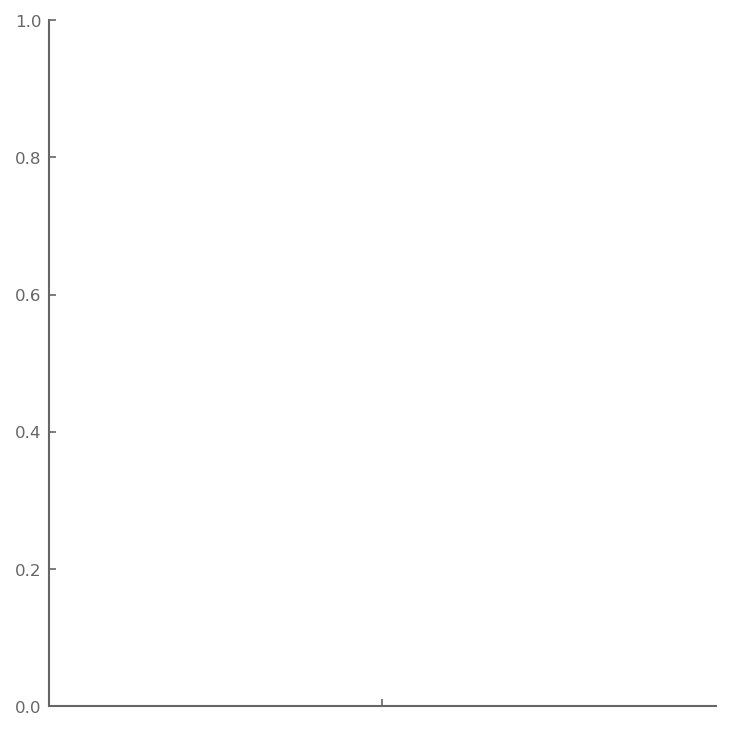

In [43]:
df_ = count_per_basin_msl.rename('count').reset_index()
sns.catplot(df_, y='count', kind='bar', hue='important',multiple='stack')

In [125]:
track_id_.dropna('n_cyclone').values.astype(int)

array([452248, 452360, 452418, 452427, 452452, 452460, 452474, 452484,
       452520, 452521, 452541, 452550, 452551, 452555, 452603, 452616,
       452617])

452248.0     True
452360.0    False
452418.0     True
452427.0    False
452452.0    False
452460.0     True
452474.0    False
452484.0     True
452520.0     True
452521.0    False
452541.0    False
452550.0    False
452551.0     True
452555.0     True
452603.0     True
452616.0     True
452617.0     True
NaN          True
NaN          True
NaN          True
NaN          True
NaN          True
NaN          True
NaN          True
NaN          True
NaN          True
NaN          True
NaN          True
NaN          True
NaN          True
NaN          True
NaN          True
NaN          True
dtype: bool

In [112]:
cyclones_

,day,lon,lat,x,y,msl,date,size
track_id,,,,,,,,
452248,2001-02-11,20.115948,87.632937,1.904877e+05,-9.627549e+04,982.078124,2001-02-11,67.921876
452360,2001-02-11,-175.067868,63.176751,-2.519080e+05,2.947948e+06,966.011959,2001-02-11,83.988041
452418,2001-02-11,-21.200120,58.075918,-1.282170e+06,-3.303002e+06,976.621982,2001-02-11,73.378018
452427,2001-02-11,44.566221,70.103124,1.529044e+06,-1.531826e+06,996.697646,2001-02-11,53.302354
452452,2001-02-11,-84.792105,68.986503,-2.289378e+06,-2.143384e+05,998.863317,2001-02-11,51.136683
452460,2001-02-11,-58.466228,51.632852,-3.673199e+06,-2.250958e+06,966.540636,2001-02-11,83.459364
452484,2001-02-11,160.466087,48.132143,1.590255e+06,4.457297e+06,974.669327,2001-02-11,75.330673
452520,2001-02-11,18.539040,33.708118,2.105167e+06,-6.277830e+06,1011.784701,2001-02-11,38.215299
452551,2001-02-11,-7.091439,63.912117,-3.596230e+05,-2.850807e+06,978.317263,2001-02-11,71.682737


In [ ]:
pd.Series(important_cyclones_

<xarray.DataArray 'Distance_to_cyclone' (n_cyclone: 33)> Size: 33B
array([ True, False,  True, False, False,  True, False,  True,  True,
       False, False, False,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True])
Coordinates:
  * n_cyclone      (n_cyclone) int64 264B 0 1 2 3 4 5 6 ... 26 27 28 29 30 31 32
    timestep_past  int64 8B 0
    time_of_event  datetime64[ns] 8B 2001-02-11

In [79]:
1050 - cyclones_.msl

day
2001-02-05    66.183090
2001-02-05    43.760379
2001-02-05    43.205662
2001-02-05    89.334995
2001-02-05    84.601891
2001-02-05    35.478867
2001-02-05    53.867290
2001-02-05    42.125248
2001-02-05    45.542845
2001-02-05    90.407285
2001-02-05    53.186753
2001-02-05    32.987500
Name: msl, dtype: float64

In [53]:
cyclones_

,day,track_id,lon,lat,x,y,msl,date
day,,,,,,,,
2001-02-11,2001-02-11,452248,20.115948,87.632937,1.904877e+05,-9.627549e+04,982.078124,2001-02-11
2001-02-11,2001-02-11,452360,-175.067868,63.176751,-2.519080e+05,2.947948e+06,966.011959,2001-02-11
2001-02-11,2001-02-11,452418,-21.200120,58.075918,-1.282170e+06,-3.303002e+06,976.621982,2001-02-11
2001-02-11,2001-02-11,452427,44.566221,70.103124,1.529044e+06,-1.531826e+06,996.697646,2001-02-11
2001-02-11,2001-02-11,452452,-84.792105,68.986503,-2.289378e+06,-2.143384e+05,998.863317,2001-02-11
2001-02-11,2001-02-11,452460,-58.466228,51.632852,-3.673199e+06,-2.250958e+06,966.540636,2001-02-11
2001-02-11,2001-02-11,452474,178.269074,37.946161,1.824567e+05,6.042921e+06,1019.978887,2001-02-11
2001-02-11,2001-02-11,452484,160.466087,48.132143,1.590255e+06,4.457297e+06,974.669327,2001-02-11
2001-02-11,2001-02-11,452520,18.539040,33.708118,2.105167e+06,-6.277830e+06,1011.784701,2001-02-11


In [31]:
grid_stack = grid.stack(space=['y','x'])
def get_distance_per_day(day):
    day_str = day.strftime('%Y-%m-%d')
    cyclones_day = daily_cycs.loc[day_str].to_xarray().rename(day='n_cyclone')
    cyclones_day = cyclones_day.assign_coords(n_cyclone=np.arange(cyclones_day.n_cyclone.size))

    distance = np.sqrt((grid_stack.x - cyclones_day.x)**2 + (grid_stack.y - cyclones_day.y)**2).unstack('space')
    distance = distance.assign_coords(track_id=cyclones_day.track_id, lon=cyclones_day.lon, lat=cyclones_day.lat)
    # per_quadrant_distance = distance.groupby(cyclones_day.poly_id).min()
    return distance

test = get_distance_per_day(pd.to_datetime('2005-11-10'))


def get_distance_per_day_of_event(day):
    all_distances = []
    day0 = day 
    for k in range(7):
        distance_day = get_distance_per_day(day0 - np.timedelta64(k, 'D'))
        all_distances.append(distance_day.assign_coords(timestep_past=-k))
    return xr.concat(all_distances[::-1], dim='timestep_past').assign_coords(time_of_event=day)
    
d = get_distance_per_day_of_event(pd.to_datetime('2001-02-11'))

/tmp/ipykernel_749408/2713481226.py:21: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these coordinates (dimensions): 'n_cyclone' ('n_cyclone',) The recommendation is to set join explicitly for this case.
  return xr.concat(all_distances[::-1], dim='timestep_past').assign_coords(time_of_event=day)
/tmp/ipykernel_749408/2713481226.py:21: FutureWarning: In a future version of xarray the default value for coords will change from coords='different' to coords='minimal'. This is likely to lead to different results when multiple datasets have matching variables with overlapping values. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set coords explicitly.
  return xr.concat(all_distances[::-1], dim='timestep_past').assi

In [35]:
d

<xarray.DataArray (timestep_past: 7, n_cyclone: 18, y: 128, x: 128)> Size: 17MB
array([[[[11841353.0266884 , 11739659.94259334, 11638267.53832795, ...,
           7416014.53669522,  7487286.10953258,  7559716.70265651],
         [11782892.61089161, 11680690.57654007, 11578781.80426765, ...,
           7322307.58611083,  7394482.40670981,  7467813.16059563],
         [11725321.17759873, 11622612.90686879, 11520190.38509697, ...,
           7229300.57638063,  7302394.71003739,  7376640.95910913],
         ...,
         [13495003.17219904, 13405860.08739201, 13317159.62240813, ...,
           9843512.62118733,  9897318.95015003,  9952225.1652293 ],
         [13571817.67514065, 13483182.45342427, 13394994.02009183, ...,
           9948560.95689585, 10001802.17713773, 10056137.93307458],
         [13649213.93552603, 13561084.58504798, 13473406.05967153, ...,
          10053888.36040913, 10106574.73336516, 10160350.19964958]],

        [[14064384.26741615, 13985765.0420871 , 13907696.59089125, ...,
          11691007.25597329, 11744555.21774238, 11799033.24543494],
         [13977331.73962604, 13898220.08569732, 13819657.09423728, ...,
          11586136.04258274, 11640166.45072631, 11695130.75022651],
         [13890730.07291093, 13811122.36385569, 13732061.08350882, ...,
          11481512.43504745, 11536032.87094523, 11591490.95948438],
...
           7999415.03166199,  8070955.5517771 ,  8143567.26807381],
         [11823201.47783511, 11725082.86721281, 11627326.64723204, ...,
           8093537.38166712,  8164253.18191596,  8236042.39603624],
         [11888249.71751709, 11790672.43220548, 11693464.54742969, ...,
           8188268.16298818,  8258172.81116033,  8329152.56853117]],

        [[              nan,               nan,               nan, ...,
                        nan,               nan,               nan],
         [              nan,               nan,               nan, ...,
                        nan,               nan,               nan],
         [              nan,               nan,               nan, ...,
                        nan,               nan,               nan],
         ...,
         [              nan,               nan,               nan, ...,
                        nan,               nan,               nan],
         [              nan,               nan,               nan, ...,
                        nan,               nan,               nan],
         [              nan,               nan,               nan, ...,
                        nan,               nan,               nan]]]],
      shape=(7, 18, 128, 128))
Coordinates:
  * y              (y) float64 1kB -1e+07 -9.882e+06 ... 4.824e+06 4.941e+06
  * x              (x) float64 1kB -1e+07 -9.882e+06 ... 4.824e+06 4.941e+06
  * n_cyclone      (n_cyclone) int64 144B 0 1 2 3 4 5 6 ... 11 12 13 14 15 16 17
    time_of_event  datetime64[ns] 8B 2001-02-11
    var_name       <U4 16B 'x850'
  * timestep_past  (timestep_past) int64 56B -6 -5 -4 -3 -2 -1 0
    lat            (timestep_past, n_cyclone) float64 1kB 53.54 83.4 ... nan
    lon            (timestep_past, n_cyclone) float64 1kB 3.56 -127.4 ... nan
    track_id       (timestep_past, n_cyclone) float64 1kB 4.519e+05 ... nan

In [4]:
from cartopy.crs import NorthPolarStereo
import pandas as pd

# Define the projection
proj = NorthPolarStereo(central_longitude=0, true_scale_latitude=70)

# Convert lon/lat to x/y
xy = proj.transform_points(ccrs.PlateCarree(), cycs['lon'].values, cycs['lat'].values)
cycs['x'] = xy[:, 0]
cycs['y'] = xy[:, 1]
daily_cycs = cycs.groupby([cycs.date.dt.date.rename('day'), 'track_id'])[['lon','lat','x','y','msl']].agg(dict(lon='mean', lat='mean', x='mean', y='mean', msl='min')).reset_index()
daily_cycs['date'] = pd.to_datetime(daily_cycs.day)
daily_cycs.index = pd.to_datetime(daily_cycs.day)
daily_cycs['msl'] = daily_cycs['msl'] / 100  # Convert to hPa

In [7]:
from shapely.ops import unary_union


In [ ]:
cyclones_gdf = gpd.GeoDataFrame(
    daily_cycs,
    geometry=gpd.points_from_xy(daily_cycs["lon"], daily_cycs["lat"]),
    crs="EPSG:4326"  # adjust if your cyclones are in another CRS
)

if polygons_masks.crs is None:
    polygons_masks = polygons_masks.set_crs("EPSG:4326")  # if appropriate
cyclones_gdf = cyclones_gdf.to_crs(polygons_masks.crs)

In [ ]:
cyclones_gdf = gpd.GeoDataFrame(
    daily_cycs,
    geometry=gpd.points_from_xy(daily_cycs["lon"], daily_cycs["lat"]),
    crs="EPSG:4326"  # adjust if your cyclones are in another CRS
)

if polygons_masks.crs is None:
    polygons_masks = polygons_masks.set_crs("EPSG:4326")  # if appropriate
cyclones_gdf = cyclones_gdf.to_crs(polygons_masks.crs)

joined = gpd.sjoin(cyclones_gdf, polygons_masks.reset_index()[["poly_id", "geometry"]],
                   how="left", predicate="within") 
unmatched = joined[joined["poly_id"].isna()].drop(columns=["index_right"])

if not unmatched.empty:
    # Optional: project to a metric CRS for meaningful distances (meters)
    # Example for Norway: EPSG:5972 (ETRS89 / TM35FIN(N,E)) or choose a local UTM zone
    metric_crs = "EPSG:3857"
    polygons_m = polygons_masks.to_crs(metric_crs).reset_index()
    unmatched_m = unmatched.to_crs(metric_crs)

    nearest = gpd.sjoin_nearest(
        unmatched_m,
        polygons_m[["poly_id", "geometry"]],
        how="left",
        distance_col="dist_m"  # distance in CRS units
    ).to_crs(polygons_masks.crs)

    # Optionally filter by a maximum distance (e.g., 50 km)
    max_dist_m = 50_000
    nearest.loc[nearest["dist_m"] > max_dist_m, "poly_id"] = None

    # merge back
    joined.loc[unmatched.index, ["poly_id"]] = nearest.set_index(unmatched.index)["poly_id"]
joined['day'] = pd.to_datetime(joined.day)


ValueError: cannot insert day, already exists

In [ ]:
test

<xarray.DataArray (day: 17, y: 128, x: 128)> Size: 2MB
array([[[13684187.03705208, 13606594.73520092, 13529580.45808777, ...,
         11708779.81298658, 11765975.42681575, 11824064.97109863],
        [13596229.34965872, 13518132.1916711 , 13440611.0365328 , ...,
         11605860.69072427, 11663561.00888271, 11722158.08220733],
        [13508723.54639467, 13430117.54512562, 13352085.39366656, ...,
         11503223.96969195, 11561436.53411311, 11620548.58552965],
        ...,
        [10092054.04139581,  9986591.01983388,  9881403.10286447, ...,
          7189443.97143696,  7282222.02722914,  7375709.61672102],
        [10144468.44592693, 10039556.03965536,  9934928.91556116, ...,
          7262836.21558306,  7354688.49984926,  7447266.45327966],
        [10197970.72888819, 10093614.4373675 ,  9989553.51825629, ...,
          7337380.78821306,  7428311.37383646,  7519983.01613759]],

       [[13495141.48315704, 13403028.02224029, 13311316.92735135, ...,
          9324230.79611909,  9376769.38323028,  9430483.0127716 ],
        [13422525.08982457, 13329909.83846112, 13237692.18847963, ...,
          9218818.58351925,  9271954.49745247,  9326271.81625744],
        [13350550.45997782, 13257432.4097446 , 13164707.07134718, ...,
          9113705.82547427,  9167451.00888316,  9222383.8451976 ],
...
          7007413.59042243,  7062446.98314472,  7118999.31262271],
        [13106666.22941751, 13003799.60624546, 12901185.62033449, ...,
          7112006.77560098,  7166236.98594229,  7221976.62430998],
        [13163934.68759285, 13061519.09271071, 12959362.14557577, ...,
          7217001.95275373,  7270449.04724214,  7325395.76896271]],

       [[15292950.9956584 , 15234676.45753569, 15177090.13733774, ...,
         15034437.0829361 , 15090245.94310522, 15146762.97124051],
        [15191059.22490596, 15132392.30871256, 15074415.25419363, ...,
         14930781.24612893, 14986976.10735384, 15043881.10581621],
        [15089396.68291914, 15030332.95920865, 14971960.69777624, ...,
         14827334.23443493, 14883919.6693037 , 14941217.17283517],
        ...,
        [ 7755546.3702965 ,  7639994.50994579,  7524507.58409374, ...,
          7232457.93261005,  7347766.46128696,  7463147.98547855],
        [ 7778344.12540787,  7663136.03842772,  7548003.19386075, ...,
          7256899.1710249 ,  7371825.40494967,  7486836.15986088],
        [ 7802849.27610515,  7688008.41803632,  7573253.70675508, ...,
          7283159.00353476,  7397677.2904344 ,  7512292.27180013]]],
      shape=(17, 128, 128))
Coordinates:
  * y              (y) float64 1kB -1e+07 -9.882e+06 ... 4.824e+06 4.941e+06
  * x              (x) float64 1kB -1e+07 -9.882e+06 ... 4.824e+06 4.941e+06
    time_of_event  datetime64[ns] 8B 1999-11-24
    var_name       <U4 16B 'x850'
    timestep_past  int64 8B -6
    lat            (day) float64 136B 81.01 74.06 62.55 ... 37.0 70.68 53.93
    lon            (day) float64 136B -105.3 19.89 -32.8 ... -179.1 44.28 -143.9
  * day            (day) object 136B 2005-11-10 2005-11-10 ... 2005-11-10
    track_id       (day) int32 68B 552122 552177 552202 ... 552446 552458 552470

In [ ]:
grid_stack = grid.stack(space=['y','x'])
def get_distance_per_day(day):
    day_str = day.strftime('%Y-%m-%d')
    cyclones_day = daily_cycs.loc[day_str].to_xarray().rename(day='n_cyclone')
    cyclones_day = cyclones_day.assign_coords(n_cyclone=np.arange(cyclones_day.n_cyclone.size))

    distance = np.sqrt((grid_stack.x - cyclones_day.x)**2 + (grid_stack.y - cyclones_day.y)**2).unstack('space')
    distance = distance.assign_coords(track_id=cyclones_day.track_id, lon=cyclones_day.lon, lat=cyclones_day.lat)
    # per_quadrant_distance = distance.groupby(cyclones_day.poly_id).min()
    return distance

test = get_distance_per_day(pd.to_datetime('2005-11-10'))


def get_distance_per_day_of_event(day):
    all_distances = []
    day0 = day 
    for k in range(7):
        distance_day = get_distance_per_day(day0 - np.timedelta64(k, 'D'))
        all_distances.append(distance_day.assign_coords(timestep_past=-k))
    return xr.concat(all_distances[::-1], dim='timestep_past').assign_coords(time_of_event=day)
    
get_distance_per_day_of_event(pd.to_datetime('2005-11-10'))

/tmp/ipykernel_72715/3698923879.py:21: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these coordinates (dimensions): 'n_cyclone' ('n_cyclone',) The recommendation is to set join explicitly for this case.
  return xr.concat(all_distances[::-1], dim='timestep_past').assign_coords(time_of_event=day)
/tmp/ipykernel_72715/3698923879.py:21: FutureWarning: In a future version of xarray the default value for coords will change from coords='different' to coords='minimal'. This is likely to lead to different results when multiple datasets have matching variables with overlapping values. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set coords explicitly.
  return xr.concat(all_distances[::-1], dim='timestep_past').assign

<xarray.DataArray (timestep_past: 7, n_cyclone: 24, y: 128, x: 128)> Size: 22MB
array([[[[11087000.96578215, 11006387.03189518, 10926445.08691577, ...,
          10715647.31897066, 10793714.38188151, 10872493.94166804],
         [11001924.68747923, 10920682.75839844, 10840108.79332382, ...,
          10627598.68823968, 10706307.79360216, 10785725.7950181 ],
         [10917453.2242449 , 10835577.97185693, 10754366.40280155, ...,
          10540127.70097612, 10619485.14034258, 10699547.6072556 ],
         ...,
         [10126648.71027954, 10038325.51683906,  9950609.32423426, ...,
           9718668.69230118,  9804677.14123151,  9891337.02781176],
         [10204409.7393026 , 10116765.45187194, 10029735.28811729, ...,
           9799667.60542838,  9884971.31356258,  9970933.36774083],
         [10282928.75666465, 10195959.43966318, 10109611.05269497, ...,
           9881403.28414692,  9966007.40301863, 10051276.43192617]],

        [[16691960.66780096, 16601478.33312068, 16511338.41987488, ...,
          10797958.6781664 , 10818671.41277093, 10840621.39918763],
         [16617220.5936839 , 16526329.0590746 , 16435777.00443075, ...,
          10682058.83428505, 10702995.86383389, 10725182.59258382],
         [16542979.51530468, 16451677.82183482, 16360712.59829511, ...,
          10566197.60953605, 10587363.76280155, 10609792.29904624],
...
                        nan,               nan,               nan],
         [              nan,               nan,               nan, ...,
                        nan,               nan,               nan],
         [              nan,               nan,               nan, ...,
                        nan,               nan,               nan]],

        [[              nan,               nan,               nan, ...,
                        nan,               nan,               nan],
         [              nan,               nan,               nan, ...,
                        nan,               nan,               nan],
         [              nan,               nan,               nan, ...,
                        nan,               nan,               nan],
         ...,
         [              nan,               nan,               nan, ...,
                        nan,               nan,               nan],
         [              nan,               nan,               nan, ...,
                        nan,               nan,               nan],
         [              nan,               nan,               nan, ...,
                        nan,               nan,               nan]]]],
      shape=(7, 24, 128, 128))
Coordinates:
  * y              (y) float64 1kB -1e+07 -9.882e+06 ... 4.824e+06 4.941e+06
  * x              (x) float64 1kB -1e+07 -9.882e+06 ... 4.824e+06 4.941e+06
  * n_cyclone      (n_cyclone) int64 192B 0 1 2 3 4 5 6 ... 17 18 19 20 21 22 23
    time_of_event  datetime64[ns] 8B 2005-11-10
    var_name       <U4 16B 'x850'
  * timestep_past  (timestep_past) int64 56B -6 -5 -4 -3 -2 -1 0
    lat            (timestep_past, n_cyclone) float64 1kB 62.17 63.4 ... nan nan
    lon            (timestep_past, n_cyclone) float64 1kB -50.52 102.6 ... nan
    track_id       (timestep_past, n_cyclone) float64 1kB 5.519e+05 ... nan

In [274]:
grid_stack = grid.stack(space=['y','x'])

def get_distance_per_day(day):
    day_str = day.strftime('%Y-%m-%d')
    cyclones_day = daily_cycs.loc[day_str].to_xarray().rename(day='n_cyclone')
    cyclones_day = cyclones_day.assign_coords(n_cyclone=np.arange(cyclones_day.n_cyclone.size))
    distance = np.sqrt((grid_stack.x - cyclones_day.x)**2 + (grid_stack.y - cyclones_day.y)**2).unstack('space')
    distance = distance.assign_coords(track_id=cyclones_day.track_id, lon=cyclones_day.lon, lat=cyclones_day.lat)
    # per_quadrant_distance = distance.groupby(cyclones_day.poly_id).min()
    return distance

def get_distance_per_day_of_event(day):
    all_distances = []
    day0 = day 
    for k in range(7):
        distance_day = get_distance_per_day(day0 - np.timedelta64(k, 'D'))
        all_distances.append(distance_day.assign_coords(timestep_past=-k))
    return xr.concat(all_distances[::-1], dim='timestep_past').assign_coords(time_of_event=day)
    

list_times = pd.to_datetime([time for time in ds_attrs.time_of_event.values if time in daily_cycs.date.unique()])
bag = db.from_sequence(list_times, npartitions=100)
results = bag.map(get_distance_per_day_of_event)
all_distances = xr.concat(results, dim='time_of_event')/1000
ds_attrs['distance_to_cyclones'] = all_distances

/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/distributed/client.py:3363: UserWarning: Sending large graph of size 21.02 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/tmp/ipykernel_72715/3097462341.py:18: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these coordinates (dimensions): 'n_cyclone' ('n_cyclone',) The recommendation is to set join explicitly for this case.
/tmp/ipykernel_72715/3097462341.py:18: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to j

In [663]:

ds_ = attributions_normed_lrp.sel(time_of_event=time).rolling(x=10,y=10, center=True).mean()
# ds_ = ds_/ds_.max(['x','y'])

/Data/gfi/users/rogui7909/virtual_envs/ml-robin/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:509: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  return super().draw(renderer=renderer, **kwargs)


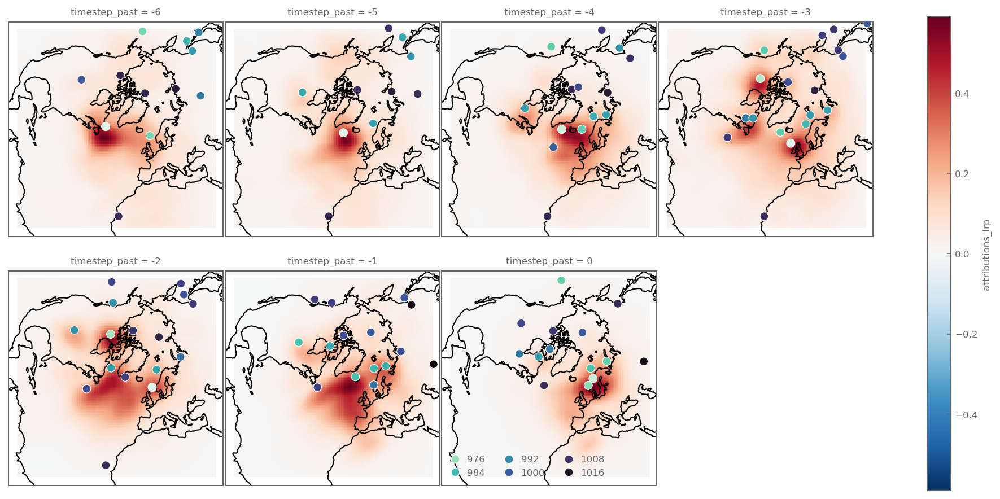

In [661]:
time = ds_attrs.time_of_event.isel(time_of_event=100).values

ds_ = attributions_normed_lrp.sel(time_of_event=time).rolling(x=10,y=10, center=True).mean()
# ds_ = ds_/ds_.max(['x','y'])
plot = ds_.plot(col='timestep_past', subplot_kws={'projection':ccrs.NorthPolarStereo(0,70)}, transform=ccrs.NorthPolarStereo(0,70), col_wrap=4)
for k,ax in enumerate(plot.axs.flat):
    # cyclones_ = daily_df_cycs2.loc[time +(k-6)*pd.Timedelta('1D')]
    cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')]
    cyclones_ = cyclones_.query("lat>0 & y<4941176 & x <4941176")
    sns.scatterplot(cyclones_, x='x',y='y', ax=ax, transform=ccrs.NorthPolarStereo(0,70), hue='msl', s=50, zorder=100, hue_norm=(970,1020), palette='mako_r', edgecolor='1')
    if k<=5:
        ax.legend().remove()
    else:
        ax.legend(ncols=3)
    ax.coastlines()


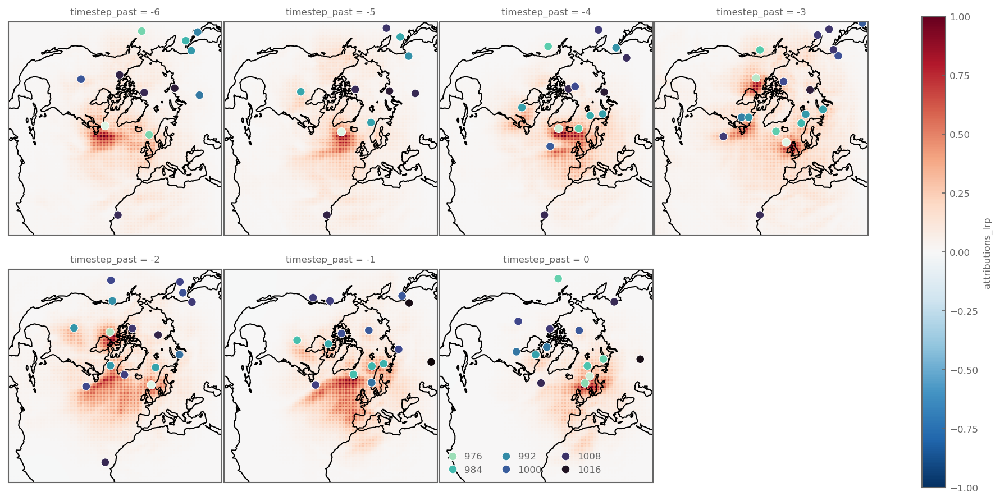

In [658]:
time = ds_attrs.time_of_event.isel(time_of_event=100).values

ds_ = ds_attrs.attributions_lrp.sum('var_name').sel(time_of_event=time)
ds_ = ds_/ds_.max(['x','y'])
plot = ds_.plot(col='timestep_past', subplot_kws={'projection':ccrs.NorthPolarStereo(0,70)}, transform=ccrs.NorthPolarStereo(0,70), col_wrap=4)
for k,ax in enumerate(plot.axs.flat):
    # cyclones_ = daily_df_cycs2.loc[time +(k-6)*pd.Timedelta('1D')]
    cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')]
    cyclones_ = cyclones_.query("lat>0 & y<4941176 & x <4941176")
    sns.scatterplot(cyclones_, x='x',y='y', ax=ax, transform=ccrs.NorthPolarStereo(0,70), hue='msl', s=50, zorder=100, hue_norm=(970,1020), palette='mako_r', edgecolor='1')
    if k<=5:
        ax.legend().remove()
    else:
        ax.legend(ncols=3)
    ax.coastlines()


In [ ]:
attributions_normed_lrp = (ds_attrs.attributions_lrp.sum('var_name')/ds_attrs.attributions_lrp.sum('var_name').max(['x','y']))
attributions_normed_ig = (ds_attrs.attributions_ig.sum('var_name')/ds_attrs.attributions_ig.sum('var_name').max(['x','y']))

In [656]:
import flox.xarray

attributions_per_distance = flox.xarray.xarray_reduce(
    # variable qu'on veut aggréger 
    attributions_normed_lrp,#/ds_attrs.attributions_ig.sum(['var_name','x','y']),
    # Variables selon lesquelles on veut grouer : ici il y a deux variables mais on peut en rajouter autant qu'on veut
    ds_attrs.distance_to_cyclones,#.min('poly_id'),
    # ds_attrs.poly_id,
    ds_attrs.n_cyclone,
    ds_attrs.timestep_past,
    ds_attrs.time_of_event,
    # ds_attrs.var_name,

    # Fonction à appliquer à chacun des groupes pour aggrégation
    func="mean",
    # Groupes attendus pour chacune des variables : soit on met les bins, soit on met None quand on veut grouper pour toutes les valeurs possibles
    expected_groups=(ds_attrs.distance_to_cyclones.quantile(np.arange(0,1.0001,.01)),
                    # [0,1_000_000,2_000_000,5_000_000,],
                    # np.arange(0,1.1,.02), 
                     None,
                     None,
                     None,
                    #  None,
                     ),
    # Déterminer si les groupes données correspondent à des bins ou non
    isbin=[True, False, False, False],#,False,False],
    # Méthode de calcul parallèl : flox propose plein de méthodes différentes pour optimiser les calculs en fonction de la forme des données
    method="map-reduce",
)
attributions_per_distance['distance_to_cyclones_bins'] = [k.mid for k in attributions_per_distance.distance_to_cyclones_bins.values]
attributions_per_distance = attributions_per_distance.rename(distance_to_cyclones_bins='Distance_to_cyclone')
important_cyclones = attributions_per_distance.sum('var_name').idxmax('Distance_to_cyclone')<=1500

ValueError: 'var_name' not found in array dimensions ('Distance_to_cyclone', 'n_cyclone', 'timestep_past', 'time_of_event')

In [344]:
important_cyclones =( attributions_per_distance.sum('var_name').idxmax('Distance_to_cyclone')<=1500) &( attributions_per_distance.sum('var_name').max('Distance_to_cyclone')>50)

In [365]:
important_cyclones.sum('n_cyclone').apply(lambda x:np.sort(x))

AttributeError: 'DataArray' object has no attribute 'apply'

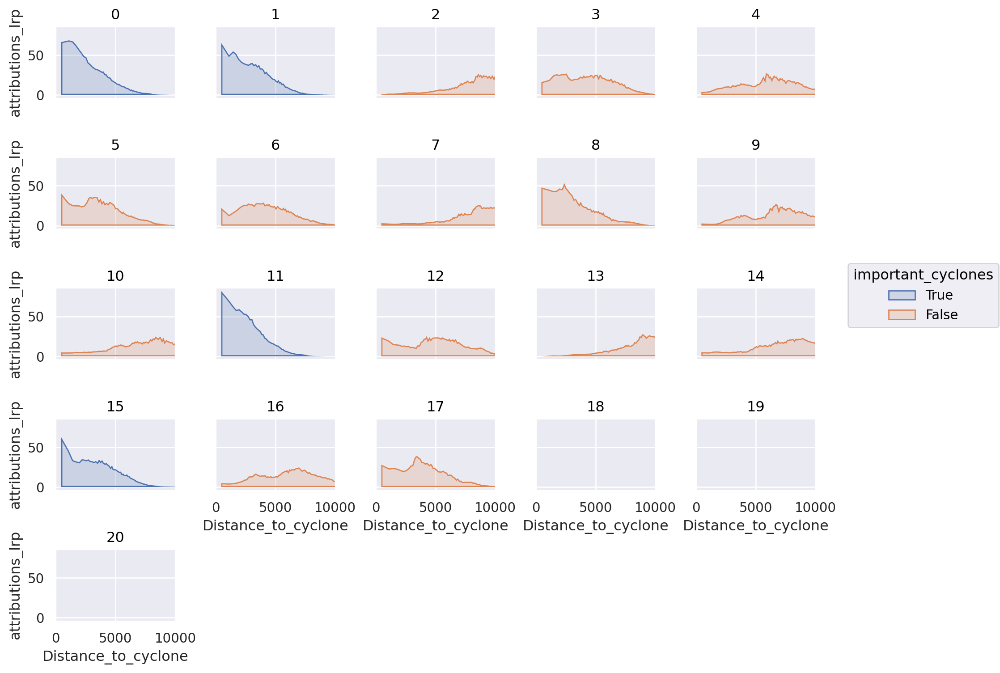

In [345]:
df__ = xr.Dataset(dict(attributions_lrp= attributions_per_distance, important_cyclones=important_cyclones)).sel(time_of_event=time).sel(timestep_past=-1).dropna('n_cyclone', how='all').sum('var_name').to_dataframe().reset_index()

(so.Plot(df__, x='Distance_to_cyclone', y='attributions_lrp', color='important_cyclones')
 .add(so.Area())
 .facet(col='n_cyclone', wrap=5)
 .limit(x=(0,10000))
 .layout(size=(10,8))       

)

In [ ]:
distance_to_important_cyclones = ds_attrs.distance_to_cyclones.where(important_cyclones).min('n_cyclone')
distance_to_all_cyclones = ds_attrs.distance_to_cyclones.min('n_cyclone')


In [522]:
import flox.xarray


attributions_per_important_distance_lrp = flox.xarray.xarray_reduce(
    # variable qu'on veut aggréger 
    attributions_normed_lrp,#/ds_attrs.attributions_ig.sum(['var_name','x','y']),
    # Variables selon lesquelles on veut grouer : ici il y a deux variables mais on peut en rajouter autant qu'on veut
    ds_attrs.distance_to_cyclones.where(important_cyclones).min('n_cyclone'),#.min('poly_id'),
    # ds_attrs.poly_id,
    # ds_attrs.n_cyclone,
    ds_attrs.timestep_past,
    ds_attrs.time_of_event,
    # ds_attrs.var_name,

    # Fonction à appliquer à chacun des groupes pour aggrégation
    func="mean",
    # Groupes attendus pour chacune des variables : soit on met les bins, soit on met None quand on veut grouper pour toutes les valeurs possibles
    expected_groups=(np.arange(0,10001,500),
                    # [0,1_000_000,2_000_000,5_000_000,],
                    # np.arange(0,1.1,.02), 
                     None,
                    #  None,
                     None,
                    #  None,
                     ),
    # Déterminer si les groupes données correspondent à des bins ou non
    isbin=[True, False, False, False],#,False,False],
    # Méthode de calcul parallèl : flox propose plein de méthodes différentes pour optimiser les calculs en fonction de la forme des données
    method="map-reduce",
)
# attributions_per_important_distance_lrp['distance_to_cyclones_bins'] = [k.mid for k in attributions_per_important_distance_lrp.distance_to_cyclones_bins.values]
attributions_per_important_distance_lrp = attributions_per_important_distance_lrp.rename(distance_to_cyclones_bins='Distance_to_cyclone')
# important_cyclones = attributions_per_important_distance_lrp.sum('var_name').idxmax('Distance_to_cyclone')<=1500

In [527]:
import flox.xarray

attributions_per_all_distance_lrp = flox.xarray.xarray_reduce(
    # variable qu'on veut aggréger 
    attributions_normed_lrp,#/ds_attrs.attributions_ig.sum(['var_name','x','y']),
    # Variables selon lesquelles on veut grouer : ici il y a deux variables mais on peut en rajouter autant qu'on veut
    ds_attrs.distance_to_cyclones.min('n_cyclone'),#.min('poly_id'),
    # ds_attrs.poly_id,
    # ds_attrs.n_cyclone,
    ds_attrs.timestep_past,
    ds_attrs.time_of_event,
    # ds_attrs.var_name,

    # Fonction à appliquer à chacun des groupes pour aggrégation
    func="mean",
    # Groupes attendus pour chacune des variables : soit on met les bins, soit on met None quand on veut grouper pour toutes les valeurs possibles
    expected_groups=(#ds_attrs.distance_to_cyclones.quantile(np.arange(0,1.0001,.05)),
                    np.arange(0,10001,500),
                    # [0,1_000_000,2_000_000,5_000_000,],
                    # np.arange(0,1.1,.02), 
                     None,
                    #  None,
                     None,
                    #  None,
                     ),
    # Déterminer si les groupes données correspondent à des bins ou non
    isbin=[True, False, False, False],#,False,False],
    # Méthode de calcul parallèl : flox propose plein de méthodes différentes pour optimiser les calculs en fonction de la forme des données
    method="map-reduce",
)
# attributions_per_all_distance['distance_to_cyclones_bins'] = [k.mid for k in attributions_per_all_distance.distance_to_cyclones_bins.values]
attributions_per_all_distance_lrp = attributions_per_all_distance_lrp.rename(distance_to_cyclones_bins='Distance_to_cyclone')
# important_cyclones = attributions_per_all_distance.sum('var_name').idxmax('Distance_to_cyclone')<=1500

In [523]:
import flox.xarray


attributions_per_important_distance_ig = flox.xarray.xarray_reduce(
    # variable qu'on veut aggréger 
    attributions_normed_ig,#/ds_attrs.attributions_ig.sum(['var_name','x','y']),
    # Variables selon lesquelles on veut grouer : ici il y a deux variables mais on peut en rajouter autant qu'on veut
    ds_attrs.distance_to_cyclones.where(important_cyclones).min('n_cyclone'),#.min('poly_id'),
    # ds_attrs.poly_id,
    # ds_attrs.n_cyclone,
    ds_attrs.timestep_past,
    ds_attrs.time_of_event,
    # ds_attrs.var_name,

    # Fonction à appliquer à chacun des groupes pour aggrégation
    func="mean",
    # Groupes attendus pour chacune des variables : soit on met les bins, soit on met None quand on veut grouper pour toutes les valeurs possibles
    expected_groups=(np.arange(0,10001,500),
                    # [0,1_000_000,2_000_000,5_000_000,],
                    # np.arange(0,1.1,.02), 
                     None,
                    #  None,
                     None,
                    #  None,
                     ),
    # Déterminer si les groupes données correspondent à des bins ou non
    isbin=[True, False, False, False],#,False,False],
    # Méthode de calcul parallèl : flox propose plein de méthodes différentes pour optimiser les calculs en fonction de la forme des données
    method="map-reduce",
)
# attributions_per_important_distance_ig['distance_to_cyclones_bins'] = [k.mid for k in attributions_per_important_distance_ig.distance_to_cyclones_bins.values]
attributions_per_important_distance_ig = attributions_per_important_distance_ig.rename(distance_to_cyclones_bins='Distance_to_cyclone')
# important_cyclones = attributions_per_important_distance_ig.sum('var_name').idxmax('Distance_to_cyclone')<=1500

In [524]:
import flox.xarray

attributions_per_all_distance_ig = flox.xarray.xarray_reduce(
    # variable qu'on veut aggréger 
    attributions_normed_ig,#/ds_attrs.attributions_ig.sum(['var_name','x','y']),
    # Variables selon lesquelles on veut grouer : ici il y a deux variables mais on peut en rajouter autant qu'on veut
    ds_attrs.distance_to_cyclones.min('n_cyclone'),#.min('poly_id'),
    # ds_attrs.poly_id,
    # ds_attrs.n_cyclone,
    ds_attrs.timestep_past,
    ds_attrs.time_of_event,
    # ds_attrs.var_name,

    # Fonction à appliquer à chacun des groupes pour aggrégation
    func="mean",
    # Groupes attendus pour chacune des variables : soit on met les bins, soit on met None quand on veut grouper pour toutes les valeurs possibles
    expected_groups=(#ds_attrs.distance_to_cyclones.quantile(np.arange(0,1.0001,.05)),
                    np.arange(0,10001,500),
                    # [0,1_000_000,2_000_000,5_000_000,],
                    # np.arange(0,1.1,.02), 
                     None,
                    #  None,
                     None,
                    #  None,
                     ),
    # Déterminer si les groupes données correspondent à des bins ou non
    isbin=[True, False, False, False],#,False,False],
    # Méthode de calcul parallèl : flox propose plein de méthodes différentes pour optimiser les calculs en fonction de la forme des données
    method="map-reduce",
)
# attributions_per_all_distance['distance_to_cyclones_bins'] = [k.mid for k in attributions_per_all_distance.distance_to_cyclones_bins.values]
attributions_per_all_distance_ig = attributions_per_all_distance_ig.rename(distance_to_cyclones_bins='Distance_to_cyclone')
# important_cyclones = attributions_per_all_distance.sum('var_name').idxmax('Distance_to_cyclone')<=1500

In [673]:
df_ = xr.concat([
    xr.concat([attributions_per_all_distance_lrp.assign_coords(cyclones='all'), attributions_per_important_distance_lrp.assign_coords(cyclones='important')], dim='cyclones').assign_coords(attr_method='LRP'),
    xr.concat([attributions_per_all_distance_ig.assign_coords(cyclones='all'), attributions_per_important_distance_ig.assign_coords(cyclones='important')], dim='cyclones').assign_coords(attr_method='IG')
    ], dim='attr_method').rename('attributions').to_series().reset_index()
df_['Distance_to_cyclone_mid'] = [k.left for k in df_.Distance_to_cyclone]

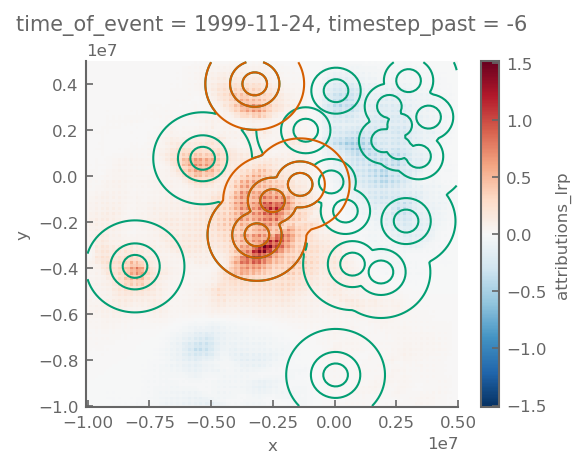

In [497]:
(ds_attrs.attributions_lrp/ds_attrs.attributions_lrp.max(['x','y','var_name'])).isel(time_of_event=0, timestep_past=0).sum('var_name').plot()
ds_attrs.distance_to_cyclones.min('n_cyclone').isel(time_of_event=0, timestep_past=0).plot.contour(levels=[0, 500, 1000,2000], colors='C2')
ds_attrs.distance_to_cyclones.where(important_cyclones).min('n_cyclone').isel(time_of_event=0, timestep_past=0).plot.contour(levels=[0, 500, 1000,2000], colors='C3')

In [651]:
cmap= sns.color_palette([(1,1,1)]+sns.color_palette('mako', 10))

Text(0.5, 0, 'Timestep past (D)')

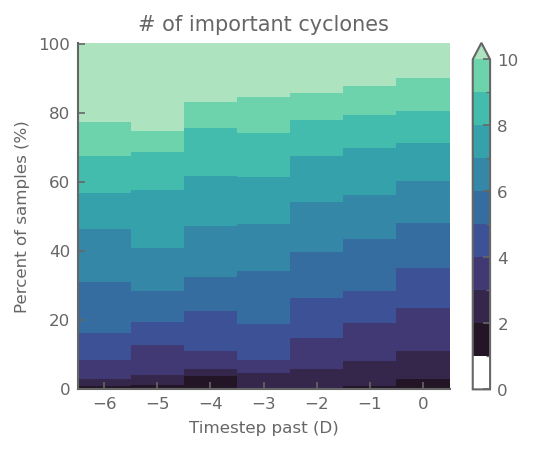

In [655]:
ds__ = important_cyclones.sum('n_cyclone').to_series().unstack().T.apply(np.sort).reset_index().iloc[:,1:].stack().to_xarray().rename(level_0='time_of_event')
ds__ = ds__.assign_coords(time_of_event=np.linspace(0,100,ds__.time_of_event.size))
ds__ = ds__.assign_coords(timestep_past=ds__.timestep_past.values.astype(int))

ds__.plot(levels = [0,1,2,3,4,5,6,7,8,9,10], colors=cmap)
plt.title('# of important cyclones')
plt.ylabel('Percent of samples (%)')
plt.xlabel('Timestep past (D)')
# ds__

Text(0.5, 0, 'Timestep past (D)')

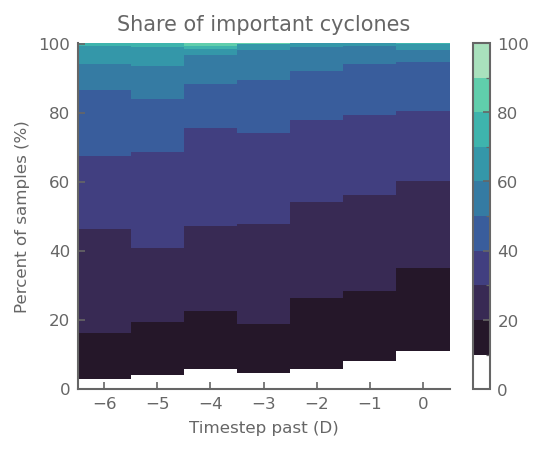

In [682]:
cmap= sns.color_palette([(1,1,1)]+sns.color_palette('mako', 9))
ds__ = 100*(important_cyclones.sum('n_cyclone')/important_cyclones.count('n_cyclone')).to_series().unstack().T.apply(np.sort).reset_index().iloc[:,1:].stack().to_xarray().rename(level_0='time_of_event')
ds__ = ds__.assign_coords(time_of_event=np.linspace(0,100,ds__.time_of_event.size))
ds__ = ds__.assign_coords(timestep_past=ds__.timestep_past.values.astype(int))

ds__.plot(levels = np.arange(0,101,10), colors=cmap)
plt.title('Share of important cyclones')
plt.ylabel('Percent of samples (%)')
plt.xlabel('Timestep past (D)')


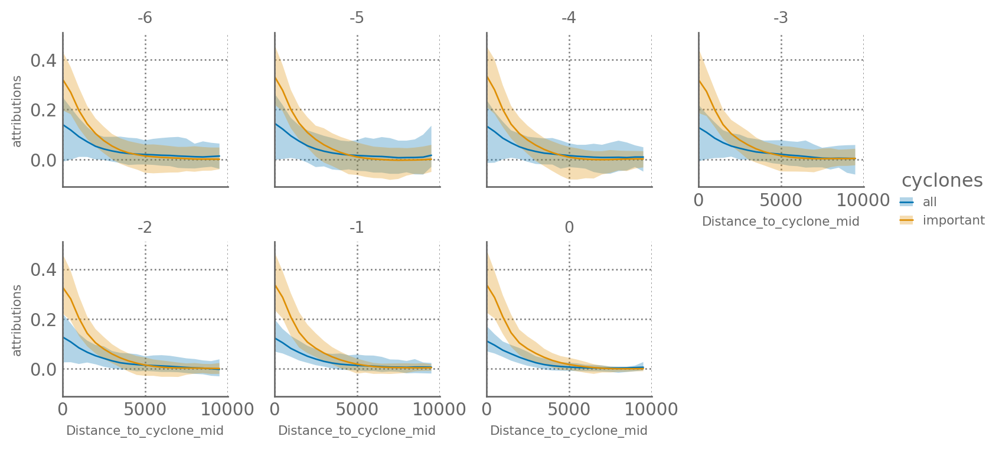

In [683]:

(so.Plot(df_.query("attr_method=='LRP'"), x='Distance_to_cyclone_mid', y='attributions', color='cyclones')
 .add(so.Band(alpha=.3),so.Est(errorbar=('pi',90)) )
 .add(so.Line(), so.Agg())
 .layout(size=(8,4))
 .theme(plt.style.library["robin"])
 .theme({'axes.grid':True, 'grid.color':'.5'})
#  .theme(dict(fig))
.facet(col='timestep_past', wrap=4)
.limit(x=(0,10000))


 )
# df_

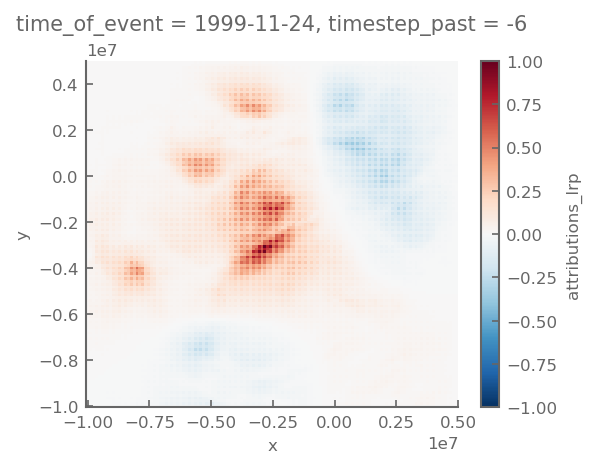

In [506]:
attributions_normed.isel(time_of_event=0, timestep_past=0).plot()

In [508]:
ds__ = attributions_per_distance.sel(time_of_event=time).sel(timestep_past=-3)
ds__.sel(Distance_to_cyclone=slice(0,2000)).max() 


<xarray.DataArray 'attributions_lrp' ()> Size: 8B
array(124.36552429)
Coordinates:
    timestep_past  int64 8B -3
    time_of_event  datetime64[ns] 8B 2005-11-14

Text(0, 0.5, 'Average attributions')

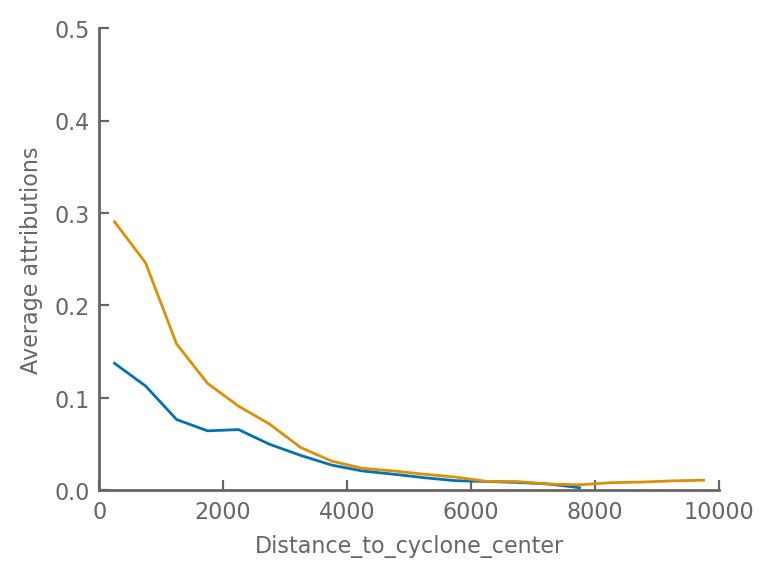

In [509]:
fig, ax = plt.subplots(figsize=(4,3), dpi=200)
attributions_per_all_distance.sel(time_of_event=time).sel(timestep_past=-4).plot(hue='n_cyclone', label='All cyclones')
attributions_per_important_distance.sel(time_of_event=time).sel(timestep_past=-4).plot(hue='n_cyclone', label='Only important cyclones')
ax.set_title('')
ax.set_ylim(0,0.5)
ax.set_xlim(0,10000)
ax.set_ylabel('Average attributions')


In [510]:
attributions_per_all_distance_q.Distance_to_cyclone

<xarray.DataArray 'Distance_to_cyclone' (Distance_to_cyclone: 20)> Size: 160B
array([Interval(0.45409683503747605, 2080.9849634374814, closed='right'),
       Interval(2080.9849634374814, 2981.900987253175, closed='right'),
       Interval(2981.900987253175, 3693.291063224536, closed='right'),
       Interval(3693.291063224536, 4311.498137060373, closed='right'),
       Interval(4311.498137060373, 4875.173708911762, closed='right'),
       Interval(4875.173708911762, 5403.879311650734, closed='right'),
       Interval(5403.879311650734, 5910.7361042501225, closed='right'),
       Interval(5910.7361042501225, 6403.936927485766, closed='right'),
       Interval(6403.936927485766, 6890.636267747287, closed='right'),
       Interval(6890.636267747287, 7379.194143286086, closed='right'),
       Interval(7379.194143286086, 7879.817675509939, closed='right'),
       Interval(7879.817675509939, 8403.134177702152, closed='right'),
       Interval(8403.134177702152, 8958.02704018491, closed='right'),
       Interval(8958.02704018491, 9554.816797605663, closed='right'),
       Interval(9554.816797605663, 10209.245068991768, closed='right'),
       Interval(10209.245068991768, 10947.211806737243, closed='right'),
       Interval(10947.211806737243, 11812.098823630966, closed='right'),
       Interval(11812.098823630966, 12882.825750501912, closed='right'),
       Interval(12882.825750501912, 14404.923210817398, closed='right'),
       Interval(14404.923210817398, 24843.08610461777, closed='right')],
      dtype=object)
Coordinates:
  * Distance_to_cyclone  (Distance_to_cyclone) object 160B (0.454096835037476...

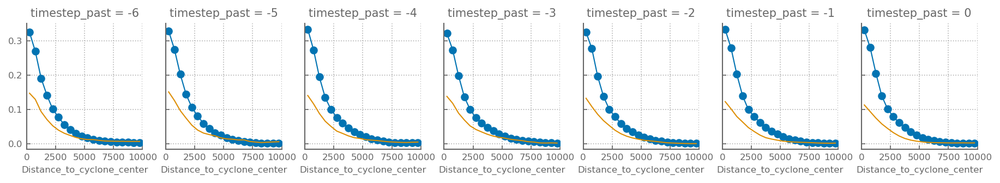

In [511]:
attributions_per_important_distance_q = attributions_per_important_distance.quantile([0.05,0.17,0.5,0.83,0.95],'time_of_event')
attributions_per_all_distance_q = attributions_per_all_distance.quantile([0.05,0.17,0.5,0.83,0.95],'time_of_event')

fig, axs = plt.subplots(1,7, figsize=(15,2), sharex=True, sharey=True)

for k, ax in enumerate(axs):
    attributions_per_important_distance.isel(timestep_past=k).median('time_of_event').plot (ax=ax, marker='o')
    # ax.fill_between(attributions_per_important_distance_q.Distance_to_cyclone, attributions_per_important_distance_q.isel(timestep_past=k).sel(quantile=0.05), attributions_per_important_distance_q.isel(timestep_past=k).sel(quantile=0.95), alpha=.3)
    attributions_per_all_distance.isel(timestep_past=k).median('time_of_event').plot(ax=ax)
    # ax.fill_between(attributions_per_all_distance_q.Distance_to_cyclone, attributions_per_all_distance_q.isel(timestep_past=k).sel(quantile=0.05), attributions_per_all_distance_q.isel(timestep_past=k).sel(quantile=0.95), alpha=.3)
    ax.grid()
    ax.set_ylabel('')
    ax.set_xlim(0,10000)

In [ ]:
attributions_per_all_distance.count('Distance_to_cyclone').sel(timestep_past=0)

<xarray.DataArray 'attributions_lrp' (timestep_past: 7, time_of_event: 235)> Size: 13kB
array([[40, 53, 51, ..., 64, 59, 75],
       [46, 41, 48, ..., 59, 59, 76],
       [45, 51, 50, ..., 59, 60, 79],
       ...,
       [53, 50, 55, ..., 58, 56, 69],
       [41, 73, 55, ..., 56, 56, 66],
       [51, 55, 60, ..., 56, 54, 59]], shape=(7, 235))
Coordinates:
  * timestep_past  (timestep_past) int64 56B -6 -5 -4 -3 -2 -1 0
  * time_of_event  (time_of_event) datetime64[ns] 2kB 1999-11-24 ... 2012-07-22

In [465]:
attributions_per_important_distance_q

<xarray.DataArray 'attributions_lrp' (quantile: 3, Distance_to_cyclone: 100,
                                      timestep_past: 7)> Size: 17kB
array([[[ 3.86935619e-01,  3.82057196e-01,  3.83244866e-01, ...,
          3.88835663e-01,  3.90619590e-01,  3.85739228e-01],
        [ 2.63665044e-01,  2.59450537e-01,  2.62592075e-01, ...,
          2.68876767e-01,  2.76136309e-01,  2.77341113e-01],
        [ 1.99603125e-01,  1.99781007e-01,  1.99668359e-01, ...,
          2.06344599e-01,  2.00895703e-01,  2.08851931e-01],
        ...,
        [            nan, -1.77688195e-02,  5.53042536e-03, ...,
          4.24054611e-02,  7.74768889e-02,             nan],
        [            nan, -7.78968118e-03,  4.89810123e-03, ...,
          3.66059467e-02,             nan,             nan],
        [            nan,  5.92616759e-03,  2.00056634e-03, ...,
          1.28767937e-02,             nan,             nan]],

       [[ 4.46340859e-01,  4.48851168e-01,  4.57185388e-01, ...,
          4.60086375e-01,  4.47565392e-01,  4.59121674e-01],
        [ 3.14971805e-01,  3.15176725e-01,  3.19981426e-01, ...,
          3.31305891e-01,  3.26584086e-01,  3.31098199e-01],
        [ 2.44809508e-01,  2.48940498e-01,  2.51394659e-01, ...,
          2.51152188e-01,  2.48400643e-01,  2.54280299e-01],
...
          4.94423471e-02,  7.74768889e-02,             nan],
        [            nan,  2.96471384e-03,  5.42790885e-03, ...,
          3.66059467e-02,             nan,             nan],
        [            nan,  5.92616759e-03,  2.00056634e-03, ...,
          1.28767937e-02,             nan,             nan]],

       [[ 5.13457668e-01,  5.33233666e-01,  5.51528146e-01, ...,
          5.47143509e-01,  5.47752506e-01,  5.52096739e-01],
        [ 3.76588252e-01,  3.68510619e-01,  4.03164394e-01, ...,
          4.13401197e-01,  3.90595732e-01,  3.99443947e-01],
        [ 3.09810403e-01,  2.99051929e-01,  3.10136405e-01, ...,
          3.29766710e-01,  3.11978210e-01,  3.18213134e-01],
        ...,
        [            nan,  3.72881879e-03,  3.10497296e-02, ...,
          5.64792331e-02,  7.74768889e-02,             nan],
        [            nan,  8.98980191e-03,  5.95771648e-03, ...,
          3.66059467e-02,             nan,             nan],
        [            nan,  5.92616759e-03,  2.00056634e-03, ...,
          1.28767937e-02,             nan,             nan]]],
      shape=(3, 100, 7))
Coordinates:
  * timestep_past        (timestep_past) int64 56B -6 -5 -4 -3 -2 -1 0
  * Distance_to_cyclone  (Distance_to_cyclone) float64 800B 461.0 ... 2.097e+04
  * quantile             (quantile) float64 24B 0.17 0.5 0.83

In [420]:
attributions_per_important_distance.isel(timestep_past=0).mean('time_of_event')

<xarray.DataArray 'attributions_lrp' (var_name: 4, Distance_to_cyclone: 100)> Size: 2kB
array([[ 8.59743423e+01,  5.73246803e+01,  3.97271729e+01,
         2.94029922e+01,  2.31344166e+01,  1.89440632e+01,
         1.59585285e+01,  1.37357216e+01,  1.19361296e+01,
         1.06002274e+01,  9.40548420e+00,  8.39660072e+00,
         7.51827288e+00,  6.78627968e+00,  6.13796473e+00,
         5.54964352e+00,  4.98653603e+00,  4.55066395e+00,
         4.13199854e+00,  3.86448383e+00,  3.50944328e+00,
         3.28683257e+00,  3.03771329e+00,  2.82830763e+00,
         2.62257051e+00,  2.40997028e+00,  2.23252439e+00,
         2.07482815e+00,  1.97440851e+00,  1.81196558e+00,
         1.71673369e+00,  1.57725251e+00,  1.49959707e+00,
         1.40181160e+00,  1.28386676e+00,  1.23771846e+00,
         1.15764678e+00,  1.05469728e+00,  9.58474696e-01,
         9.77959633e-01,  8.59875321e-01,  8.16738486e-01,
         7.98311591e-01,  7.37316847e-01,  7.21159399e-01,
         6.69193625e-01,  6.36435807e-01,  5.94829857e-01,
         5.60034931e-01,  5.00428855e-01,  4.18057203e-01,
         3.92805666e-01,  3.00745666e-01,  2.32629284e-01,
         1.92736641e-01,  1.28344774e-01,  1.15063347e-01,
         8.58293474e-02,  7.43370056e-02,  2.90151611e-02,
...
         3.32628846e-01,  2.97734886e-01,  2.37983614e-01,
         1.69318631e-01,  1.44680321e-01,  8.73078927e-02,
         7.67494068e-02,  5.33716194e-02,  2.62038736e-03,
        -1.17716801e-04, -3.71401124e-02, -5.04892841e-02,
        -7.15920776e-02, -7.88660347e-02, -8.59990045e-02,
        -9.75586697e-02, -9.24532637e-02, -1.16236039e-01,
        -1.01166531e-01, -1.20802961e-01, -1.11698076e-01,
        -1.05782144e-01, -1.04335941e-01, -9.63065252e-02,
        -9.30324122e-02, -8.43431652e-02, -8.17311183e-02,
        -8.54076818e-02, -7.32572451e-02, -6.71333447e-02,
        -4.99737822e-02, -4.45811301e-02, -3.22278179e-02,
        -2.76488587e-02, -1.87896378e-02, -1.15802586e-02,
        -5.92841115e-03, -1.14108920e-02, -1.33981360e-02,
        -1.34004289e-02, -1.06682302e-02,  3.67895537e-03,
         1.76385697e-02,  3.43692787e-02,  4.75093015e-02,
         6.65618703e-02,  7.52659291e-02,  9.52717215e-02,
         1.11960717e-01,  1.20668635e-01,  1.22479454e-01,
         8.55862796e-02,  7.00381771e-02,  3.88520174e-02,
        -3.19872936e-03,             nan,             nan,
                    nan]], dtype=float32)
Coordinates:
  * var_name             (var_name) <U4 64B 'x850' 'y850' 'z500' 'msl'
    timestep_past        int64 8B -6
  * Distance_to_cyclone  (Distance_to_cyclone) float64 800B 461.0 ... 2.097e+04

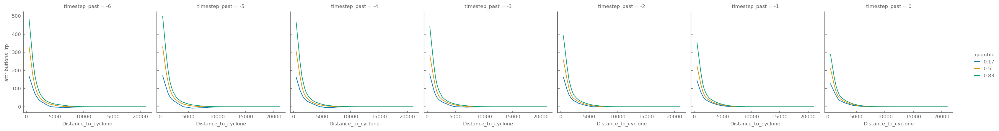

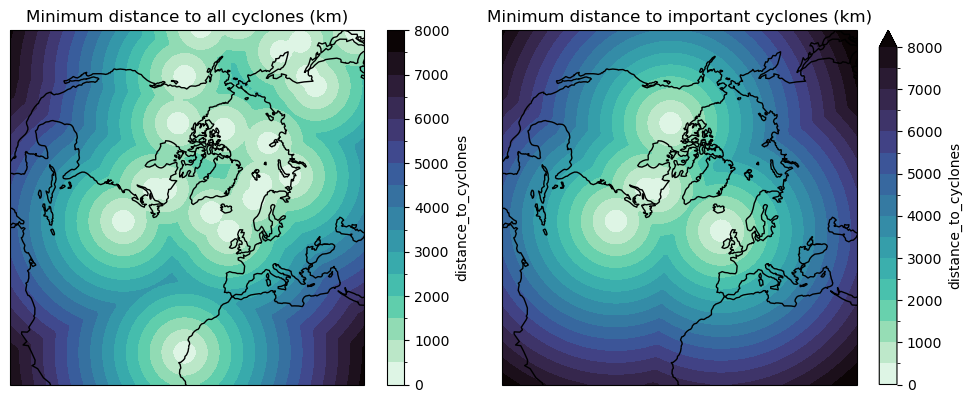

In [ ]:
fig, axs = plt.subplots(1,2,figsize = (10,4), subplot_kw=dict(projection=ccrs.NorthPolarStereo(0,70)))

ds_attrs.distance_to_cyclones.sel(time_of_event=time).sel(timestep_past=-3).min('n_cyclone').plot.contourf(ax=axs[0], transform=ccrs.NorthPolarStereo(0,70), cmap='mako_r', levels=np.arange(0,8001,500))
ds_attrs.distance_to_cyclones.sel(time_of_event=time).sel(timestep_past=-3).where(important_cyclones.sel(time_of_event=time).sel(timestep_past=-3)).min('n_cyclone').plot.contourf(ax=axs[1], transform=ccrs.NorthPolarStereo(0,70), cmap='mako_r', levels=np.arange(0,8001,500))


axs[0].set_title('Minimum distance to all cyclones (km)')
axs[1].set_title('Minimum distance to important cyclones (km)')

axs[0].coastlines()
axs[1].coastlines()

plt.tight_layout()

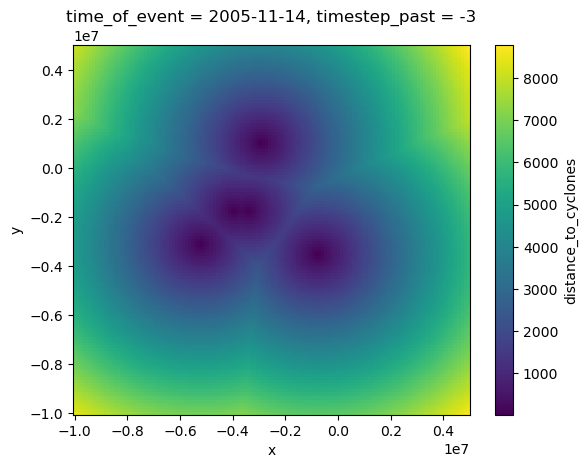

In [378]:
ds_attrs.distance_to_cyclones.sel(time_of_event=time).sel(timestep_past=-3).where(important_cyclones.sel(time_of_event=time).sel(timestep_past=-3)).min('n_cyclone').plot()

/tmp/ipykernel_72715/2482252743.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cyclones_['n_cyclone'] = np.arange(cyclones_.index.size)


Text(0.5, 1.0, '')

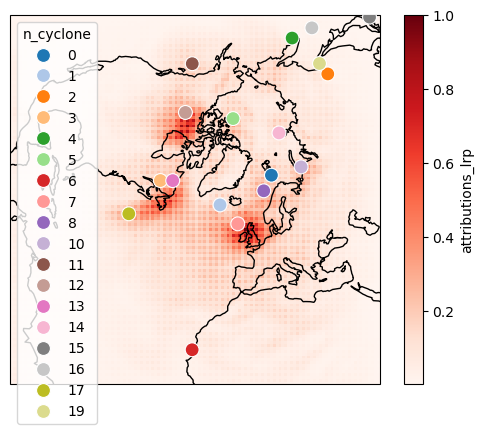

In [299]:
time = ds_attrs.time_of_event.isel(time_of_event=100).values

ds_ = ds_attrs.attributions_lrp.sum('var_name').sel(time_of_event=time, timestep_past=-3,)
ds_ = ds_/ds_.max(['x','y'])
plot = ds_.plot( subplot_kws={'projection':ccrs.NorthPolarStereo(0,70)}, transform=ccrs.NorthPolarStereo(0,70), col_wrap=4, cmap='Reds')
ax = plot.axes
# cyclones_ = daily_df_cycs2.loc[time +(k-6)*pd.Timedelta('1D')]
cyclones_ = daily_cycs.loc[time -pd.Timedelta('3D')]
cyclones_['n_cyclone'] = np.arange(cyclones_.index.size)
cyclones_ = cyclones_.query("lat>0 & y<4941176 & x <4941176")
sns.scatterplot(cyclones_, x='x',y='y', ax=ax, transform=ccrs.NorthPolarStereo(0,70), hue='n_cyclone', s=100, zorder=100, hue_norm=(970,1020), palette='tab20', edgecolor='1')
ax.coastlines()
ax.set_title('')

In [286]:
daily_cycs.loc[time-pd.Timedelta('3D')]#.sel(timestep_past=-3).dropna('n_cyclone', how='all').to_series()

,day,track_id,lon,lat,x,y,msl,date
day,,,,,,,,
2005-11-11,2005-11-11,552177,21.102180,74.893756,5.924768e+05,-1.535205e+06,989.661767,2005-11-11
2005-11-11,2005-11-11,552202,-28.696374,61.666979,-1.501084e+06,-2.746159e+06,980.199576,2005-11-11
2005-11-11,2005-11-11,552261,131.888055,55.221068,2.889359e+06,2.590828e+06,1002.160810,2005-11-11
2005-11-11,2005-11-11,552341,-65.983071,51.693120,-3.932525e+06,-1.752266e+06,994.097595,2005-11-11
2005-11-11,2005-11-11,552390,160.505221,51.739833,1.434783e+06,4.053208e+06,1005.987562,2005-11-11
2005-11-11,2005-11-11,552419,-128.617457,78.582735,-9.707546e+05,7.725673e+05,1002.841913,2005-11-11
2005-11-11,2005-11-11,552431,-16.962741,17.613329,-2.637656e+06,-8.647016e+06,1009.586893,2005-11-11
2005-11-11,2005-11-11,552435,-12.223602,57.511690,-7.783813e+05,-3.517104e+06,966.152001,2005-11-11
2005-11-11,2005-11-11,552445,7.469770,69.959469,2.800657e+05,-2.170757e+06,984.347200,2005-11-11


In [236]:
df__

,var_name,Distance_to_cyclone,n_cyclone,timestep_past,attributions_lrp
0,x850,452.008344,0,-6,1.036744
1,x850,452.008344,0,-5,4.041509
2,x850,452.008344,0,-4,6.978485
3,x850,452.008344,0,-3,9.205457
4,x850,452.008344,0,-2,17.698301
...,...,...,...,...,...
30795,msl,20811.498914,10,-4,NaN
30796,msl,20811.498914,10,-3,17.251190
30797,msl,20811.498914,10,-2,NaN
30798,msl,20811.498914,10,-1,NaN


In [195]:
year = 2005
df_cycs2 =pd.read_csv(f'/Data/gfi/users/rogui7909/cyclones/Pepler/proj100_lows_rad2cv0.5_rt52/tracks_{year}.dat', delim_whitespace=True, header=None)
if year <2000:
    time = pd.to_datetime('19'+df_cycs2[2].astype(str) +' ' + df_cycs2[3])
else:
    time = pd.to_datetime('200'+df_cycs2[2].astype(str) +' ' + df_cycs2[3])
time

# def matlab2datetime(matlab_datenum):
#     return (datetime.datetime.fromordinal(int(matlab_datenum))
#             + datetime.timedelta(days=matlab_datenum%1)
#             - datetime.timedelta(days=366))
df_cycs2.columns = ['track_id', 'timestep','date','hour','nose','lon','lat','msl','cv','radius','depth','lifetime','speed']
df_cycs2['time'] = time
# pd.to_datetime(df_cycs2[2], unit='D', origin='unix')


# pd.to_datetime(matlab2datetime(df_cycs2[2]),unit='D')
# df_cycs2.groupby('time')[['lon','lat']].mean().plot.scatter('lon','lat')

xy = proj.transform_points(ccrs.PlateCarree(), df_cycs2['lon'].values, df_cycs2['lat'].values)
df_cycs2['x'] = xy[:, 0]
df_cycs2['y'] = xy[:, 1]
daily_df_cycs2 = df_cycs2.groupby([df_cycs2.time.dt.date.rename('day'), 'track_id'])[['lon','lat','x','y','msl']].agg(dict(lon='mean', lat='mean', x='mean', y='mean', msl='min')).reset_index()
daily_df_cycs2['date'] = pd.to_datetime(daily_df_cycs2.day)
daily_df_cycs2.index = pd.to_datetime(daily_df_cycs2.day)

/tmp/ipykernel_72715/908502068.py:2: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df_cycs2 =pd.read_csv(f'/Data/gfi/users/rogui7909/cyclones/Pepler/proj100_lows_rad2cv0.5_rt52/tracks_{year}.dat', delim_whitespace=True, header=None)


In [200]:
daily_df_cycs2.loc[pd.to_datetime('2004-12-01')]

,day,track_id,lon,lat,x,y,msl,date
day,,,,,,,,
2004-12-01,2004-12-01,1,129.6475,12.685,7.596752e+06,6.301199e+06,995.17,2004-12-01
2004-12-01,2004-12-01,2,183.1875,42.640,-2.637412e+05,5.408829e+06,979.14,2004-12-01
2004-12-01,2004-12-01,3,200.4375,57.870,-1.216013e+06,3.347790e+06,989.31,2004-12-01
2004-12-01,2004-12-01,4,168.4150,52.120,8.540698e+05,4.165035e+06,999.30,2004-12-01
2004-12-01,2004-12-01,5,177.0650,55.245,1.911006e+05,3.866947e+06,990.68,2004-12-01
...,...,...,...,...,...,...,...,...
2004-12-01,2004-12-01,89,316.0300,46.650,-3.419038e+06,-3.544229e+06,1006.60,2004-12-01
2004-12-01,2004-12-01,90,6.7100,38.790,6.933424e+05,-5.893265e+06,1005.36,2004-12-01
2004-12-01,2004-12-01,91,358.5100,-67.350,-1.591035e+06,-6.116714e+07,988.47,2004-12-01


In [190]:
df_cycs2 =pd.read_csv(f'/Data/gfi/users/rogui7909/cyclones/Pepler/proj100_lows_rad2cv0.5_rt52/tracks_{year}.dat', delim_whitespace=True, header=None)
df_cycs2

/tmp/ipykernel_72715/3876857041.py:1: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df_cycs2 =pd.read_csv(f'/Data/gfi/users/rogui7909/cyclones/Pepler/proj100_lows_rad2cv0.5_rt52/tracks_{year}.dat', delim_whitespace=True, header=None)


,0,1,2,3,4,5,6,7,8,9,10,11,12
0,1,1,181201,00:00,0,176.62,33.24,1010.80,1.60,5.51,5.25,-4.81,-2.55
1,1,2,181201,06:00,0,181.86,33.71,1012.86,1.52,4.74,5.94,-4.44,-1.19
2,1,3,181201,12:00,0,184.81,33.10,1016.22,1.23,3.62,5.17,-4.92,-1.30
3,1,4,181201,18:00,0,186.98,32.27,1018.30,1.05,3.32,4.71,-5.07,-0.42
4,1,5,181202,00:00,0,189.40,31.28,1020.13,0.98,3.11,5.29,-6.18,-0.65
...,...,...,...,...,...,...,...,...,...,...,...,...,...
83894,14859,1,191231,18:00,11,58.93,-66.74,988.99,0.52,0.99,2.76,1.43,0.73
83895,14860,1,191231,18:00,11,251.63,-39.97,1011.24,0.58,1.80,4.30,-1.40,-2.53
83896,14861,1,191231,18:00,1,198.55,-48.81,1005.90,0.99,3.98,4.32,-2.97,0.50
83897,14862,1,191231,18:00,10,123.29,-14.94,1003.04,0.56,1.85,4.28,-0.57,-2.06


In [152]:
df_.describe()

,0,1,2,4,5,6,7,8,9,10,11,12
count,83200.000000,83200.000000,83200.000000,83200.000000,83200.000000,83200.000000,83200.000000,83200.000000,83200.000000,83200.000000,83200.000000,83200.000000
mean,7315.758942,8.948365,889926.384964,2.795709,185.653497,-2.398260,993.494990,1.243284,6.174065,4.912659,1.458986,0.015030
std,4222.158924,9.452125,2563.831287,4.392687,101.516686,55.497918,16.713065,0.723232,4.420253,1.124535,4.413911,3.820148
min,1.000000,1.000000,881201.000000,0.000000,0.010000,-84.980000,928.890000,0.500000,-3.330000,0.000000,-18.730000,-22.020000
25%,3628.750000,2.000000,890310.000000,0.000000,104.890000,-56.282500,981.930000,0.710000,3.000000,4.120000,-1.380000,-1.982500
50%,7309.000000,6.000000,890616.000000,1.000000,186.405000,-27.660000,997.030000,1.020000,4.860000,4.810000,0.810000,0.110000
75%,10961.000000,13.000000,890923.000000,1.000000,273.480000,53.660000,1006.400000,1.550000,8.020000,5.590000,3.770000,2.050000
max,14739.000000,92.000000,891231.000000,11.000000,360.000000,89.870000,1045.590000,9.110000,40.800000,12.750000,30.020000,21.300000


In [209]:
ds_attrs.x

<xarray.DataArray 'x' (x: 128)> Size: 1kB
array([-10000000.      ,  -9882352.941176,  -9764705.882353,  -9647058.823529,
        -9529411.764706,  -9411764.705882,  -9294117.647059,  -9176470.588235,
        -9058823.529412,  -8941176.470588,  -8823529.411765,  -8705882.352941,
        -8588235.294118,  -8470588.235294,  -8352941.176471,  -8235294.117647,
        -8117647.058824,  -8000000.      ,  -7882352.941176,  -7764705.882353,
        -7647058.823529,  -7529411.764706,  -7411764.705882,  -7294117.647059,
        -7176470.588235,  -7058823.529412,  -6941176.470588,  -6823529.411765,
        -6705882.352941,  -6588235.294118,  -6470588.235294,  -6352941.176471,
        -6235294.117647,  -6117647.058824,  -6000000.      ,  -5882352.941176,
        -5764705.882353,  -5647058.823529,  -5529411.764706,  -5411764.705882,
        -5294117.647059,  -5176470.588235,  -5058823.529412,  -4941176.470588,
        -4823529.411765,  -4705882.352941,  -4588235.294118,  -4470588.235294,
        -4352941.176471,  -4235294.117647,  -4117647.058824,  -4000000.      ,
        -3882352.941176,  -3764705.882353,  -3647058.823529,  -3529411.764706,
        -3411764.705882,  -3294117.647059,  -3176470.588235,  -3058823.529412,
        -2941176.470588,  -2823529.411765,  -2705882.352941,  -2588235.294118,
        -2470588.235294,  -2352941.176471,  -2235294.117647,  -2117647.058824,
        -2000000.      ,  -1882352.941176,  -1764705.882353,  -1647058.823529,
        -1529411.764706,  -1411764.705882,  -1294117.647059,  -1176470.588235,
        -1058823.529412,   -941176.470588,   -823529.411765,   -705882.352941,
         -588235.294118,   -470588.235294,   -352941.176471,   -235294.117647,
         -117647.058824,         0.      ,    117647.058824,    235294.117647,
          352941.176471,    470588.235294,    588235.294118,    705882.352941,
          823529.411765,    941176.470588,   1058823.529412,   1176470.588235,
         1294117.647059,   1411764.705882,   1529411.764706,   1647058.823529,
         1764705.882353,   1882352.941176,   2000000.      ,   2117647.058824,
         2235294.117647,   2352941.176471,   2470588.235294,   2588235.294118,
         2705882.352941,   2823529.411765,   2941176.470588,   3058823.529412,
         3176470.588235,   3294117.647059,   3411764.705882,   3529411.764706,
         3647058.823529,   3764705.882353,   3882352.941176,   4000000.      ,
         4117647.058824,   4235294.117647,   4352941.176471,   4470588.235294,
         4588235.294118,   4705882.352941,   4823529.411765,   4941176.470588])
Coordinates:
  * x        (x) float64 1kB -1e+07 -9.882e+06 ... 4.824e+06 4.941e+06

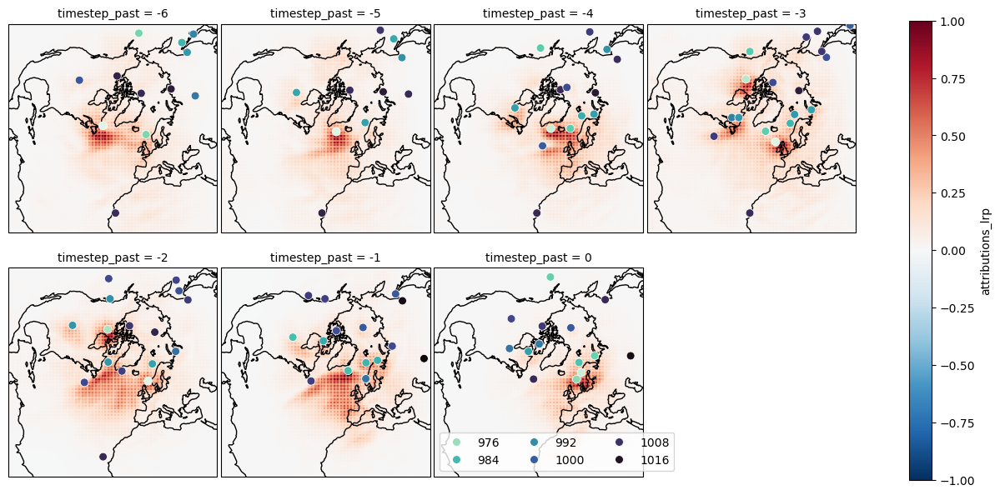

In [222]:
time = ds_attrs.time_of_event.isel(time_of_event=100).values

ds_ = ds_attrs.attributions_lrp.sum('var_name').sel(time_of_event=time)
ds_ = ds_/ds_.max(['x','y'])
plot = ds_.plot(col='timestep_past', subplot_kws={'projection':ccrs.NorthPolarStereo(0,70)}, transform=ccrs.NorthPolarStereo(0,70), col_wrap=4)
for k,ax in enumerate(plot.axs.flat):
    # cyclones_ = daily_df_cycs2.loc[time +(k-6)*pd.Timedelta('1D')]
    cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')]
    cyclones_ = cyclones_.query("lat>0 & y<4941176 & x <4941176")
    sns.scatterplot(cyclones_, x='x',y='y', ax=ax, transform=ccrs.NorthPolarStereo(0,70), hue='msl', s=50, zorder=100, hue_norm=(970,1020), palette='mako_r', edgecolor='1')
    if k<=5:
        ax.legend().remove()
    else:
        ax.legend(ncols=3)
    ax.coastlines()


In [192]:
time

np.datetime64('2005-11-14T00:00:00.000000000')

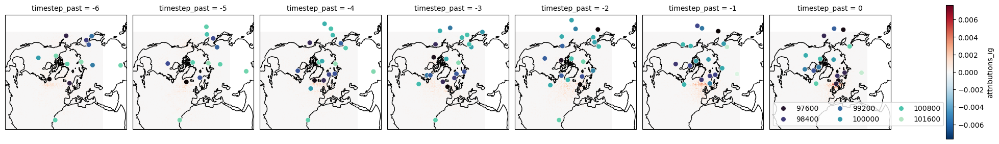

In [191]:
time = ds_attrs.time_of_event.isel(time_of_event=100).values

ds_ = ds_attrs.attributions_ig.max('var_name').sel(time_of_event=time)
ds_ = ds_/ds_.sum(['x','y'])
plot = ds_.plot(col='timestep_past', subplot_kws={'projection':ccrs.NorthPolarStereo(0,70)}, transform=ccrs.NorthPolarStereo(0,70))
for k,ax in enumerate(plot.axs.flat):
    cyclones_ = daily_cycs.loc[time +(k-6)*pd.Timedelta('1D')]
    sns.scatterplot(cyclones_, x='x',y='y', ax=ax, transform=ccrs.NorthPolarStereo(0,70), hue='msl', s=50, zorder=100, hue_norm=(97000,102000), palette='mako')
    if k<=5:
        ax.legend().remove()
    else:
        ax.legend(ncols=3)
    ax.coastlines()


In [297]:
attributions_per_distance_normed = attributions_per_distance / attributions_per_distance.sum(['Distance_to_cyclone','var_name'])

In [313]:
cyclone_focus = attributions_per_distance_normed.sel(Distance_to_cyclone=slice(0,2000)).sum(['Distance_to_cyclone','var_name']) / attributions_per_distance_normed.sel(Distance_to_cyclone=slice(2000,None)).sum(['Distance_to_cyclone','var_name'])
normal_focus = attributions_per_distance_normed.sel(Distance_to_cyclone=slice(0,2000)).count(['Distance_to_cyclone','var_name']) / attributions_per_distance_normed.sel(Distance_to_cyclone=slice(2000,None)).count(['Distance_to_cyclone','var_name'])
cyclone_focus_ratio = cyclone_focus/normal_focus

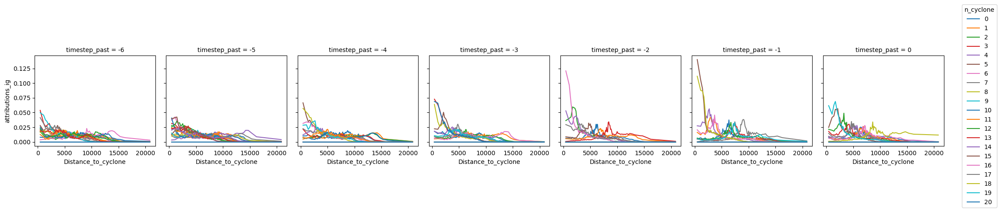

In [299]:
attributions_per_distance_normed.isel(time_of_event=0).sum('var_name').plot(col='timestep_past', hue='n_cyclone')

In [ ]:
distance_to_important_cyclones = distance_to_cyclones.where(cyclone_focus_ratio>3).min('n_cyclone')


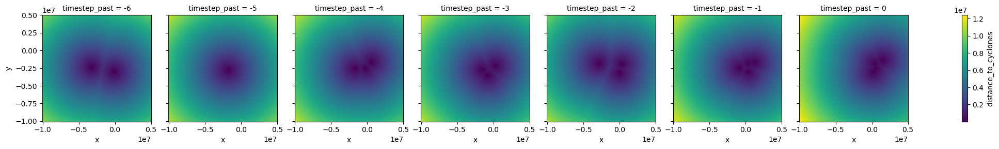

In [327]:
distance_to_important_cyclones.isel(time_of_event=100).plot(col='timestep_past')

In [329]:

attributions_per_important_distance = flox.xarray.xarray_reduce(
    # variable qu'on veut aggréger 
    ds_attrs.attributions_ig.clip(0),#/ds_attrs.attributions_ig.sum(['var_name','x','y']),
    # Variables selon lesquelles on veut grouer : ici il y a deux variables mais on peut en rajouter autant qu'on veut
    distance_to_important_cyclones,#.min('poly_id'),
    # ds_attrs.poly_id,
    # ds_attrs.n_cyclone,
    ds_attrs.timestep_past,
    ds_attrs.time_of_event,
    # ds_attrs.var_name,

    # Fonction à appliquer à chacun des groupes pour aggrégation
    func="sum",
    # Groupes attendus pour chacune des variables : soit on met les bins, soit on met None quand on veut grouper pour toutes les valeurs possibles
    expected_groups=(distance_to_important_cyclones.quantile(np.arange(0,1.0001,.01)),
                    # [0,1_000_000,2_000_000,5_000_000,],
                    # np.arange(0,1.1,.02), 
                    #  None,
                     None,
                     None,
                    #  None,
                     ),
    # Déterminer si les groupes données correspondent à des bins ou non
    isbin=[True, False, False, False],#,False,False],
    # Méthode de calcul parallèl : flox propose plein de méthodes différentes pour optimiser les calculs en fonction de la forme des données
    method="map-reduce",
)
attributions_per_important_distance['distance_to_cyclones_bins'] = [k.mid for k in attributions_per_important_distance.distance_to_cyclones_bins.values]
attributions_per_important_distance = attributions_per_important_distance.rename(distance_to_cyclones_bins='Distance_to_cyclone')

In [333]:

attributions_per_all_distance = flox.xarray.xarray_reduce(
    # variable qu'on veut aggréger 
    ds_attrs.attributions_ig.clip(0),#/ds_attrs.attributions_ig.sum(['var_name','x','y']),
    # Variables selon lesquelles on veut grouer : ici il y a deux variables mais on peut en rajouter autant qu'on veut
    distance_to_cyclones.min('n_cyclone'),#.min('poly_id'),
    # ds_attrs.poly_id,
    # ds_attrs.n_cyclone,
    ds_attrs.timestep_past,
    ds_attrs.time_of_event,
    # ds_attrs.var_name,

    # Fonction à appliquer à chacun des groupes pour aggrégation
    func="sum",
    # Groupes attendus pour chacune des variables : soit on met les bins, soit on met None quand on veut grouper pour toutes les valeurs possibles
    expected_groups=(distance_to_cyclones.min('n_cyclone').quantile(np.arange(0,1.0001,.01)),
                    # [0,1_000_000,2_000_000,5_000_000,],
                    # np.arange(0,1.1,.02), 
                    #  None,
                     None,
                     None,
                    #  None,
                     ),
    # Déterminer si les groupes données correspondent à des bins ou non
    isbin=[True, False, False, False],#,False,False],
    # Méthode de calcul parallèl : flox propose plein de méthodes différentes pour optimiser les calculs en fonction de la forme des données
    method="map-reduce",
)
attributions_per_all_distance['distance_to_cyclones_bins'] = [k.mid for k in attributions_per_all_distance.distance_to_cyclones_bins.values]
attributions_per_all_distance = attributions_per_all_distance.rename(distance_to_cyclones_bins='Distance_to_cyclone')

In [ ]:
attributions_per_important_distance.sum('var_name').mean('time_of_event')
attributions_per_important_distance.sum('var_name').mean('time_of_event')



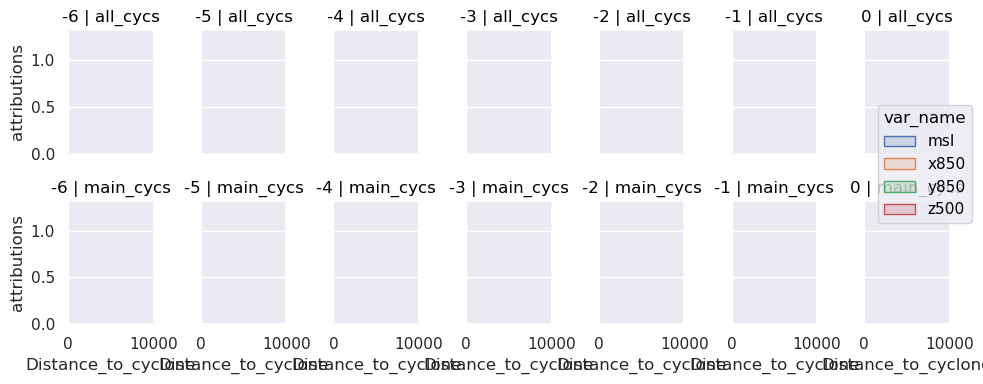

,var_name,Distance_to_cyclone,timestep_past,group_type,attributions
0,msl,1.366018e+05,-6,all_cycs,0.105771
1,msl,1.366018e+05,-5,all_cycs,0.106803
2,msl,1.366018e+05,-4,all_cycs,0.080794
3,msl,1.366018e+05,-3,all_cycs,0.105505
4,msl,1.366018e+05,-2,all_cycs,0.131322
...,...,...,...,...,...
5595,z500,1.303284e+07,-4,main_cycs,0.001124
5596,z500,1.303284e+07,-3,main_cycs,0.000816
5597,z500,1.303284e+07,-2,main_cycs,0.000611
5598,z500,1.303284e+07,-1,main_cycs,0.000362


In [349]:
df_ = pd.DataFrame(dict(main_cycs=attributions_per_important_distance.mean('time_of_event').to_series(),
                        all_cycs=attributions_per_all_distance.mean('time_of_event').to_series())).stack().reset_index().rename(columns={0:'attributions', 'level_3':'group_type'})

(so.Plot(df_, x='Distance_to_cyclone', y='attributions',color='var_name')
 .add(so.Area(), so.Stack())
 .facet(col='timestep_past', row='group_type')
 .layout(size=(10,4))
 .share(y=True)
 .limit(x=(0,10000))
).show()
df_

In [339]:
df_

main_cycs  all_cycs
Distance_to_cyclone timestep_past                     
1.366018e+05        -6                   NaN  0.209593
                    -5                   NaN  0.214075
                    -4                   NaN  0.163291
                    -3                   NaN  0.217092
                    -2                   NaN  0.267335
...                                      ...       ...
1.303284e+07        -4              0.018902       NaN
                    -3              0.013375       NaN
                    -2              0.008551       NaN
                    -1              0.008945       NaN
                     0              0.021941       NaN

[1400 rows x 2 columns]

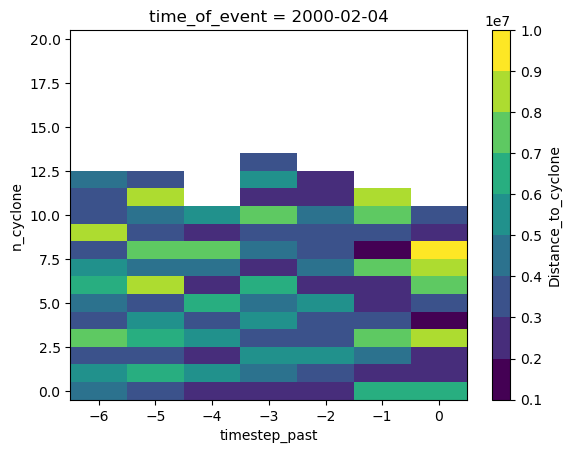

In [190]:
test = attributions_per_distance.isel(time_of_event=10).sum('var_name')
test.Distance_to_cyclone.weighted(test.where(test>0).fillna(0)).mean(['Distance_to_cyclone']).plot(levels=10)

In [170]:
attributions_per_distance.sel(Distance_to_cyclone=slice(0,2_000_000)).sum('var_name')

<xarray.DataArray 'attributions_ig' (Distance_to_cyclone: 5, n_cyclone: 21,
                                     timestep_past: 7, time_of_event: 235)> Size: 691kB
array([[[[-4.52908687e-04,  2.84980070e-02, -2.52352040e-02, ...,
          -7.24701490e-03,  2.27438994e-02,  1.42722443e-01],
         [-1.88349932e-03,  2.57241335e-02,  5.11554107e-02, ...,
           3.61034609e-02,  7.15513602e-02,  2.10242838e-01],
         [-2.98093967e-02,  1.27868552e-03,  2.53924802e-02, ...,
           6.97266757e-02, -4.95486800e-03,  1.27304792e-01],
         ...,
         [-1.70408399e-03,  4.47379947e-02,  3.09904516e-01, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 2.31917505e-03,  2.27593884e-01,  7.19569996e-03, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 8.17602314e-03,  2.03802133e+00,  1.20653957e-02, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00]],

        [[ 5.96545860e-02, -3.69805098e-03,  6.62535429e-02, ...,
           1.24261260e-03, -1.46895722e-02,  5.34505993e-02],
         [-2.68258005e-02, -7.11966865e-03,  4.64137793e-02, ...,
          -9.43647977e-03,  2.40842514e-02,  0.00000000e+00],
         [ 5.84787223e-04,  1.43439593e-02, -3.46969278e-03, ...,
           4.28475998e-02,  4.52421084e-02,  0.00000000e+00],
...
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00]],

        [[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         ...,
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00]]]],
      shape=(5, 21, 7, 235), dtype=float32)
Coordinates:
  * n_cyclone            (n_cyclone) int64 168B 0 1 2 3 4 5 ... 16 17 18 19 20
  * timestep_past        (timestep_past) int64 56B -6 -5 -4 -3 -2 -1 0
  * time_of_event        (time_of_event) datetime64[ns] 2kB 1999-11-24 ... 20...
  * Distance_to_cyclone  (Distance_to_cyclone) float64 40B 4.52e+05 ... 1.93e+06

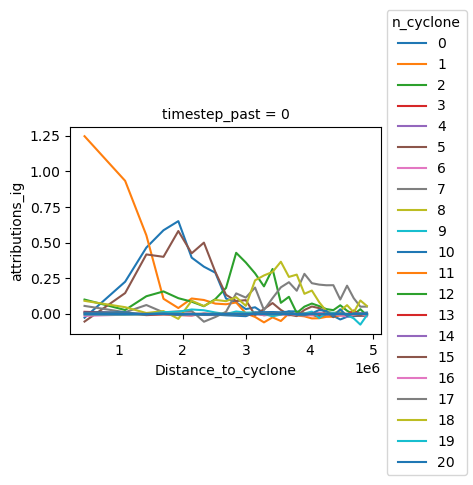

In [197]:
attributions_per_distance.sel(Distance_to_cyclone=slice(0,5_000_000)).isel(time_of_event=5).sum('var_name').dropna('n_cyclone', how='all').isel(timestep_past=[6]).plot(col='timestep_past', hue='n_cyclone',)

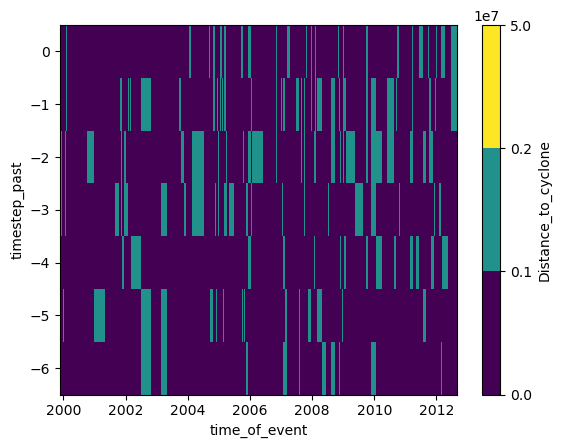

In [144]:
dict_results = attributions_per_distance.sum('var_name').sel(Distance_to_cyclone=slice(0,2_000_000)).argmax(['Distance_to_cyclone','n_cyclone'])

best_cyclone = attributions_per_distance.sel(n_cyclone=dict_results['n_cyclone'])
best_cyclone_distance = ds_attrs.distance_to_cyclones.sel(n_cyclone=dict_results['n_cyclone'])

attributions_per_distance.Distance_to_cyclone.isel(Distance_to_cyclone=dict_results['Distance_to_cyclone']).plot(levels=[0,1_000_000,2_000_000,50_000_000])

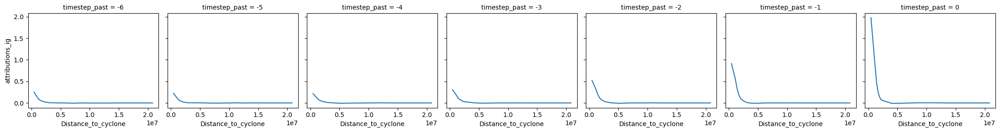

In [145]:
best_cyclone.sum('time_of_event').sum('var_name').plot(col='timestep_past')

In [133]:
best_cyclone_distance.isel(time_of_event=5).track_id

<xarray.DataArray 'track_id' (timestep_past: 7)> Size: 56B
array([429407., 429629., 429629., 429664., 429664., 429678., 429678.])
Coordinates:
    time_of_event  datetime64[ns] 8B 2000-01-02
  * timestep_past  (timestep_past) int64 56B -6 -5 -4 -3 -2 -1 0
    n_cyclone      (timestep_past) int64 56B 2 10 6 5 2 1 1
    track_id       (timestep_past) float64 56B 4.294e+05 4.296e+05 ... 4.297e+05

{452102: 'C0',
 452329: 'C1',
 452248: 'C2',
 452365: 'C3',
 452418: 'C4',
 452551: 'C5'}

/tmp/ipykernel_11455/2710130699.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for k,ax in enumerate(plot.axes.flatten()):


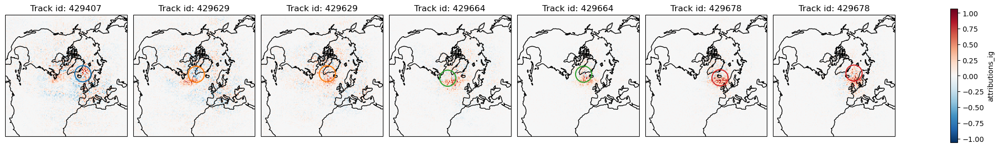

In [165]:
time_test = 5
colors = {int(k):f"C{color}" for color,k in enumerate(best_cyclone_distance.track_id.isel(time_of_event=time_test).to_series().unique())}
ds_ = ds_attrs.attributions_ig.isel(time_of_event=time_test).sum('var_name')
ds_ = ds_/ds_.max(['x','y'])
plot = ds_.plot(col='timestep_past', subplot_kws = dict(projection=ccrs.NorthPolarStereo(0,70)))
for k,ax in enumerate(plot.axes.flatten()):
    track = int(best_cyclone_distance.isel(time_of_event=time_test).isel(timestep_past=k).track_id)
    best_cyclone_distance.isel(time_of_event=time_test).isel(timestep_past=k).plot.contour( levels=[0,1000_000], colors=colors[track],ax=ax, transform=ccrs.NorthPolarStereo(0,70))
    ax.coastlines()
    ax.set_title(f'Track id: {track}')


/tmp/ipykernel_11455/3704572103.py:3: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for k,ax in enumerate(plot.axes.flatten()):


ValueError: DataArray must be 2d

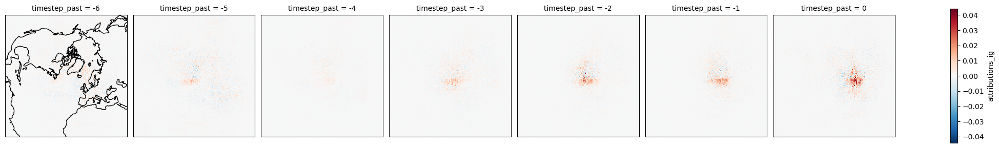

In [118]:
plot = ds_attrs.attributions_ig.isel(time_of_event=5).sum('var_name').plot(col='timestep_past', subplot_kws=dict(projection=ccrs.NorthPolarStereo(0,70)), 
                                                                     transform=ccrs.NorthPolarStereo(0,70) )
for k,ax in enumerate(plot.axes.flatten()):
    ax.coastlines()
    ds_attrs.distance_to_cyclones.isel(time_of_event=5).isel(timestep_past=k).plot.contour(ax=ax, levels=[0,250_000,500_000,1000_000,2000_000], colors='k', transform=ccrs.NorthPolarStereo(0,70))

In [45]:
ds_attrs.distance_to_cyclones

<xarray.DataArray 'distance_to_cyclones' (time_of_event: 235, timestep_past: 7,
                                          poly_id: 9, y: 128, x: 128)> Size: 2GB
array([[[[[12846939.07822565, 12768440.26329099, 12690546.54046544,
           ..., 11323850.95056477, 11387670.13223744,
           11452342.26661071],
          [12759822.45527543, 12680784.36721248, 12602348.8646454 ,
           ..., 11224919.85544292, 11289298.3152702 ,
           11354530.76098295],
          [12673199.12893192, 12593617.40085627, 12514635.59108449,
           ..., 11126353.07872827, 11191298.56283765,
           11257098.91017742],
          ...,
          [10036428.24742426,  9935749.34482975,  9835447.10634822,
           ...,  7994726.30154785,  8084867.30421143,
            8175707.41145086],
          [10097491.02444078,  9997427.07231472,  9897749.88594581,
           ...,  8071250.31575825,  8160546.08158508,
            8250552.99362529],
          [10159549.18648108, 10060102.52184925,  9961052.52915607,
           ...,  8148754.28169815,  8237209.90588075,
            8326388.13558949]],

...

         [[22577674.83005658, 22484429.20415699, 22391413.40341481,
           ..., 14108641.35295214, 14082333.76765602,
           14056961.60349023],
          [22506280.6358641 , 22412737.98457583, 22319423.41394878,
           ..., 13994106.90807855, 13967583.60176039,
           13942002.61262704],
          [22435276.17502561, 22341436.2330323 , 22247822.60178567,
           ..., 13879624.53181397, 13852882.03449254,
           13827088.84183144],
          ...,
          [17942761.45878004, 17825286.66450163, 17707814.15752764,
           ...,  3353363.81282185,  3240896.84787667,
            3128810.88545001],
          [17949489.23250018, 17832058.75979039, 17714631.16123206,
           ...,  3389177.45214094,  3277939.49296421,
            3167164.74119487],
          [17956985.2789798 , 17839604.14960137, 17722226.54691986,
           ...,  3428655.77215878,  3318741.31582918,
            3209375.18837003]]]]], shape=(235, 7, 9, 128, 128))
Coordinates:
  * y              (y) float64 1kB -1e+07 -9.882e+06 ... 4.824e+06 4.941e+06
  * time_of_event  (time_of_event) datetime64[ns] 2kB 1999-11-24 ... 2012-07-22
  * x              (x) float64 1kB -1e+07 -9.882e+06 ... 4.824e+06 4.941e+06
  * timestep_past  (timestep_past) int64 56B -6 -5 -4 -3 -2 -1 0
    lat            (y, x) float32 66kB -7.882 -7.546 -7.21 ... 32.25 31.67 31.09
    lon            (y, x) float32 66kB -45.0 -44.66 -44.32 ... 136.4 135.7 135.0
  * poly_id        (poly_id) object 72B 'Arctic Ocean' ... 'Pacific'

In [39]:
ds_attrs.distance_to_cyclones.isel(time_of_event=5).isel(timestep_past=k)

<xarray.DataArray 'distance_to_cyclones' (poly_id: 9, y: 128, x: 128)> Size: 1MB
array([[[11212487.28445865, 11135877.46913775, 11059988.45261841, ...,
         11235645.55396483, 11313170.84332635, 11391383.57299712],
        [11123775.0523315 , 11046550.01882378, 10970043.06658722, ...,
         11147117.62407912, 11225254.33302137, 11304075.37208924],
        [11035603.89768037, 10957757.49366635, 10880626.21609637, ...,
         11059132.57433334, 11137886.55053734, 11217321.51582987],
        ...,
        [ 9621085.27751355,  9531693.3343814 ,  9442920.913843  , ...,
          9648064.14921515,  9738236.25423671,  9828989.29291255],
        [ 9697628.05228013,  9608948.21215483,  9520896.13997947, ...,
          9724394.56987185,  9813865.3580795 ,  9903925.40578594],
        [ 9774987.43858286,  9687015.81127829,  9599679.83280475, ...,
          9801542.70177075,  9890315.60925105,  9979685.76797157]],

       [[10567054.19354541, 10465705.99560606, 10364702.18117738, ...,
          7729260.21324247,  7814732.15878886,  7901031.3025645 ],
        [10508087.77652045, 10406165.30601919, 10304577.89985771, ...,
          7648446.7595549 ,  7734811.76909571,  7821992.7150207 ],
        [10450113.14626262, 10347619.6502785 , 10245451.75894496, ...,
          7568599.20225522,  7655865.01670282,  7743934.79340247],
...
                       nan,               nan,               nan],
        [              nan,               nan,               nan, ...,
                       nan,               nan,               nan],
        [              nan,               nan,               nan, ...,
                       nan,               nan,               nan]],

       [[18386851.73913231, 18320221.43222053, 18254106.15273318, ...,
         15107621.82282613, 15131748.80771917, 15156750.59104649],
        [18290190.26326938, 18223206.53220375, 18156737.98965586, ...,
         14992402.95262235, 15016715.05796716, 15041908.04490758],
        [18193775.98293589, 18126435.96976566, 18059611.26590695, ...,
         14877222.08972382, 14901722.11341174, 14927109.179095  ],
        ...,
        [10461933.97844226, 10344382.96942085, 10226834.16936557, ...,
          3043312.8572741 ,  3160907.77872876,  3278506.44118717],
        [10457868.48126819, 10340271.25467519, 10222675.17482195, ...,
          3042017.40822991,  3159660.54353184,  3277303.96051842],
        [10455125.31893425, 10337496.88674098, 10219868.88335846, ...,
          3045269.83001464,  3162791.99062719,  3280323.10531346]]],
      shape=(9, 128, 128))
Coordinates:
  * y              (y) float64 1kB -1e+07 -9.882e+06 ... 4.824e+06 4.941e+06
    time_of_event  datetime64[ns] 8B 2000-01-02
  * x              (x) float64 1kB -1e+07 -9.882e+06 ... 4.824e+06 4.941e+06
    timestep_past  int64 8B -6
    lat            (y, x) float32 66kB -7.882 -7.546 -7.21 ... 32.25 31.67 31.09
    lon            (y, x) float32 66kB -45.0 -44.66 -44.32 ... 136.4 135.7 135.0
  * poly_id        (poly_id) object 72B 'Arctic Ocean' ... 'Pacific'

/tmp/ipykernel_11455/102583394.py:2: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for ax in plot.axes.flatten():


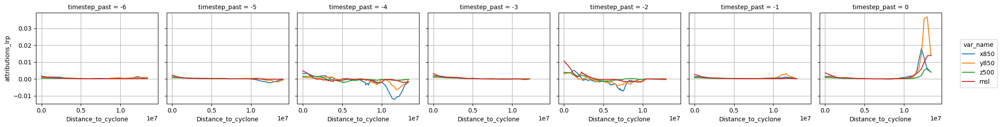

In [21]:
plot = attributions_per_distance.plot(col='timestep_past', hue='var_name')
for ax in plot.axes.flatten():
    ax.grid()

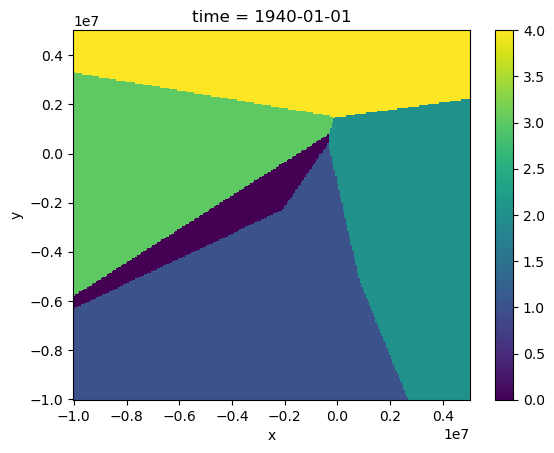

In [239]:
per_quadrant_distance.argmin('poly_id').plot()

<GeoAxes: xlabel='lon', ylabel='lat'>

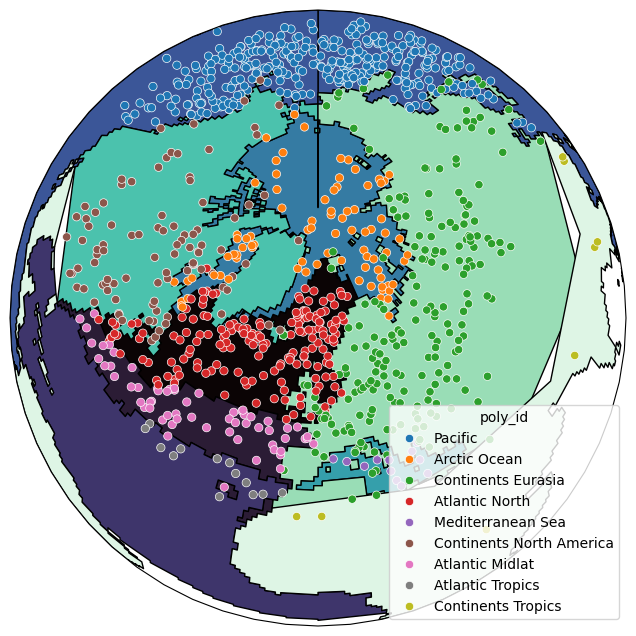

In [190]:
fig, ax = plt.subplots(figsize=(8,8), subplot_kw=dict(projection=ccrs.Orthographic(0,70)))
polygons_masks.plot(edgecolor="k", cmap="mako", transform=ccrs.PlateCarree(), ax=ax)
sns.scatterplot(joined.iloc[:1000], x='lon', y='lat', hue='poly_id', transform=ccrs.PlateCarree(), ax=ax)

In [191]:
joined

,day,track_id,lon,lat,x,y,msl,date,cyclone_area,geometry,index_right,poly_id
0,1979-01-01,1,-145.010387,36.963281,-3.542149e+06,5.061593e+06,98961.814241,1979-01-01,Pacific,POINT (-145.01039 36.96328),3.0,Pacific
1,1979-01-01,7,-160.078723,42.824026,-1.840414e+06,5.085164e+06,99253.688194,1979-01-01,Pacific,POINT (-160.07872 42.82403),3.0,Pacific
2,1979-01-01,13,152.595526,77.581176,5.844271e+05,1.211825e+06,99037.027416,1979-01-01,Polar,POINT (152.59553 77.58118),4.0,Arctic Ocean
3,1979-01-01,63,12.065410,44.373426,1.091410e+06,-5.094125e+06,98951.477756,1979-01-01,Others,POINT (12.06541 44.37343),7.0,Continents Eurasia
4,1979-01-01,67,22.982749,46.559554,1.928385e+06,-4.542190e+06,99036.757127,1979-01-01,Others,POINT (22.98275 46.55955),7.0,Continents Eurasia
...,...,...,...,...,...,...,...,...,...,...,...,...
172474,2022-12-30,913749,-161.736343,51.430592,-1.349414e+06,4.115647e+06,97158.861306,2022-12-30,Pacific,POINT (-161.73634 51.43059),3.0,Pacific
172475,2022-12-30,913756,-133.278541,50.209615,-3.258591e+06,3.074102e+06,98209.802497,2022-12-30,Pacific,POINT (-133.27854 50.20962),3.0,Pacific
172476,2022-12-30,913771,-174.195856,54.836449,-3.950826e+05,3.906900e+06,97279.452331,2022-12-30,Pacific,POINT (-174.19586 54.83645),3.0,Pacific
172477,2022-12-31,913749,-156.338028,53.923270,-1.620343e+06,3.697912e+06,97533.146954,2022-12-31,Pacific,POINT (-156.33803 53.92327),3.0,Pacific


In [ ]:
import xarray as xr
import numpy as np
from pyproj import Geod

geod = Geod(ellps="WGS84")

def geodesic_m(lat1, lon1, lat2, lon2):
    # returns distance in meters
    # pyproj.Geod.inv supports array inputs
    _, _, dist = geod.inv(lon1, lat1, lon2, lat2)
    return dist

In [189]:
grid_geo = grid.stack(space=['y','x']).to_dataframe()[['lon','lat']].reset_index()
grid_geo

,y,x,lon,lat
0,-10000000.0,-1.000000e+07,-45.000000,-7.882403
1,-10000000.0,-9.941176e+06,-44.830986,-7.714341
2,-10000000.0,-9.882353e+06,-44.660976,-7.546217
3,-10000000.0,-9.823529e+06,-44.489962,-7.378039
4,-10000000.0,-9.764706e+06,-44.317940,-7.209814
...,...,...,...,...
65531,5000000.0,4.764706e+06,136.380354,31.662121
65532,5000000.0,4.823529e+06,136.029155,31.373657
65533,5000000.0,4.882353e+06,135.682060,31.084170
65534,5000000.0,4.941176e+06,135.339024,30.793706
